In [1]:
# --- Install necessary libraries if running on Google Colab for the first time ---
!pip install pandas numpy scikit-learn matplotlib seaborn umap-learn shap

import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split, cross_val_score, StratifiedKFold
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report
from sklearn.feature_selection import RFE
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns
import umap
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE
from sklearn.metrics import silhouette_score
import shap

In [8]:
# --- 1. Import the CSV files ---

from google.colab import files
uploaded = files.upload()

cerebellum_df = pd.read_csv('cerebellum_DP.csv')
hippocampus_df = pd.read_csv('Hippocampus_DP.csv')
thalamus_df = pd.read_csv('Thallamus_DP.csv')
dpfc_df = pd.read_csv('DPFC_DP.csv')

# Drop the 'AdjustedPvalue' column as requested
cerebellum_df = cerebellum_df.drop('AdjustedPvalue', axis=1, errors='ignore')
hippocampus_df = hippocampus_df.drop('AdjustedPvalue', axis=1, errors='ignore')
thalamus_df = thalamus_df.drop('AdjustedPvalue', axis=1, errors='ignore')
dpfc_df = dpfc_df.drop('AdjustedPvalue', axis=1, errors='ignore')

# Display the first few rows of each DataFrame to verify import
print("\n--- Cerebellum Data ---")
print(cerebellum_df.head())
print("\n--- Hippocampus Data ---")
print(hippocampus_df.head())
print("\n--- Thalamus Data ---")
print(thalamus_df.head())
print("\n--- DPFC Data ---")
print(dpfc_df.head())

Saving Thallamus_DP.csv to Thallamus_DP.csv
Saving cerebellum_DP.csv to cerebellum_DP.csv
Saving DPFC_DP.csv to DPFC_DP.csv
Saving Hippocampus_DP.csv to Hippocampus_DP.csv

--- Cerebellum Data ---
   Accession     Gene    22week_Avg    26week_Avg     1year_Avg     2year_Avg  \
0  194595509   SPTAN1  3.403840e+07  3.919413e+07  9.294157e+07  8.739405e+07   
1  306966132   SPTAN1  4.195606e+04  3.812966e+04  5.112267e+04  4.313739e+04   
2  112382250   SPTBN1  2.644566e+07  2.713649e+07  5.056949e+07  5.641060e+07   
3   41322908     PLEC  1.892782e+07  2.540079e+07  1.675443e+07  2.700018e+07   
4   33350932  DYNC1H1  3.015181e+07  2.807374e+07  2.422420e+07  2.308685e+07   

      4year_Avg    22year_Avg    35year_Avg    47year_Avg    82year_Avg  
0  9.942501e+07  9.608898e+07  7.419488e+07  7.729604e+07  7.943433e+07  
1  5.185106e+04  4.920949e+04  6.345708e+04  7.081324e+04  5.019671e+04  
2  6.209550e+07  5.938049e+07  5.729526e+07  5.229569e+07  5.309978e+07  
3  1.748658e+07  1.5

In [ ]:
import numpy as np

# Select the relevant columns
hippocampus_comparison = hippocampus_df[['Gene', '22week_Avg', '26week_Avg']].copy()

# Calculate Fold Change (handling potential division by zero)
hippocampus_comparison['fold_change'] = np.where(
    hippocampus_comparison['22week_Avg'] != 0,
    hippocampus_comparison['26week_Avg'] / hippocampus_comparison['22week_Avg'],
    np.nan
)
hippocampus_comparison['abs_fold_change'] = np.abs(hippocampus_comparison['fold_change'])

# Calculate Absolute Difference
hippocampus_comparison['difference'] = hippocampus_comparison['26week_Avg'] - hippocampus_comparison['22week_Avg']
hippocampus_comparison['absolute_difference'] = abs(hippocampus_comparison['difference'])

# Sort by Absolute Fold Change
sorted_by_fold_change = hippocampus_comparison.sort_values(by='abs_fold_change', ascending=False)
print("\n--- Hippocampus Genes sorted by Absolute Fold Change (22 vs 26 weeks) ---")
print(sorted_by_fold_change.head())

# Sort by Absolute Difference
sorted_by_difference = hippocampus_comparison.sort_values(by='absolute_difference', ascending=False)
print("\n--- Hippocampus Genes sorted by Absolute Difference (22 vs 26 weeks) ---")
print(sorted_by_difference.head())


--- Hippocampus Genes sorted by Absolute Fold Change (22 vs 26 weeks) ---
           Gene    22week_Avg     26week_Avg  fold_change  abs_fold_change  \
1761       HBG1  11574.177385  654898.451600    56.582721        56.582721   
1617       ATP6    732.590515   10248.610295    13.989548        13.989548   
1899       MIB1   3289.429577   36787.347140    11.183503        11.183503   
393      TRIM67     73.900095     598.310313     8.096205         8.096205   
1281  NIPSNAP3B    947.786224    7423.729829     7.832705         7.832705   

         difference  absolute_difference  
1761  643324.274215        643324.274215  
1617    9516.019780          9516.019780  
1899   33497.917563         33497.917563  
393      524.410218           524.410218  
1281    6475.943605          6475.943605  

--- Hippocampus Genes sorted by Absolute Difference (22 vs 26 weeks) ---
           Gene    22week_Avg    26week_Avg  fold_change  abs_fold_change  \
2642   HIST1H4H  1.383284e+08  4.229936e+07    

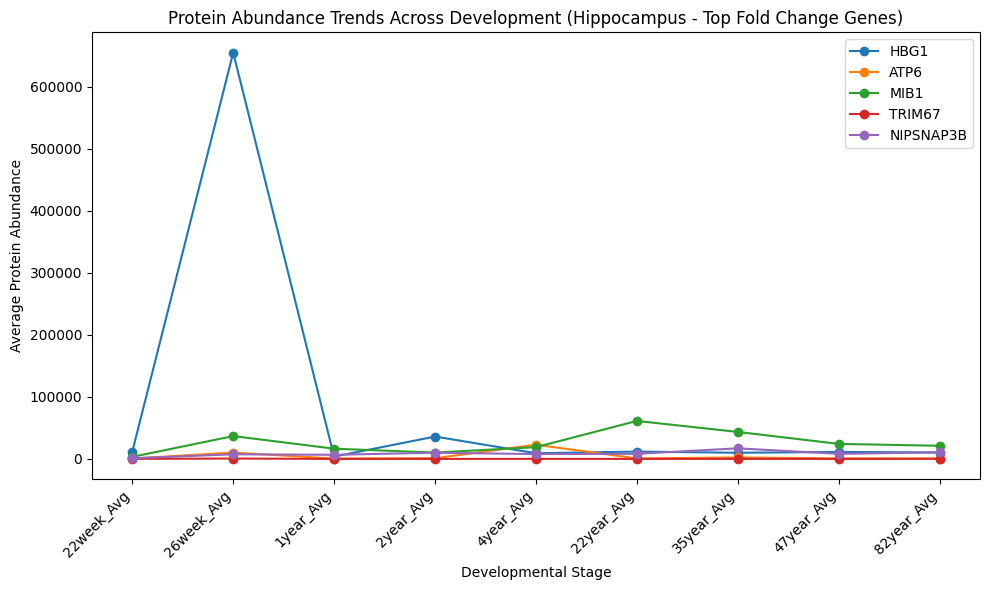

In [ ]:
import matplotlib.pyplot as plt

# Assuming you have columns for all 9 stages
stage_columns = ['22week_Avg', '26week_Avg', '1year_Avg', '2year_Avg', '4year_Avg', '22year_Avg', '35year_Avg', '47year_Avg', '82year_Avg']

# Let's pick a few genes to visualize (you can select based on the fold change results)
genes_to_plot = sorted_by_fold_change['Gene'].head(5).tolist()

plt.figure(figsize=(10, 6))
for gene in genes_to_plot:
    abundance = hippocampus_df[hippocampus_df['Gene'] == gene][stage_columns].values.flatten()
    plt.plot(stage_columns, abundance, marker='o', label=gene)

plt.xlabel("Developmental Stage")
plt.ylabel("Average Protein Abundance")
plt.title("Protein Abundance Trends Across Development (Hippocampus - Top Fold Change Genes)")
plt.xticks(rotation=45, ha='right')
plt.legend()
plt.tight_layout()
plt.show()

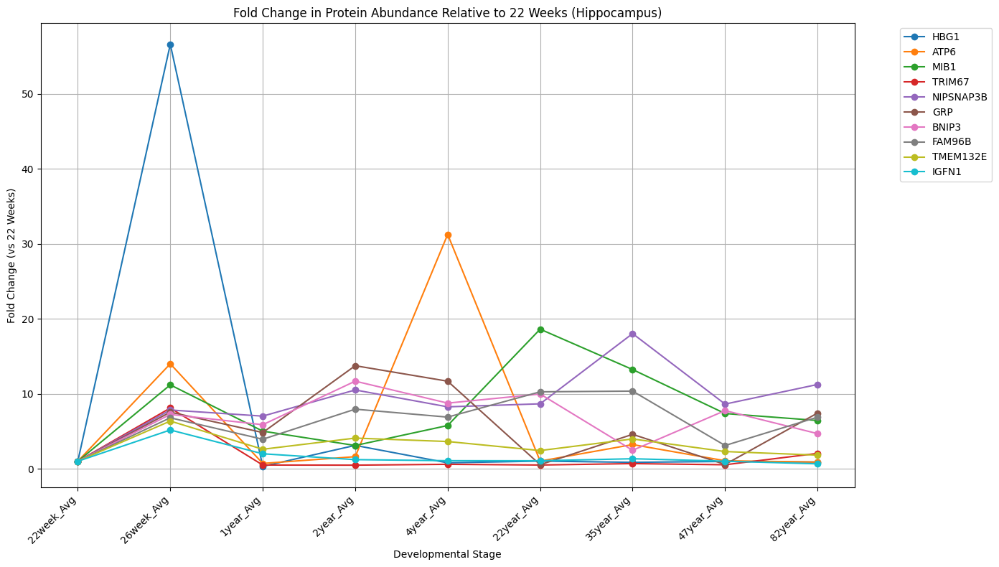

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Assuming these are your 9 developmental stage columns in order
stage_columns = ['22week_Avg', '26week_Avg', '1year_Avg', '2year_Avg', '4year_Avg', '22year_Avg', '35year_Avg', '47year_Avg', '82year_Avg']

# Select the 'Gene' column and the stage columns from your hippocampus DataFrame
if 'Gene' in hippocampus_df.columns:
    fold_change_df = hippocampus_df[['Gene'] + stage_columns].copy()

    # Calculate fold change relative to '22week_Avg' for all other stages
    for stage in stage_columns:
        #if stage != '22week_Avg':
            fold_change_df[f'{stage}_FoldChange_vs_22week'] = np.where(
                fold_change_df['22week_Avg'] != 0,
                fold_change_df[stage] / fold_change_df['22week_Avg'],
                np.nan
            )

    # Display the first few rows of the DataFrame with fold change values
    #print("\n--- Hippocampus Data with Fold Change Relative to 22 Weeks ---")
    #print(fold_change_df.head())
    fold_change_df1 = fold_change_df.sort_values(by="26week_Avg_FoldChange_vs_22week", ascending=False)
    fold_change_df2 = fold_change_df.sort_values(by="22year_Avg_FoldChange_vs_22week", ascending=False)

    # --- Optional: Visualize fold changes for a few genes ---
    genes_to_plot = fold_change_df1['Gene'].head(10).tolist()
    fold_change_columns_to_plot = [col for col in fold_change_df.columns if 'FoldChange_vs_22week' in col]
    stage_labels_for_plot = [col.split('_FoldChange')[0] for col in fold_change_columns_to_plot] # Extract stage names

    plt.figure(figsize=(14, 8))
    for gene in genes_to_plot:
        fold_change_values = fold_change_df[fold_change_df['Gene'] == gene][fold_change_columns_to_plot].values.flatten()
        plt.plot(stage_labels_for_plot, fold_change_values, marker='o', label=gene)

    plt.xlabel("Developmental Stage")
    plt.ylabel("Fold Change (vs 22 Weeks)")
    plt.title("Fold Change in Protein Abundance Relative to 22 Weeks (Hippocampus)")
    plt.xticks(rotation=45, ha='right')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.grid(True)
    plt.show()

else:
    print("\nError: 'Gene' column not found in the DataFrame.")

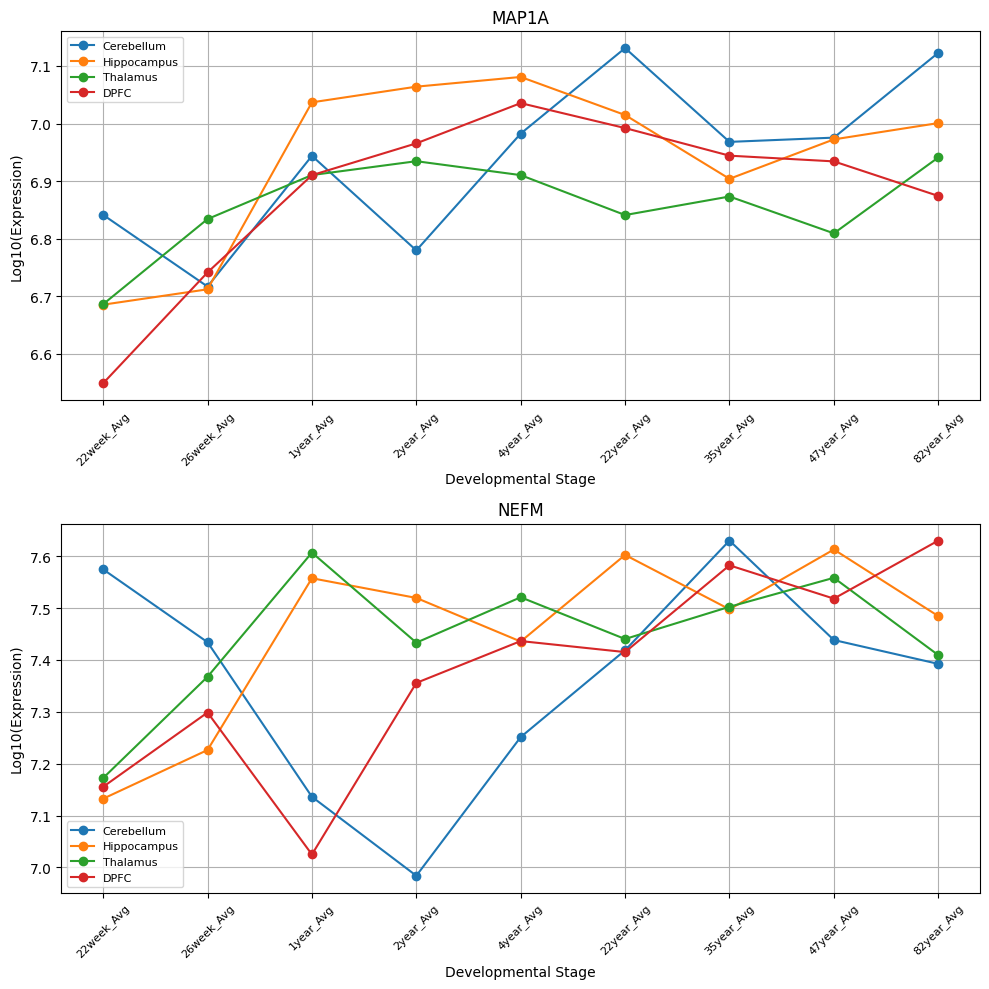

In [10]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

def plot_log_expression(brain_regions, stage_columns, id_list, plot_type='per_gene', id_type='gene'):
    """
    Plots log10 expression values for genes/accessions across brain regions and developmental stages.

    Args:
        brain_regions (dict): Dictionary of {region_name: DataFrame} containing expression data
        stage_columns (list): List of developmental stage columns (e.g., ['22week_Avg', ...])
        id_list (list): List of gene names or accession IDs to analyze
        plot_type (str): 'per_gene' (one plot per gene) or 'grid' (gene x region grid)
        id_type (str): 'gene' (default) or 'accession' to specify ID type
    """
    # Validate inputs
    if id_type not in ['gene', 'accession']:
        raise ValueError("id_type must be 'gene' or 'accession'")
    if plot_type not in ['per_gene', 'grid']:
        raise ValueError("plot_type must be 'per_gene' or 'grid'")

    id_col = 'Gene' if id_type == 'gene' else 'Accession'
    num_ids = len(id_list)
    num_regions = len(brain_regions)

    if plot_type == 'per_gene':
        fig, axes = plt.subplots(num_ids, 1, figsize=(10, 5*num_ids))
        axes = np.array([axes]).flatten()  # Handle single gene case

        for i, identifier in enumerate(id_list):
            ax = axes[i]
            gene_name = None

            # Get gene name for accessions
            if id_type == 'accession':
                for region_name, df in brain_regions.items():
                    match = df[df[id_col] == identifier]
                    if not match.empty:
                        gene_name = match['Gene'].values[0]
                        break

            # Plot each region's expression
            for region_name, df in brain_regions.items():
                match = df[df[id_col] == identifier]
                if not match.empty:
                    expr_values = match[stage_columns].values[0]
                    log_expr = np.log10(expr_values)  # Add small constant to avoid log(0)
                    label = f"{region_name} ({gene_name})" if gene_name else region_name
                    ax.plot(stage_columns, log_expr, marker='o', label=label)
                else:
                    print(f"Warning: {id_type} '{identifier}' not found in {region_name}")

            # Configure plot
            title = f"{identifier} ({gene_name})" if gene_name else identifier
            ax.set_title(f"{title}", fontsize=12)

            #ax.set_title(f"Log10 Expression: {title}", fontsize=12)
            ax.set_xlabel("Developmental Stage", fontsize=10)
            ax.set_ylabel("Log10(Expression)", fontsize=10)
            ax.tick_params(axis='x', rotation=45, labelsize=8)
            ax.legend(fontsize=8)
            ax.grid(True)

        plt.tight_layout()
        plt.show()

    elif plot_type == 'grid':
        fig, axes = plt.subplots(num_ids, num_regions, figsize=(15, 5*num_ids))
        # Handle axes indexing for edge cases
        if num_ids == 1:
            axes = np.array([axes])
        if num_regions == 1:
            axes = np.array([[ax] for ax in axes])

        for i, identifier in enumerate(id_list):
            for j, (region_name, df) in enumerate(brain_regions.items()):
                ax = axes[i][j]
                gene_name = None

                match = df[df[id_col] == identifier]
                if not match.empty:
                    # Get gene name for accessions
                    if id_type == 'accession':
                        gene_name = match['Gene'].values[0]

                    # Calculate log expression
                    expr_values = match[stage_columns].values[0]
                    log_expr = np.log10(expr_values)
                    ax.plot(stage_columns, log_expr, marker='o')

                # Configure subplot
                title = f"{id_type.capitalize()}: {identifier}"
                if gene_name:
                    title += f"\n({gene_name})"
                title += f"\nRegion: {region_name}"
                ax.set_title(title, fontsize=9)
                ax.set_xlabel("Stage", fontsize=8)
                ax.set_ylabel("Log10(Expr)", fontsize=8)
                ax.tick_params(axis='x', rotation=45, labelsize=6)
                ax.grid(True)

        plt.tight_layout()
        plt.show()

# Example usage:
brain_regions = {
     'Cerebellum': cerebellum_df,
     'Hippocampus': hippocampus_df,
     'Thalamus': thalamus_df,
     'DPFC': dpfc_df
 }

stage_columns = ['22week_Avg', '26week_Avg', '1year_Avg', '2year_Avg',
                 '4year_Avg', '22year_Avg', '35year_Avg', '47year_Avg', '82year_Avg']

genes_to_analyze = ['BACE1', 'APP', 'SMOC1', 'CHL1']
genes_to_analyze = ['BACE1']
genes_to_analyze = ['APP', 'MAPT', 'NEFL'] #proteins incease in AD but decrease in ours
genes_to_analyze = ['MAP1A', 'NEFM']

plot_log_expression(brain_regions, stage_columns, genes_to_analyze, plot_type='per_gene')


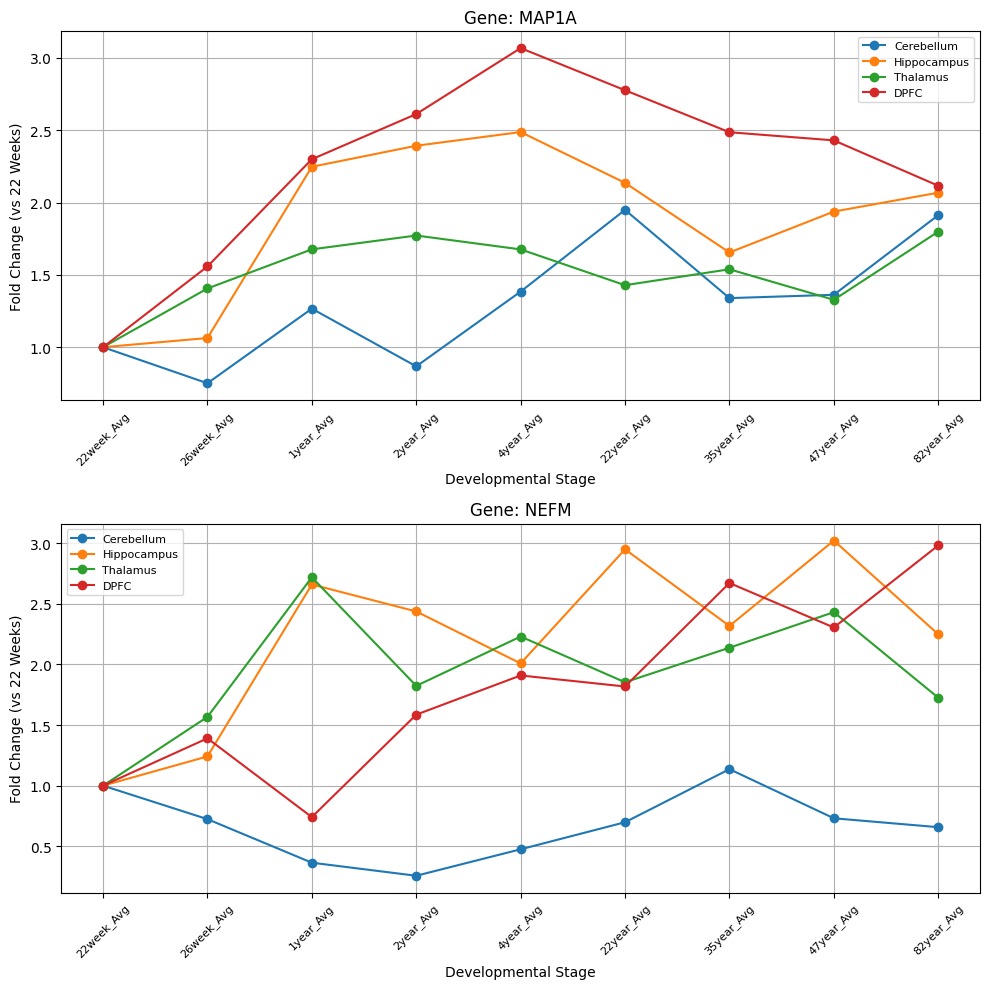

In [9]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Assuming these are your 9 developmental stage columns in order
stage_columns = ['22week_Avg', '26week_Avg', '1year_Avg', '2year_Avg', '4year_Avg', '22year_Avg', '35year_Avg', '47year_Avg', '82year_Avg']

brain_regions = {'Cerebellum': cerebellum_df,
                    'Hippocampus': hippocampus_df,
                    'Thalamus': thalamus_df,
                    'DPFC': dpfc_df}

def analyze_gene_dynamics_across_regions(brain_regions, stage_columns, id_list, plot_type='per_gene', id_type='gene'):
    """
    Analyzes expression dynamics for genes OR accessions across brain regions.

    Args:
        brain_regions (dict): Dict of {region_name: DataFrame} with 'Gene'/'Accession' columns
        stage_columns (list): Developmental stage columns (e.g., ['22week_Avg', ...])
        id_list (list): List of gene names OR accession IDs to analyze
        plot_type (str): 'per_gene', 'per_region', or 'grid'
        id_type (str): 'gene' (default) or 'accession' to specify ID type
    """
    # Validate ID type
    if id_type not in ['gene', 'accession']:
        print("Error: id_type must be 'gene' or 'accession'")
        return

    # Determine column to search based on ID type
    id_col = 'Gene' if id_type == 'gene' else 'Accession'

    if not id_list:
        print(f"Error: {id_type}_list is empty.")
        return

    if plot_type not in ['per_gene', 'per_region', 'grid']:
        print("Error: Invalid plot_type.")
        return

    num_regions = len(brain_regions)
    num_ids = len(id_list)

    if plot_type == 'per_gene':
        fig, axes = plt.subplots(nrows=num_ids, ncols=1, figsize=(10, 5 * num_ids))
        axes = [axes] if num_ids == 1 else axes

        for i, identifier in enumerate(id_list):
            ax = axes[i]
            gene_name = None  # Initialize gene name for accessions

            # Get gene name if ID type is accession
            if id_type == 'accession':
                for region_name, df in brain_regions.items():
                    id_data = df[df[id_col] == identifier]
                    if not id_data.empty:
                        gene_name = id_data['Gene'].values[0]
                        break
                if not gene_name:
                    print(f"Accession {identifier} not found. Skipping.")
                    continue

            # Plot for each region
            for region_name, df in brain_regions.items():
                id_data = df[df[id_col] == identifier]
                if not id_data.empty:
                    expression_values = id_data[stage_columns].values[0]
                    first_stage_value = expression_values[0]
                    fold_change = expression_values / first_stage_value if first_stage_value != 0 else np.full_like(expression_values, np.nan)
                    label = f"{region_name} ({gene_name})" if id_type == 'accession' else region_name
                    ax.plot(stage_columns, fold_change, marker='o', label=label)
                else:
                    print(f"Warning: {id_type} '{identifier}' not found in {region_name}")

            # Set title with gene name for accessions
            title = f"{id_type.capitalize()}: {identifier} ({gene_name})" if id_type == 'accession' else f"Gene: {identifier}"
            ax.set_title(title)
            ax.set_xlabel("Developmental Stage")
            ax.set_ylabel("Fold Change (vs 22 Weeks)")
            ax.tick_params(axis='x', rotation=45, labelsize=8)
            ax.legend(fontsize=8)
            ax.grid(True)
        plt.tight_layout()
        plt.show()
        #return fig #remove this line when you do normal

    elif plot_type == 'grid':
        fig, axes = plt.subplots(nrows=num_ids, ncols=num_regions, figsize=(15, 5 * num_ids))
        # Handle axes indexing for single row/column cases
        if num_ids == 1:
            axes = [axes] if num_regions == 1 else [axes]
        if num_regions == 1:
            axes = [[ax] for ax in axes]

        for i, identifier in enumerate(id_list):
            for j, (region_name, df) in enumerate(brain_regions.items()):
                ax = axes[i][j]
                id_data = df[df[id_col] == identifier]
                gene_name = None

                if not id_data.empty:
                    # Extract gene name for accessions
                    if id_type == 'accession':
                        gene_name = id_data['Gene'].values[0]

                    expression_values = id_data[stage_columns].values[0]
                    first_stage_value = expression_values[0]
                    fold_change = expression_values / first_stage_value if first_stage_value != 0 else np.full_like(expression_values, np.nan)
                    ax.plot(stage_columns, fold_change, marker='o')

                # Build title with gene name if available
                title = f"{id_type.capitalize()}: {identifier}"
                if gene_name:
                    title += f"\n({gene_name})"
                title += f"\nRegion: {region_name}"
                ax.set_title(title, fontsize=9)
                ax.set_xlabel("Stage", fontsize=8)
                ax.set_ylabel("Fold Change", fontsize=8)
                ax.tick_params(axis='x', rotation=45, labelsize=6)
                ax.grid(True)
        plt.tight_layout()
        plt.show()
        #return fig #remove this line when you do normal


# Example usage:
genes_to_analyze = ['CHL1', 'DCN', 'NCS1', 'PRSS2', 'PTX3', 'SMOC1', 'TFRC', 'TNC'] #proteins incease in AD but decrease in ours
genes_to_analyze = ['MAP1A', 'NEFM']
#genes_to_analyze = ['APP', 'MAPT'] #proteins incease in AD but decrease in ours

#genes_to_analyze = ['EGFR', 'ITGB1', 'SRC', 'VIM', 'ITGAM', 'GFAP']
ad_proteins_19 = [
    "KLK4", "CD8A", "LIFR", "HK14", "AOC3", "GSAP", "NELL1", "GAMT",
    "CD164", "LGMN", "VPS37A", "VAMP5", "NFKBIE", "TMSB10", "PRKCQ",
    "PRDX1", "CASP3", "CETN2", "LYN"
]

# 1. Plot dynamics per gene, across all regions
#analyze_gene_dynamics_across_regions(brain_regions, stage_columns, genes_to_analyze, plot_type='per_gene')

# 2. Plot dynamics per region, for all specified genes
#analyze_gene_dynamics_across_regions(brain_regions, stage_columns, genes_to_analyze, plot_type='per_region')

# 3. Plot dynamics in a grid (gene x region)
analyze_gene_dynamics_across_regions(brain_regions, stage_columns, genes_to_analyze, plot_type='per_gene', id_type='gene')


<ipython-input-75-a31140fc099c>:73: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(


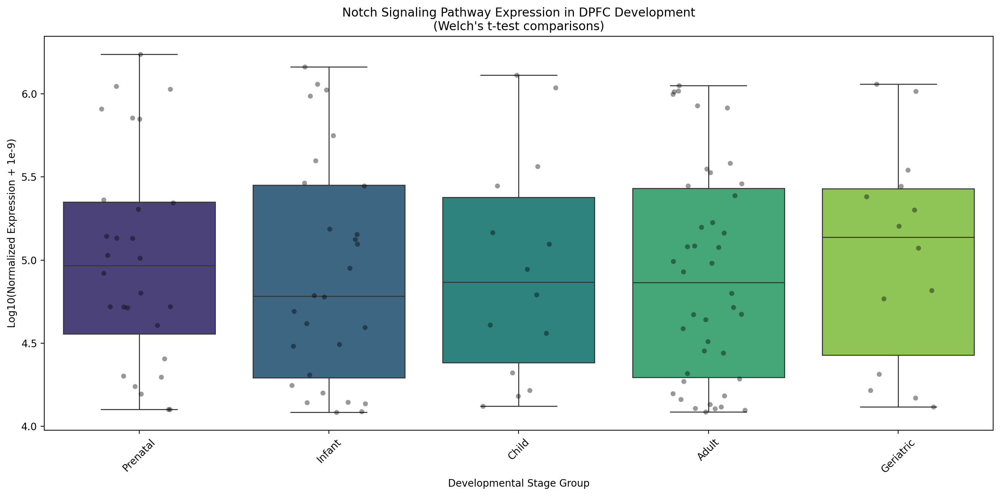

DPFC
['CTBP1', 'NUMBL', 'HDAC2', 'NUMB', 'ITCH', 'CTBP2', 'PSEN1', 'DVL1', 'SNW1', 'NCSTN', 'DTX3', 'DVL2', 'APH1A', 'PSEN2']
14
Significant pairwise comparisons:
All pairwise comparisons:
Prenatal vs Infant: p = 0.62431 (ns)
Infant vs Child: p = 0.93086 (ns)
Child vs Adult: p = 0.87717 (ns)
Adult vs Geriatric: p = 0.55233 (ns)


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy import stats

region = 'DPFC'
# Load and preprocess data
cerebellum_df = brain_regions[region]
notch_cerebellum = cerebellum_df[cerebellum_df['Gene'].isin(notch_genes)].copy()

# Melt data and clean stages
melted = notch_cerebellum.melt(
    id_vars=['Gene'],
    value_vars=stage_columns,
    var_name='Stage',
    value_name='Expression'
)
melted['Stage'] = melted['Stage'].str.replace('_Avg', '')

# Log10 normalization
melted['Expression'] = melted['Expression'] + 1e-9
melted['Log10_Expression'] = np.log10(melted['Expression'])

# Developmental grouping
stage_groups = {
    'Prenatal': ['22week', '26week'],
    'Infant': ['1year', '2year'],
    'Child': ['4year'],
    'Adult': ['22year', '35year', '47year'],
    'Geriatric': ['82year']
}
melted['Stage_Group'] = melted['Stage'].apply(
    lambda x: next((k for k,v in stage_groups.items() if x in v), 'Unknown')
)

# Define comparison groups
groups_order = ['Prenatal', 'Infant', 'Child', 'Adult', 'Geriatric']
comparisons = [(groups_order[i], groups_order[i+1]) for i in range(len(groups_order)-1)]

# Function to determine significance symbols
def get_significance(p_val):
    if p_val < 0.0001:
        return '****'
    elif p_val < 0.001:
        return '***'
    elif p_val < 0.01:
        return '**'
    elif p_val < 0.05:
        return '*'
    else:
        return 'ns'

# Perform statistical analysis
significant_comparisons = []
for g1, g2 in comparisons:
    data1 = melted[melted['Stage_Group'] == g1]['Log10_Expression']
    data2 = melted[melted['Stage_Group'] == g2]['Log10_Expression']

    # Check sufficient sample size
    if len(data1) > 1 and len(data2) > 1:
        _, p_val = stats.ttest_ind(data1, data2, equal_var=False)
        symbol = get_significance(p_val)
        if symbol != 'ns':
            significant_comparisons.append({
                'groups': (g1, g2),
                'p_val': p_val,
                'symbol': symbol
            })

# Visualization
plt.figure(figsize=(14, 7))
ax = sns.boxplot(
    x='Stage_Group',
    y='Log10_Expression',
    data=melted,
    order=groups_order,
    palette='viridis',
    showfliers=False
)

sns.stripplot(
    x='Stage_Group',
    y='Log10_Expression',
    data=melted,
    order=groups_order,
    color='black',
    alpha=0.4,
    jitter=0.2,
    size=5,
    ax=ax
)

# Add significance annotations
y_max = melted['Log10_Expression'].max() + 0.5
for comp in significant_comparisons:
    g1, g2 = comp['groups']
    x1 = groups_order.index(g1)
    x2 = groups_order.index(g2)

    # Draw line
    ax.plot([x1, x2], [y_max, y_max], color='k', lw=1)

    # Add symbol
    ax.text((x1+x2)/2, y_max + 0.1, comp['symbol'],
            ha='center', va='bottom', color='k')

    y_max += 0.5  # Offset for next annotation

plt.title(f'Notch Signaling Pathway Expression in {region} Development\n(Welch\'s t-test comparisons)')
plt.xlabel('Developmental Stage Group')
plt.ylabel('Log10(Normalized Expression + 1e-9)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

print(f"{region}")
print(notch_cerebellum['Gene'].tolist())
print(len(notch_cerebellum))

# Print statistical results
print("Significant pairwise comparisons:")
for comp in significant_comparisons:
    print(f"{comp['groups'][0]} vs {comp['groups'][1]}:")
    print(f"  p-value = {comp['p_val']:.5f} ({comp['symbol']})")

# Print all comparisons (modified code)
print("All pairwise comparisons:")
for g1, g2 in comparisons:
    data1 = melted[melted['Stage_Group'] == g1]['Log10_Expression']
    data2 = melted[melted['Stage_Group'] == g2]['Log10_Expression']

    if len(data1) > 1 and len(data2) > 1:
        _, p_val = stats.ttest_ind(data1, data2, equal_var=False)
        symbol = get_significance(p_val)
        print(f"{g1} vs {g2}: p = {p_val:.5f} ({symbol})")
    else:
        print(f"{g1} vs {g2}: Insufficient data")


In [ ]:
import os

accession_to_gene = {}
for df in brain_regions.values():
    for _, row in df.iterrows():
        accession_to_gene[row['Accession']] = row['Gene']

os.makedirs('plots', exist_ok=True)

for accession in filtered_accessions:
    gene_name = accession_to_gene.get(accession, 'unknown_gene')
    fig = analyze_gene_dynamics_across_regions(
        brain_regions, stage_columns, [accession], plot_type='grid', id_type='accession'
    )
    safe_gene = "".join(c if c.isalnum() or c in (' ', '.', '_') else '_' for c in gene_name)
    safe_accession = "".join(c if c.isalnum() or c in (' ', '.', '_') else '_' for c in accession)
    filename = f'plots/{safe_gene}_{safe_accession}.png'
    fig.savefig(filename)
    plt.close(fig)

import shutil
shutil.make_archive('plots', 'zip', 'plots')
from google.colab import files
files.download('plots.zip')


In [ ]:
import math
#https://maayanlab.cloud/Enrichr/#meta!meta=parkinson

genes_per_page = 10  # or any number you find manageable
num_pages = math.ceil(len(filtered_accessions) / genes_per_page)

def analyze_gene_dynamics_across_regions_all(brain_regions, stage_columns, id_list, plot_type='per_gene', id_type='gene'):
    """
    Analyzes expression dynamics for genes/accessions present in ALL brain regions.
    """
    import numpy as np
    import matplotlib.pyplot as plt

    # Validate ID type
    if id_type not in ['gene', 'accession']:
        print("Error: id_type must be 'gene' or 'accession'")
        return

    id_col = 'Gene' if id_type == 'gene' else 'Accession'

    if not id_list:
        print(f"Error: {id_type}_list is empty.")
        return

    # Filter IDs present in ALL regions
    valid_ids = []
    for identifier in id_list:
        if all(identifier in df[id_col].values for df in brain_regions.values()):
            valid_ids.append(identifier)


    if not valid_ids:
        print("No valid IDs to plot")
        return

    num_regions = len(brain_regions)
    num_ids = len(valid_ids)

    if plot_type == 'grid':
        fig, axes = plt.subplots(num_ids, num_regions, figsize=(15, 3*num_ids))
        fig.subplots_adjust(hspace=0.5, wspace=0.3)

        # Handle axes indexing
        if num_ids == 1:
            axes = [axes] if num_regions == 1 else [axes]
        if num_regions == 1:
            axes = [[ax] for ax in axes]

        for i, identifier in enumerate(valid_ids):
            gene_name = None
            for j, (region_name, df) in enumerate(brain_regions.items()):
                ax = axes[i][j]
                id_data = df[df[id_col] == identifier]

                # Get gene name if using accessions
                if id_type == 'accession':
                    gene_name = id_data['Gene'].iloc[0]

                # Plot expression
                expr_values = id_data[stage_columns].iloc[0].values.astype(float)
                baseline = expr_values[0]
                fold_change = expr_values / baseline if baseline != 0 else np.full_like(expr_values, np.nan)

                ax.plot(stage_columns, fold_change, marker='o', markersize=4)

                # Title formatting
                title = f"{identifier}\n({gene_name})" if id_type == 'accession' else identifier
                ax.set_title(f"{title}\n{region_name}", fontsize=8)
                ax.tick_params(axis='x', rotation=45, labelsize=6)
                ax.grid(True, alpha=0.3)

        plt.show()
        return fig #normal

    else:
        print("Only 'grid' plot_type supported for this validation mode")


#for page in range(num_pages):
#    start = page * genes_per_page
#    end = start + genes_per_page
#    genes_subset = filtered_accessions[start:end]
#    analyze_gene_dynamics_across_regions_all(
#        brain_regions, stage_columns, genes_subset, plot_type='grid', id_type='accession'
#    )

import os

accession_to_gene = {}
for df in brain_regions.values():
    for _, row in df.iterrows():
        accession_to_gene[row['Accession']] = row['Gene']

os.makedirs('plots_all', exist_ok=True)

for accession in filtered_accessions:
    gene_name = accession_to_gene.get(accession, 'unknown_gene')
    fig = analyze_gene_dynamics_across_regions_all(
        brain_regions, stage_columns, [accession], plot_type='grid', id_type='accession'
    )
    safe_gene = "".join(c if c.isalnum() or c in (' ', '.', '_') else '_' for c in gene_name)
    safe_accession = "".join(c if c.isalnum() or c in (' ', '.', '_') else '_' for c in accession)
    filename = f'plots_all/{safe_gene}_{safe_accession}.png'
    if fig is not None:
      fig.savefig(filename)
      plt.close(fig)

import shutil
shutil.make_archive('plots_all_3', 'zip', 'plots_all')
from google.colab import files
files.download('plots_all.zip')


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

def plot_gene_across_regions(brain_regions, stage_columns, gene_list, normalize=True):
    """
    Plots developmental expression trajectories for multiple genes,
    with all brain regions in a single plot per gene.

    Args:
        brain_regions (dict): {region_name: DataFrame} with 'Gene' column
        stage_columns (list): Developmental stage columns (ordered)
        gene_list (list): Genes to plot (one plot per gene)
        normalize (bool): Whether to show fold change relative to first stage (default: True)
    """
    for gene in gene_list:
        plt.figure(figsize=(10, 6))

        # Plot each region's data
        for region_name, df in brain_regions.items():
            gene_data = df[df['Gene'] == gene]

            if not gene_data.empty:
                # Take first accession if multiple entries
                expr_values = gene_data[stage_columns].iloc[0].values.astype(float)

                if normalize:
                    baseline = expr_values[0]
                    y_values = expr_values / baseline if baseline != 0 else np.full_like(expr_values, np.nan)
                    y_label = "Fold Change (vs 22 Weeks)"
                else:
                    y_values = expr_values
                    y_label = "Expression Level"

                plt.plot(stage_columns, y_values,
                         marker='o', linestyle='-',
                         label=region_name)

        # Plot formatting
        plt.title(f"Developmental Expression: {gene}", fontsize=14)
        plt.xlabel("Developmental Stage", fontsize=12)
        plt.ylabel(y_label, fontsize=12)
        plt.xticks(rotation=45, ha='right', fontsize=10)
        plt.yticks(fontsize=10)
        plt.legend(fontsize=10, frameon=True)
        plt.grid(True, alpha=0.3)
        plt.tight_layout()
        plt.show()

stage_columns = ['22week_Avg', '26week_Avg', '1year_Avg', '2year_Avg', '4year_Avg', '22year_Avg', '35year_Avg', '47year_Avg', '82year_Avg']
brain_regions = {'Cerebellum': cerebellum_df,
                 'Hippocampus': hippocampus_df,
                 'Thalamus': thalamus_df,
                 'DPFC': dpfc_df}
#genes_to_plot_up_parkinson_up = ['HAPLN2', 'CD9', 'APOD', 'ANLN','ENPP6', 'MYLK', 'LIPE' , 'NFASC','MYO1D' ,'SIRT2', 'RHOG' ,'MYADM', 'SCCPDH' , 'HSPA2', 'PHB' ,'LAMAS', 'SLC44A1', 'PIP4K2C', 'GNG7', 'IDH3G', 'ACADVL', 'LHPP', 'IDH3B', 'TMEM109', 'CLDN11', 'CA2']
'''genes_to_plot_down_parkinson_up = [
    'ABAT','ACOT13','ADAM23','ALDH1A1','ALDH5A1','ANK2','AP2A1','APOO','APOOL','ARHGAP44',
    'ATP2B2','ATP6V1C1','ATP6V1F','BSN','CACNB4','CACNG2','CADM2','CADM3','CADPS','CADPS2',
    'CEND1','CISD1','CLTB','CLTC','COX7B','CPLX2','CYB5R1','DDAH1','DLAT','DLD','DNM1L',
    'DPP10','EHD3','FAM162A','FH','GABBR1','GABBR2','GFM1','GNAO1','GNB5','GNG3','GP1',
    'HK1','HSPA4L','IMPA1','INPP5A','LDHB','LSAMP','MAPK1','MAPRE3','ME1','ME3','MRPS36',
    'NCEH1','NDUFAS','NDUFA10','NDUFS1','NEFL','NNT','OGDHL','OXCT1','PDHX','PKFM','PRRT3',
    'PSD3','RAP1GAP','RAPGEF4','RGS7','SCAMP5','SCN2A','SFXN1','SGIP1','SH3GL2','SIAE',
    'SLC2A3','SLC8A2','SLC25A11','SLC25A25','SLC30A9','SNCG','SOD1','SPTBN2','SV2A','SYNE1',
    'SYNG1','SYT1','TMEM30A','TOMM70','UBXN6','VPS13A'
]

#genes_to_plot_down_parkinson_down = [
    'ADGRL3','ATXN10','BLVRA','CAPRIN1','CEP170','CETN2','CRMP1','CSNK2A1','CTNNA2','DCX',
    'DENR','EIF2S1','EXOC1','FKBP3','GAP43','GLOD4','GSK3B','HEBP2','HOOK3','IGSF3','KIAA1143',
    'KIF3A','KPNB1','MACROD2','MAP2','MARK1','MCTS1','NCAM1','NELL2','NRXN1','NRXN2','NUCB2',
    'NUDCD1','PAK3','PDCD5','PPAT','PPFIA2','PPP2R1A','PPP2R5E','PSIP1','PSMD1','PTN','RNMT',
    'RRM1','SARNP','SCFD1','SCRN3','SEC31A','SPAST','STAU2','STX12','SUB1','TAOK1','TBCA',
    'TCEAL5','TSN','TTR','TUBB2B','TUBB3','UBE2V2','UBE3A','VPS26B','XKR4','ZC2HC1A'
]

#BASP1 GENE ON TEENS,
plot_gene_across_regions(brain_regions, stage_columns, genes_to_plot)'''


plot_gene_across_regions(brain_regions, stage_columns, notch_genes_dataset)



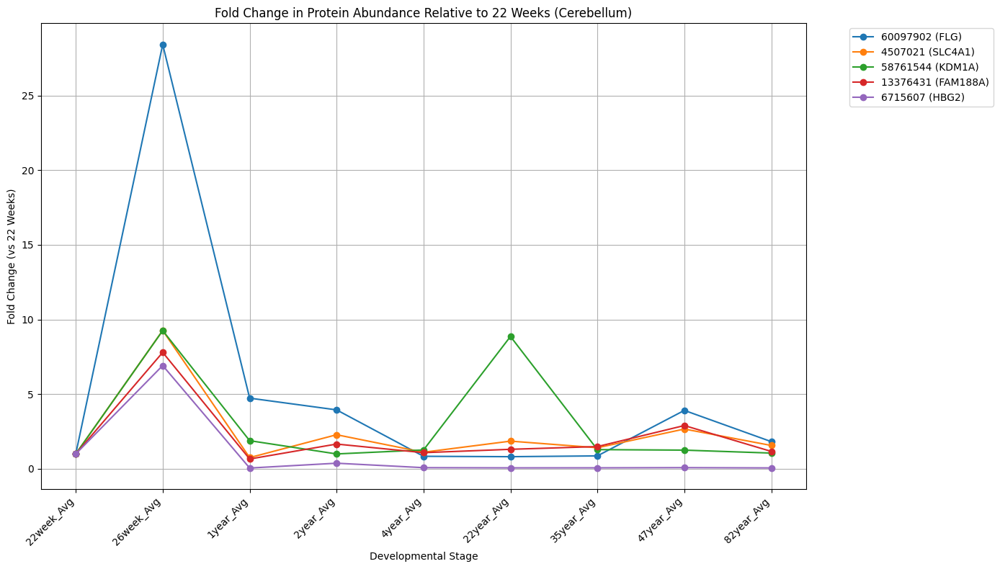

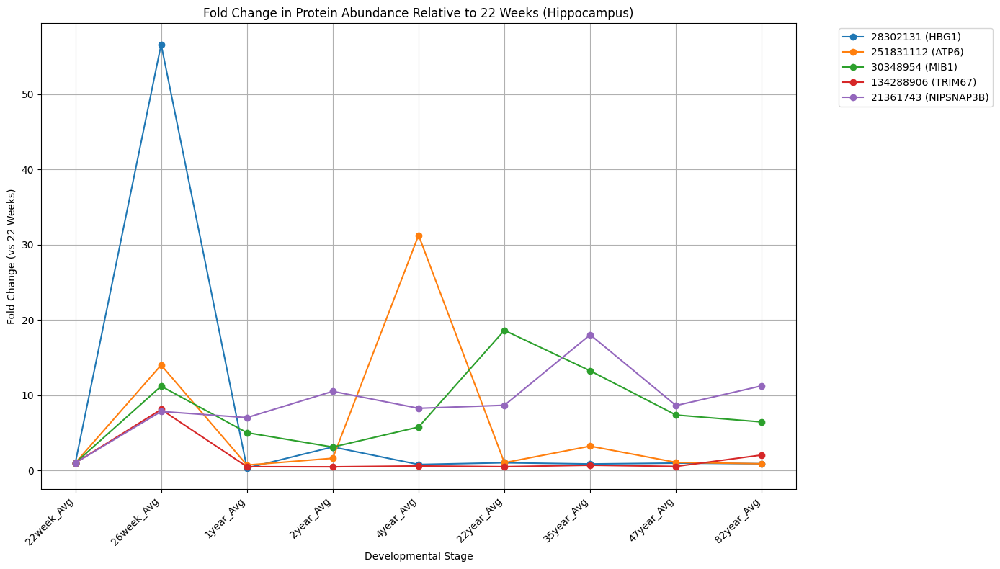

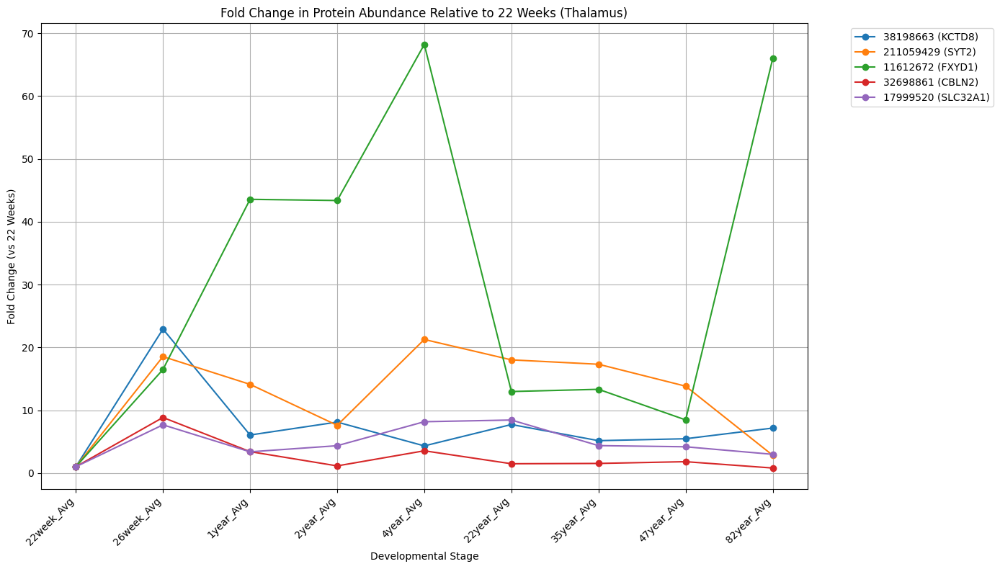

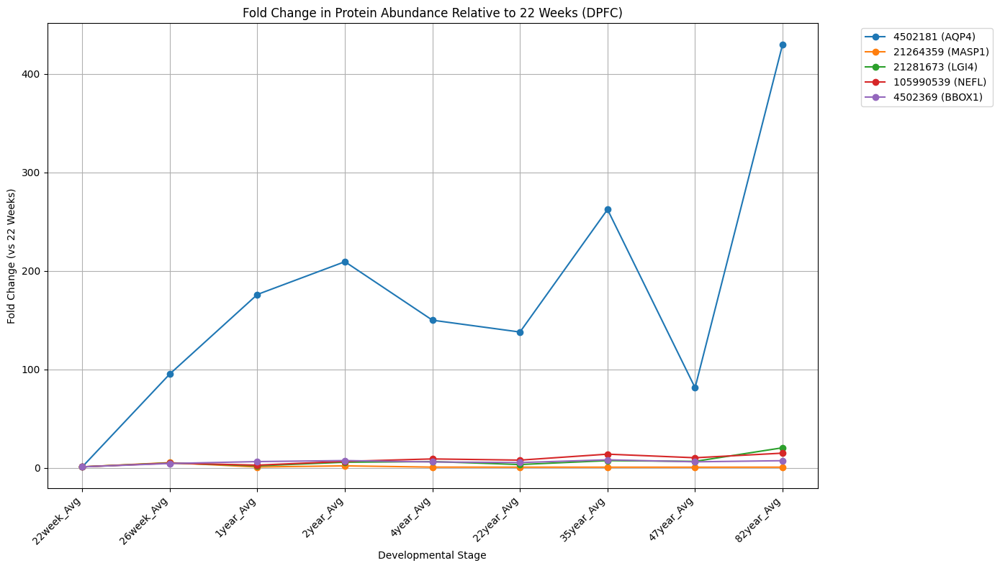

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Assuming these are your 9 developmental stage columns in order
stage_columns = ['22week_Avg', '26week_Avg', '1year_Avg', '2year_Avg', '4year_Avg', '22year_Avg', '35year_Avg', '47year_Avg', '82year_Avg']
brain_regions = {'Cerebellum': cerebellum_df,
                 'Hippocampus': hippocampus_df,
                 'Thalamus': thalamus_df,
                 'DPFC': dpfc_df}

for region_name, df in brain_regions.items():
    if 'Accession' in df.columns and 'Gene' in df.columns:
        fold_change_df = df[['Accession', 'Gene'] + stage_columns].copy()

        # Calculate fold change relative to '22week_Avg' for all other stages
        for stage in stage_columns:
            fold_change_df[f'{stage}_FoldChange_vs_22week'] = np.where(
                fold_change_df['22week_Avg'] != 0,
                fold_change_df[stage] / fold_change_df['22week_Avg'],
                np.nan
            )

        fold_change_df_sorted = fold_change_df.sort_values(by="26week_Avg_FoldChange_vs_22week", ascending=False)
        #fold_change_df_sorted = fold_change_df.sort_values(by="82year_Avg_FoldChange_vs_22week", ascending=False)

        # --- Visualize fold changes for the top 5 proteins ---
        top_n = 5
        top_proteins = fold_change_df_sorted.head(top_n)
        fold_change_columns_to_plot = [col for col in fold_change_df.columns if 'FoldChange_vs_22week' in col]
        stage_labels_for_plot = [col.split('_FoldChange')[0] for col in fold_change_columns_to_plot]

        plt.figure(figsize=(14, 8))
        for index, row in top_proteins.iterrows():
            accession = row['Accession']
            gene = row['Gene']
            fold_change_values = row[fold_change_columns_to_plot].values
            plt.plot(stage_labels_for_plot, fold_change_values, marker='o', label=f'{accession} ({gene})')

        plt.xlabel("Developmental Stage")
        plt.ylabel("Fold Change (vs 22 Weeks)")
        plt.title(f"Fold Change in Protein Abundance Relative to 22 Weeks ({region_name})")
        plt.xticks(rotation=45, ha='right')
        plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
        plt.tight_layout()
        plt.grid(True)
        plt.show()

    else:
        print(f"\nError: 'Accession' or 'Gene' column not found in the {region_name} DataFrame.")

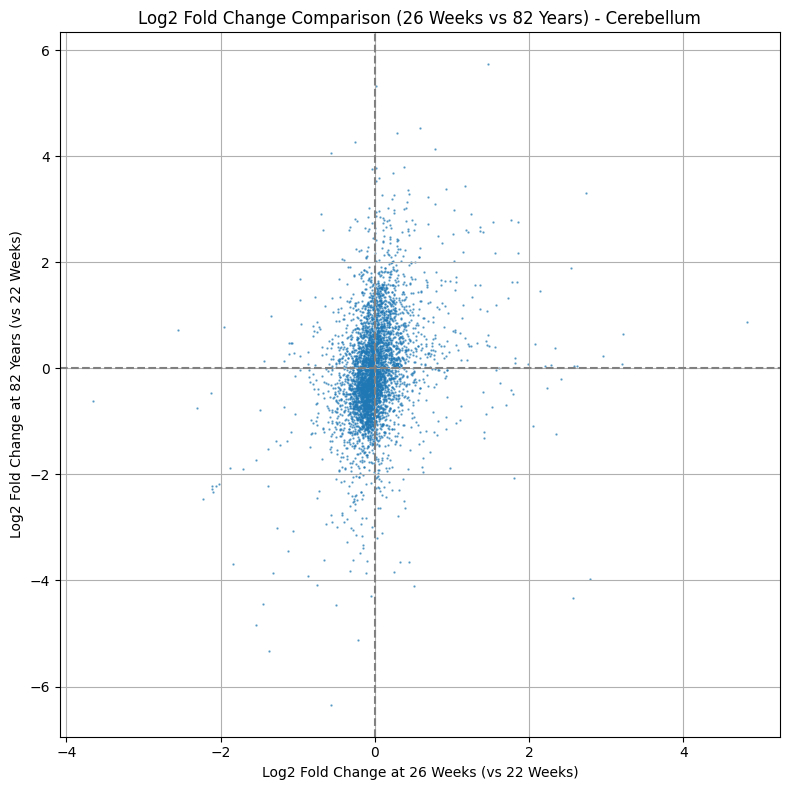

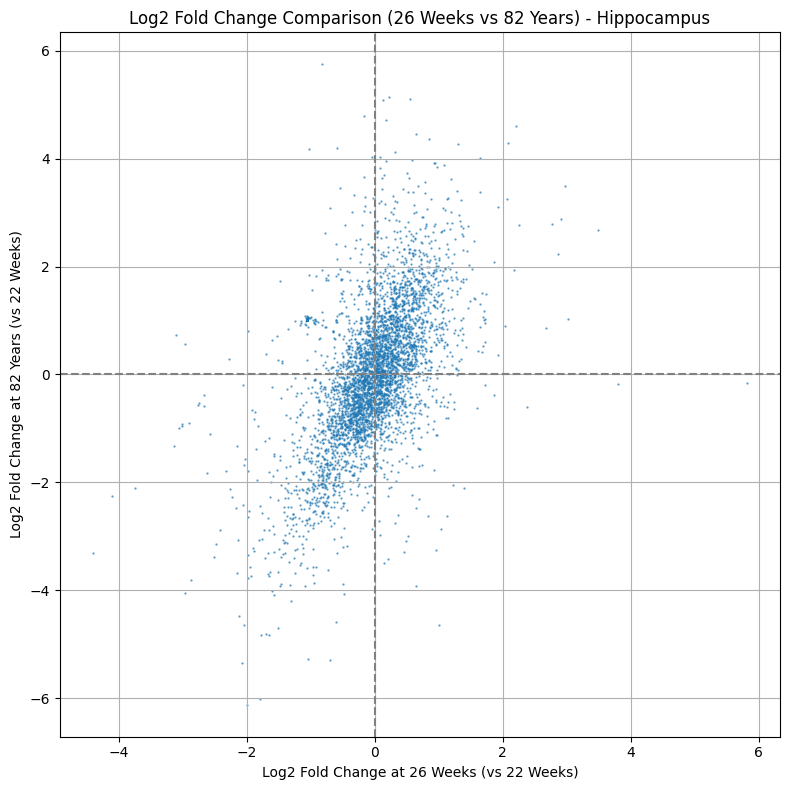

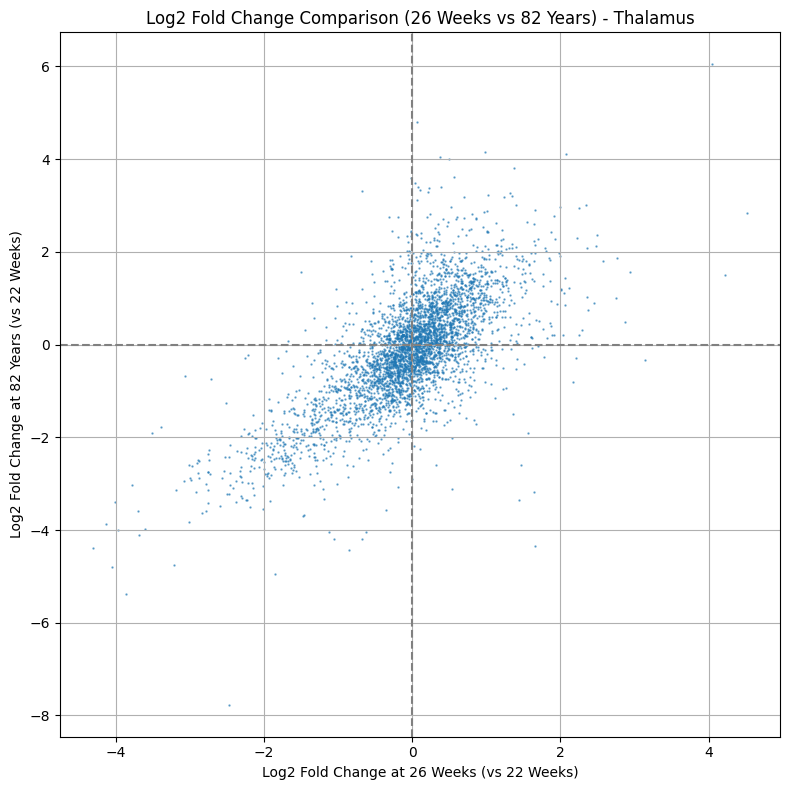

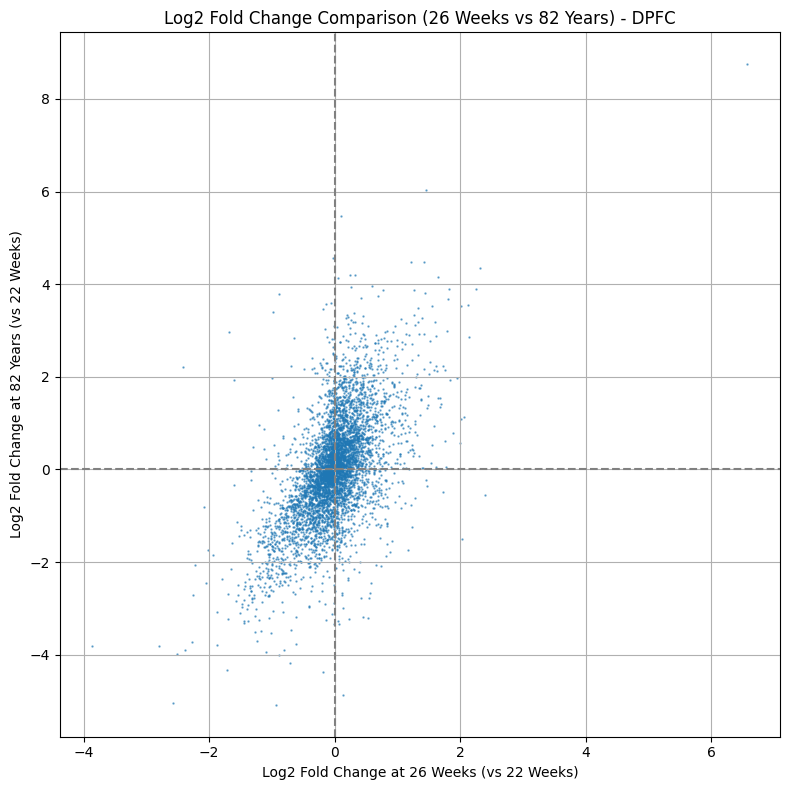

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Assuming these are your 9 developmental stage columns in order
stage_columns = ['22week_Avg', '26week_Avg', '1year_Avg', '2year_Avg', '4year_Avg', '22year_Avg', '35year_Avg', '47year_Avg', '82year_Avg']
brain_regions = {'Cerebellum': cerebellum_df,
                    'Hippocampus': hippocampus_df,
                    'Thalamus': thalamus_df,
                    'DPFC': dpfc_df}

for region_name, df in brain_regions.items():
    if '22week_Avg' in df.columns and '26week_Avg' in df.columns and '82year_Avg' in df.columns:
        # Calculate log2 fold change at 26 weeks vs 22 weeks
        log2_fc_26week_col = '26week_Log2FC_vs_22week'
        df[log2_fc_26week_col] = np.where(
            df['22week_Avg'] != 0,
            np.log2(df['26week_Avg'] / df['22week_Avg']),
            np.nan
        )

        # Calculate log2 fold change at 82 years vs 22 weeks
        log2_fc_82year_col = '82year_Log2FC_vs_22week'
        df[log2_fc_82year_col] = np.where(
            df['22week_Avg'] != 0,
            np.log2(df['82year_Avg'] / df['22week_Avg']),
            np.nan
        )

        # Create the scatter plot
        plt.figure(figsize=(8, 8))
        plt.scatter(df[log2_fc_26week_col], df[log2_fc_82year_col], alpha=0.6, s = 0.5)
        plt.xlabel("Log2 Fold Change at 26 Weeks (vs 22 Weeks)")
        plt.ylabel("Log2 Fold Change at 82 Years (vs 22 Weeks)")
        plt.title(f"Log2 Fold Change Comparison (26 Weeks vs 82 Years) - {region_name}")
        plt.axhline(0, color='gray', linestyle='--')  # Line for no change (log2(1) = 0)
        plt.axvline(0, color='gray', linestyle='--')  # Line for no change (log2(1) = 0)
        plt.grid(True)
        plt.tight_layout()
        plt.show()

    else:
        print(f"\nError: Required developmental stage columns not found in the {region_name} DataFrame.")



Genes with consistently increasing expression in Cerebellum:
|    | Accession   | Gene   | 22week_Avg   | 26week_Avg   | 1year_Avg   | 2year_Avg   | 4year_Avg   | 22year_Avg   | 35year_Avg   | 47year_Avg   | 82year_Avg   | 26week_Log2FC_vs_22week   | 82year_Log2FC_vs_22week   | 26week_Avg_Log2FC_vs_22week_Avg   | 1year_Avg_Log2FC_vs_22week_Avg   | 2year_Avg_Log2FC_vs_22week_Avg   | 4year_Avg_Log2FC_vs_22week_Avg   | 22year_Avg_Log2FC_vs_22week_Avg   | 35year_Avg_Log2FC_vs_22week_Avg   | 47year_Avg_Log2FC_vs_22week_Avg   | 82year_Avg_Log2FC_vs_22week_Avg   |
|:---|:------------|:-------|:-------------|:-------------|:------------|:------------|:------------|:-------------|:-------------|:-------------|:-------------|:--------------------------|:--------------------------|:----------------------------------|:---------------------------------|:---------------------------------|:---------------------------------|:----------------------------------|:----------------------------------|:----

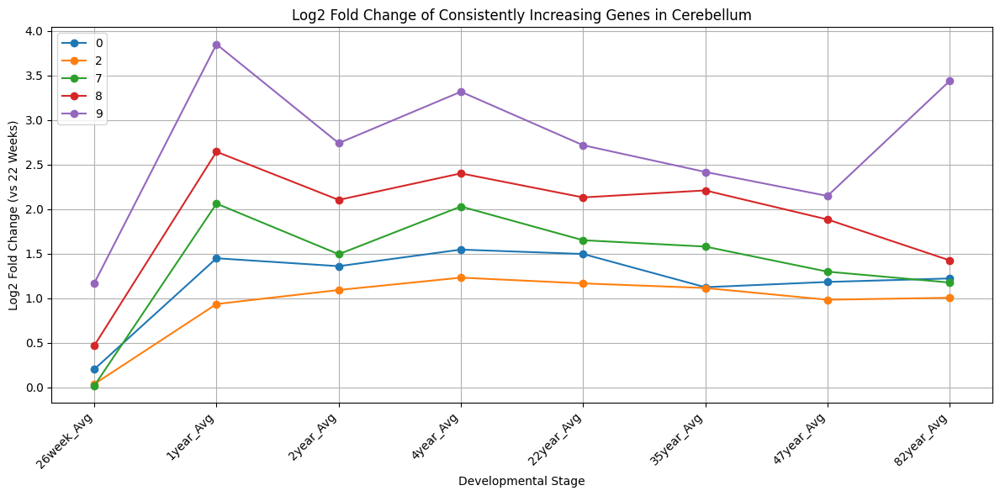


Genes with consistently increasing expression in Hippocampus:
|    | Accession   | Gene    | 22week_Avg   | 26week_Avg   | 1year_Avg   | 2year_Avg   | 4year_Avg   | 22year_Avg   | 35year_Avg   | 47year_Avg   | 82year_Avg   | 26week_Log2FC_vs_22week   | 82year_Log2FC_vs_22week   | 26week_Avg_Log2FC_vs_22week_Avg   | 1year_Avg_Log2FC_vs_22week_Avg   | 2year_Avg_Log2FC_vs_22week_Avg   | 4year_Avg_Log2FC_vs_22week_Avg   | 22year_Avg_Log2FC_vs_22week_Avg   | 35year_Avg_Log2FC_vs_22week_Avg   | 47year_Avg_Log2FC_vs_22week_Avg   | 82year_Avg_Log2FC_vs_22week_Avg   |
|:---|:------------|:--------|:-------------|:-------------|:------------|:------------|:------------|:-------------|:-------------|:-------------|:-------------|:--------------------------|:--------------------------|:----------------------------------|:---------------------------------|:---------------------------------|:---------------------------------|:----------------------------------|:----------------------------------|:-

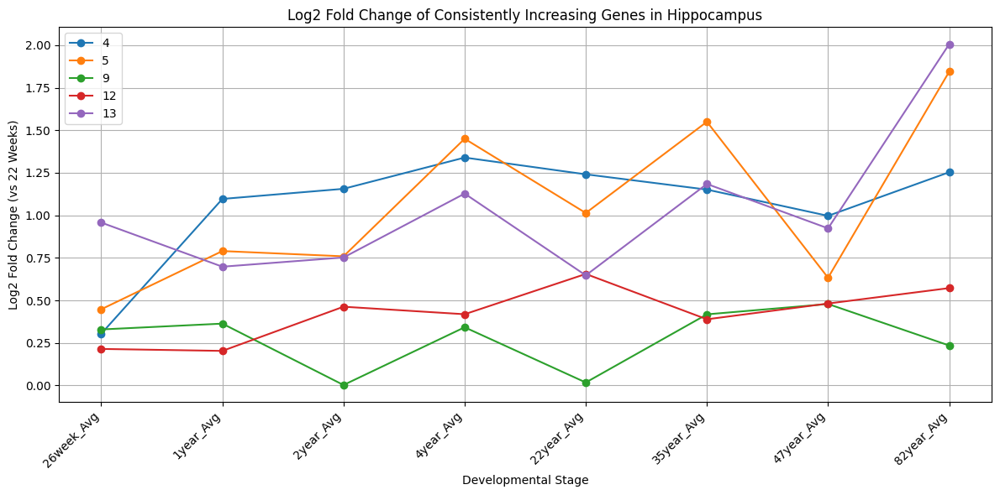


Genes with consistently increasing expression in Thalamus:
|    | Accession   | Gene   | 22week_Avg   | 26week_Avg   | 1year_Avg   | 2year_Avg   | 4year_Avg   | 22year_Avg   | 35year_Avg   | 47year_Avg   | 82year_Avg   | 26week_Log2FC_vs_22week   | 82year_Log2FC_vs_22week   | 26week_Avg_Log2FC_vs_22week_Avg   | 1year_Avg_Log2FC_vs_22week_Avg   | 2year_Avg_Log2FC_vs_22week_Avg   | 4year_Avg_Log2FC_vs_22week_Avg   | 22year_Avg_Log2FC_vs_22week_Avg   | 35year_Avg_Log2FC_vs_22week_Avg   | 47year_Avg_Log2FC_vs_22week_Avg   | 82year_Avg_Log2FC_vs_22week_Avg   |
|:---|:------------|:-------|:-------------|:-------------|:------------|:------------|:------------|:-------------|:-------------|:-------------|:-------------|:--------------------------|:--------------------------|:----------------------------------|:---------------------------------|:---------------------------------|:---------------------------------|:----------------------------------|:----------------------------------|:------

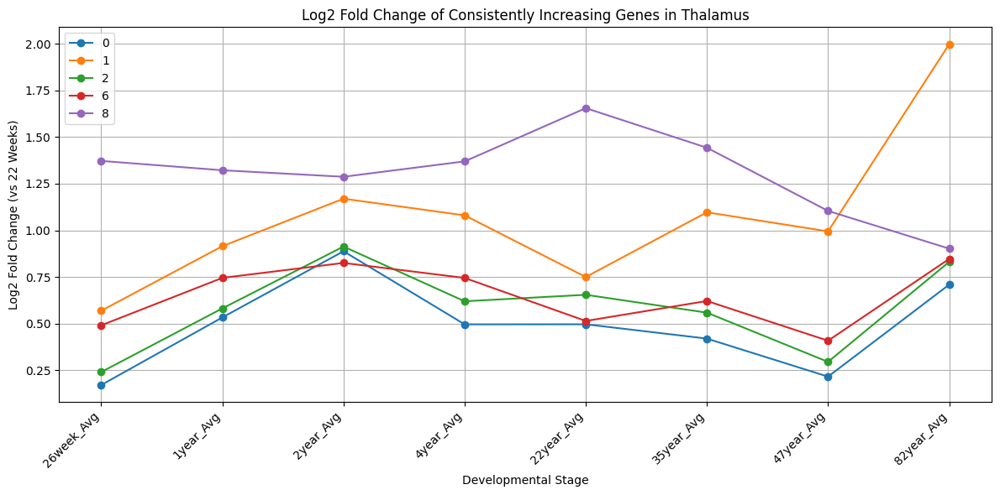


Genes with consistently increasing expression in DPFC:
|    | Accession   | Gene   | 22week_Avg   | 26week_Avg   | 1year_Avg   | 2year_Avg   | 4year_Avg   | 22year_Avg   | 35year_Avg   | 47year_Avg   | 82year_Avg   | 26week_Log2FC_vs_22week   | 82year_Log2FC_vs_22week   | 26week_Avg_Log2FC_vs_22week_Avg   | 1year_Avg_Log2FC_vs_22week_Avg   | 2year_Avg_Log2FC_vs_22week_Avg   | 4year_Avg_Log2FC_vs_22week_Avg   | 22year_Avg_Log2FC_vs_22week_Avg   | 35year_Avg_Log2FC_vs_22week_Avg   | 47year_Avg_Log2FC_vs_22week_Avg   | 82year_Avg_Log2FC_vs_22week_Avg   |
|:---|:------------|:-------|:-------------|:-------------|:------------|:------------|:------------|:-------------|:-------------|:-------------|:-------------|:--------------------------|:--------------------------|:----------------------------------|:---------------------------------|:---------------------------------|:---------------------------------|:----------------------------------|:----------------------------------|:----------

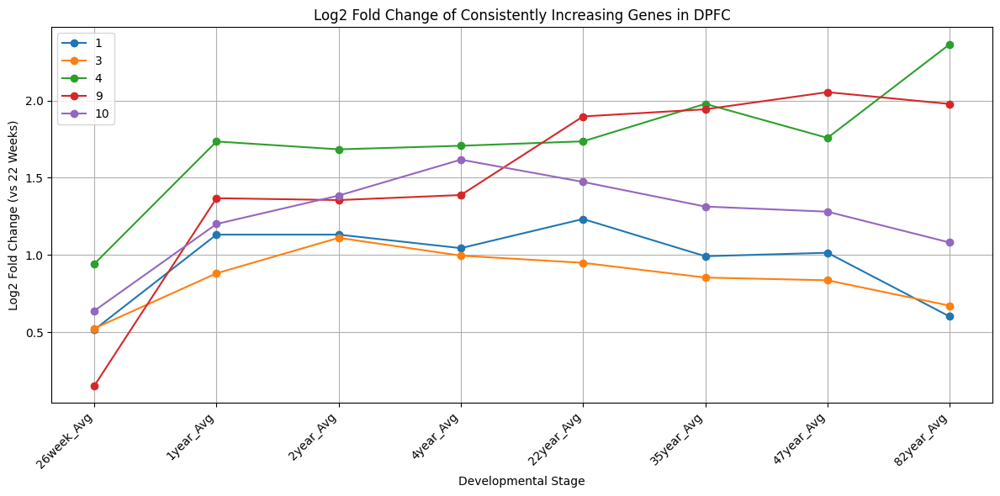

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Assuming these are your 9 developmental stage columns in order
stage_columns = ['22week_Avg', '26week_Avg', '1year_Avg', '2year_Avg', '4year_Avg', '22year_Avg', '35year_Avg', '47year_Avg', '82year_Avg']
brain_regions = {'Cerebellum': cerebellum_df,
                    'Hippocampus': hippocampus_df,
                    'Thalamus': thalamus_df,
                    'DPFC': dpfc_df}

def calculate_log2_fold_changes(df, stage_columns):
    """
    Calculates log2 fold changes for all consecutive stages relative to the first stage.

    Args:
        df (pd.DataFrame): The input DataFrame.
        stage_columns (list): List of columns representing developmental stages in order.

    Returns:
        pd.DataFrame: The DataFrame with added log2 fold change columns.
    """
    for i in range(1, len(stage_columns)):
        stage1 = stage_columns[0]  # Always compare to the first stage
        stage2 = stage_columns[i]
        log2_fc_col_name = f'{stage2}_Log2FC_vs_{stage1}'
        df[log2_fc_col_name] = np.where(
            df[stage1] != 0,
            np.log2(df[stage2] / df[stage1]),
            np.nan
        )
    return df

def find_consistently_increasing_genes(df, stage_columns):
    """
    Identifies genes with consistently increasing log2 fold change across all stages.

    Args:
        df (pd.DataFrame): The input DataFrame with log2 fold change columns.
        stage_columns (list): List of columns representing developmental stages in order.

    Returns:
        pd.DataFrame: DataFrame containing genes with consistently increasing expression.
    """
    # Calculate all log2 fold changes relative to the first stage ('22week_Avg')
    df = calculate_log2_fold_changes(df, stage_columns)

    # Select only the log2 fold change columns
    log2_fc_columns = [f'{stage}_Log2FC_vs_{stage_columns[0]}' for stage in stage_columns[1:]]

    # Check if *all* log2 fold changes are greater than or equal to 0 (no decrease)
    increasing_genes_df = df[ (df[log2_fc_columns] >= 0).all(axis=1) ]
    return increasing_genes_df

for region_name, df in brain_regions.items():
    if all(stage in df.columns for stage in stage_columns):
        increasing_genes_df = find_consistently_increasing_genes(df.copy(), stage_columns) # Pass a copy to avoid modifying original df
        print(f"\nGenes with consistently increasing expression in {region_name}:")
        if (len(increasing_genes_df) > 5):
          print(increasing_genes_df.head().to_markdown(numalign="left", stralign="left"))
        elif (len(increasing_genes_df) > 0):
          print(increasing_genes_df.to_markdown(numalign="left", stralign="left"))
        else:
          print("No genes found with consistently increasing expression.")

        # Visualize the log2 fold change of a few increasing genes
        if not increasing_genes_df.empty:
            num_genes_to_plot = min(5, len(increasing_genes_df))  # Limit to a max of 5 genes
            plt.figure(figsize=(12, 6))
            for i in range(num_genes_to_plot):
                gene_name = increasing_genes_df.index[i]
                log2_fc_values = [increasing_genes_df.loc[gene_name, f'{stage}_Log2FC_vs_{stage_columns[0]}'] for stage in stage_columns[1:]]
                plt.plot(stage_columns[1:], log2_fc_values, marker='o', label=gene_name)
            plt.xlabel("Developmental Stage")
            plt.ylabel("Log2 Fold Change (vs 22 Weeks)")
            plt.title(f"Log2 Fold Change of Consistently Increasing Genes in {region_name}")
            plt.xticks(rotation=45, ha='right')
            plt.legend()
            plt.grid(True)
            plt.tight_layout()
            plt.show()
    else:
        print(f"\nError: Required developmental stage columns not found in the {region_name} DataFrame.")



Protein Abundance Trends in Cerebellum:
| Trend                    | count   |
|:-------------------------|:--------|
| Reverse down             | 1408    |
| Reverse up               | 1329    |
| Monotonically Decreasing | 968     |
| Monotonically Increasing | 714     |


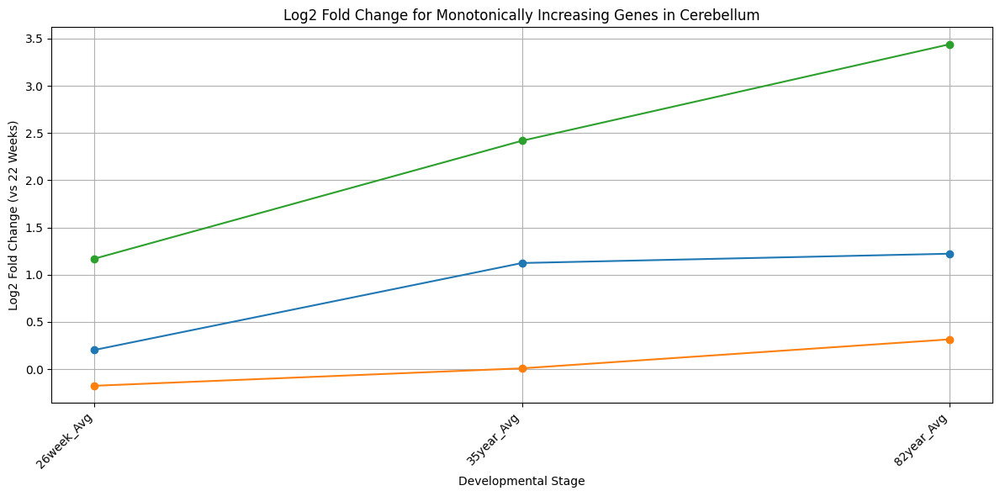

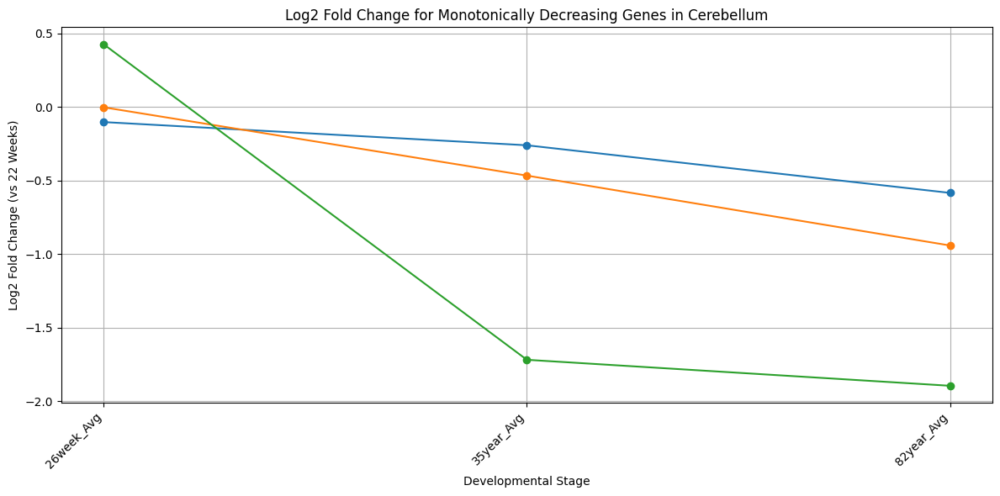

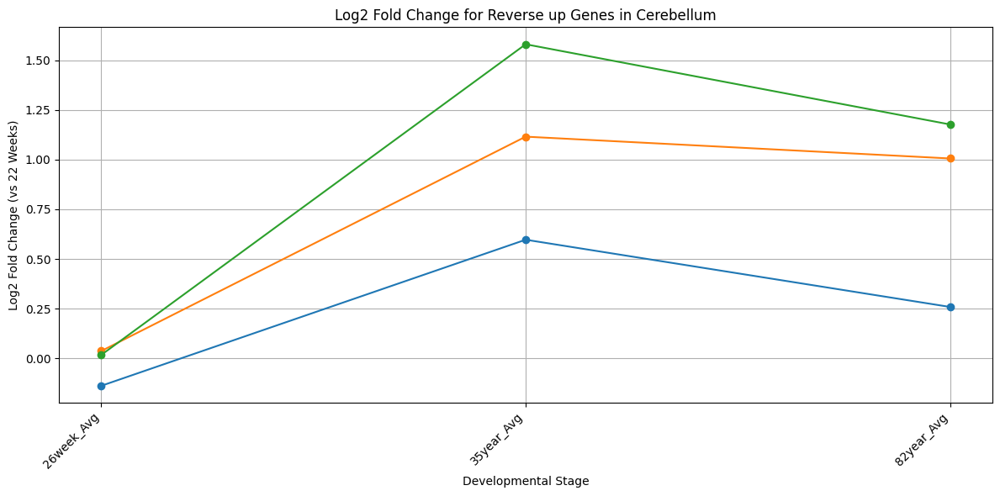

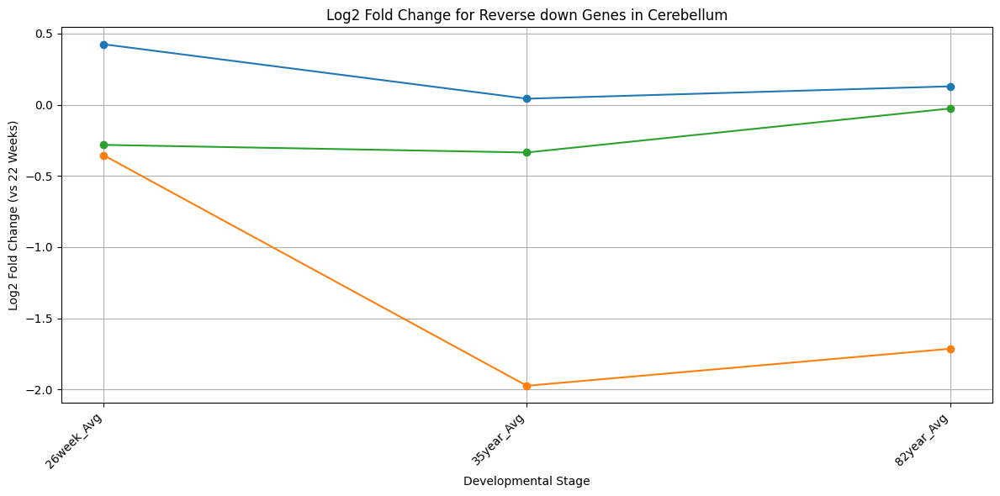

No genes found for trend: Plateau in Cerebellum
No genes found for trend: Other in Cerebellum

Protein Abundance Trends in Hippocampus:
| Trend                    | count   |
|:-------------------------|:--------|
| Reverse down             | 1279    |
| Reverse up               | 1135    |
| Monotonically Decreasing | 1005    |
| Monotonically Increasing | 964     |


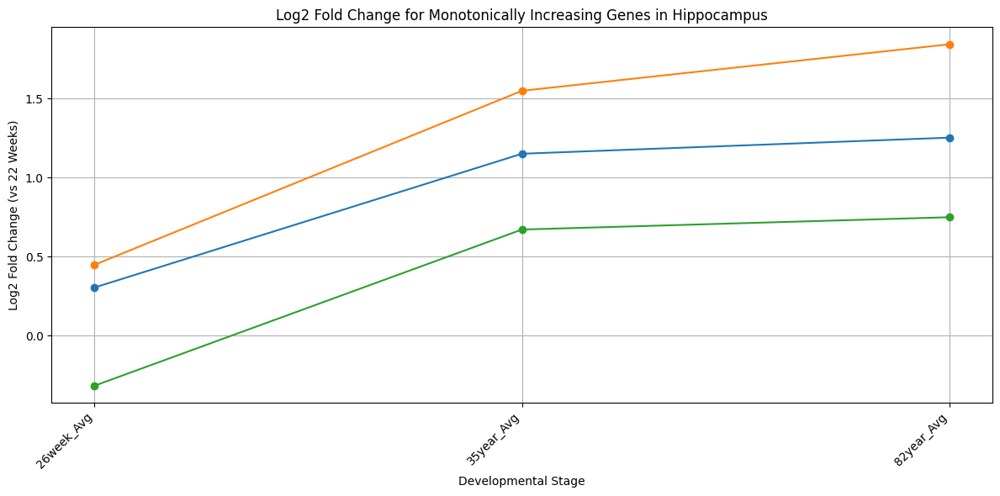

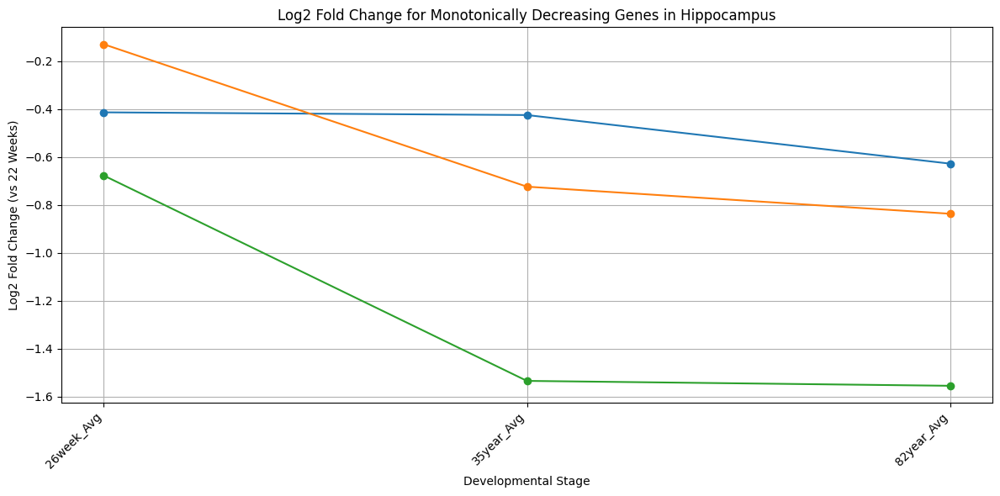

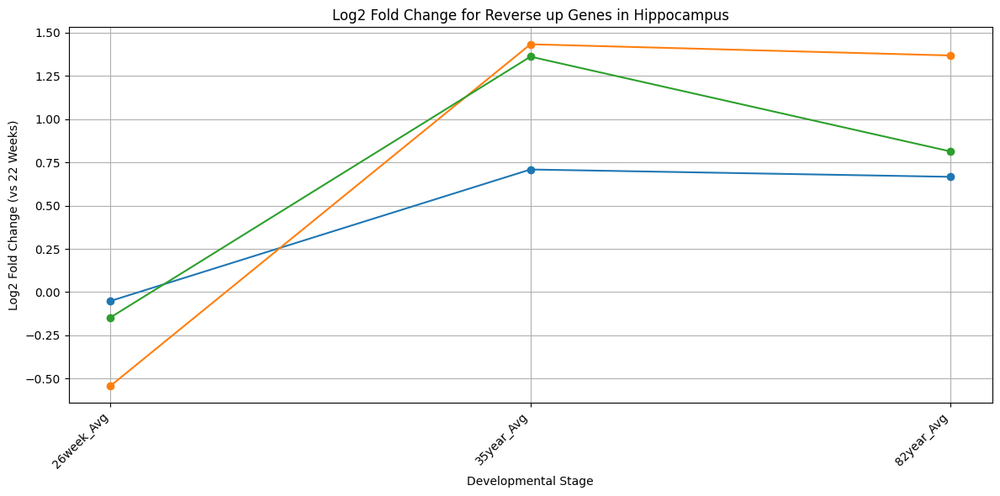

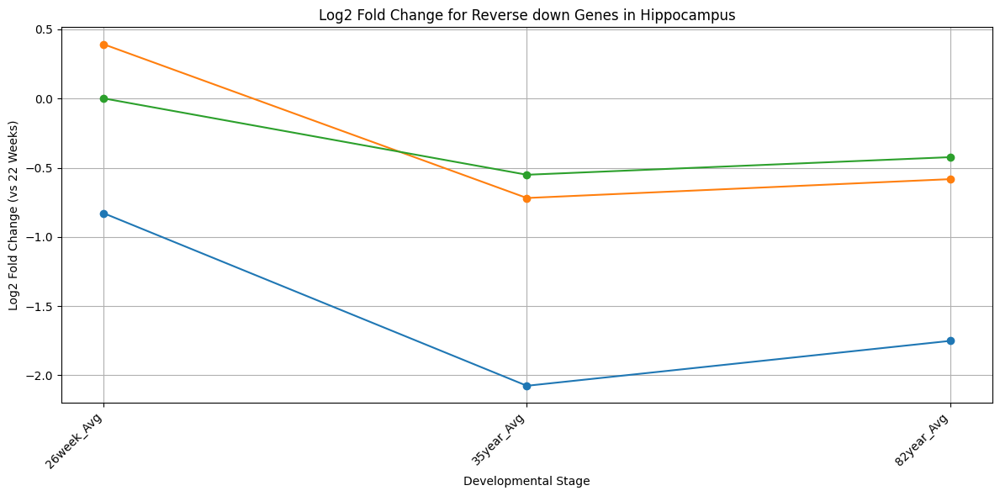

No genes found for trend: Plateau in Hippocampus
No genes found for trend: Other in Hippocampus

Protein Abundance Trends in Thalamus:
| Trend                    | count   |
|:-------------------------|:--------|
| Reverse down             | 1341    |
| Reverse up               | 1272    |
| Monotonically Decreasing | 895     |
| Monotonically Increasing | 556     |


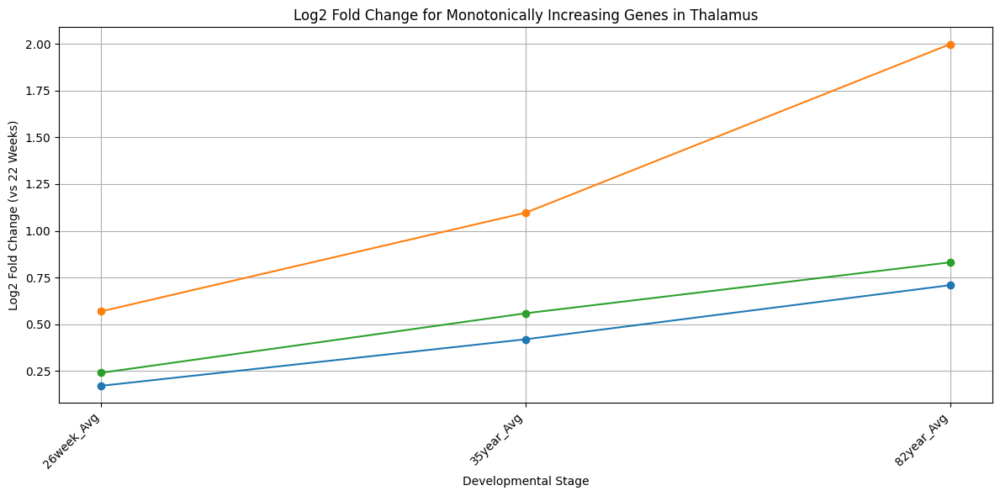

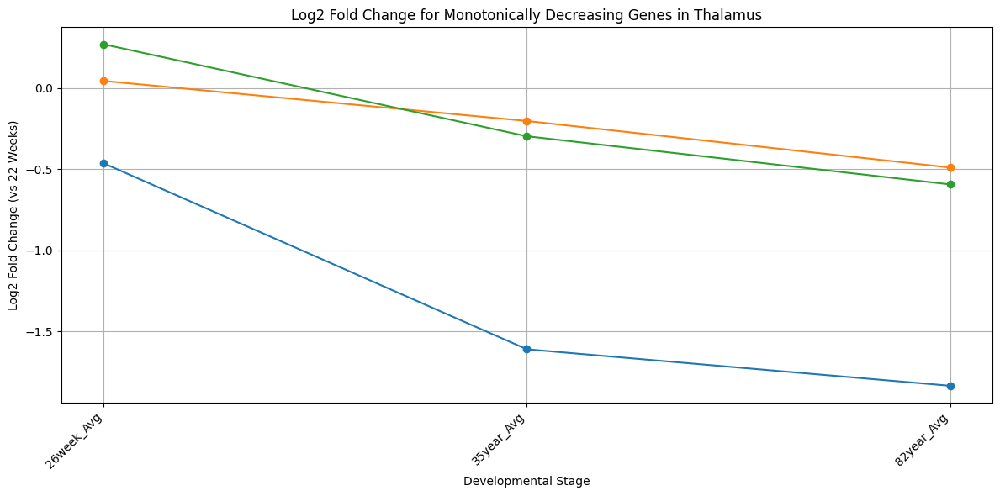

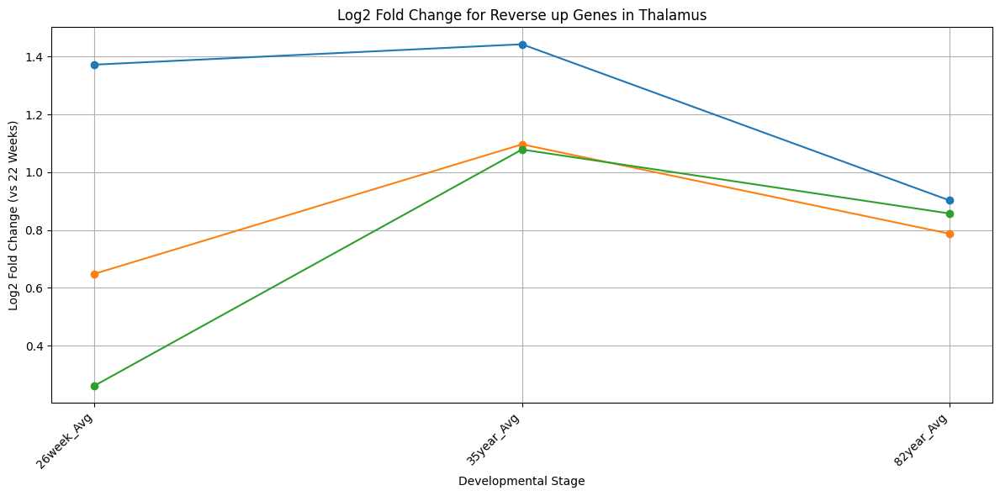

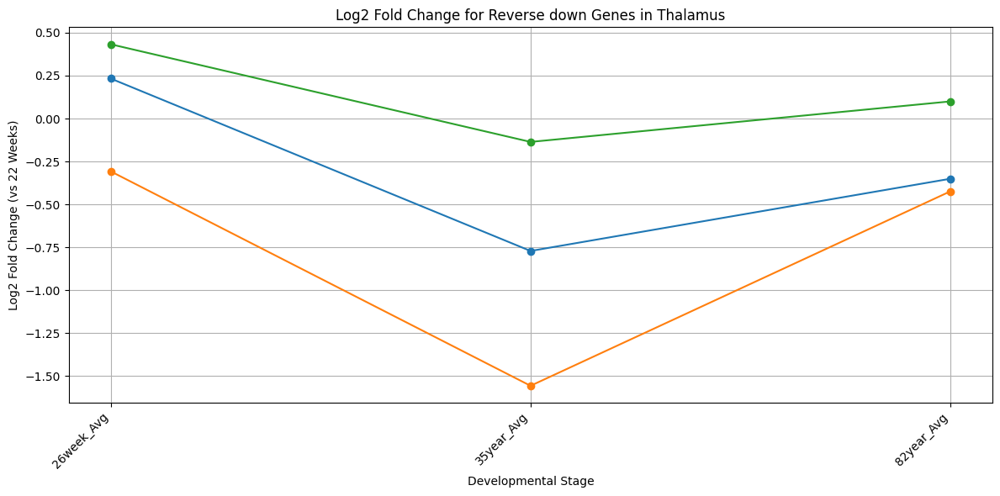

No genes found for trend: Plateau in Thalamus
No genes found for trend: Other in Thalamus

Protein Abundance Trends in DPFC:
| Trend                    | count   |
|:-------------------------|:--------|
| Reverse down             | 1629    |
| Monotonically Increasing | 1442    |
| Monotonically Decreasing | 1321    |
| Reverse up               | 1241    |


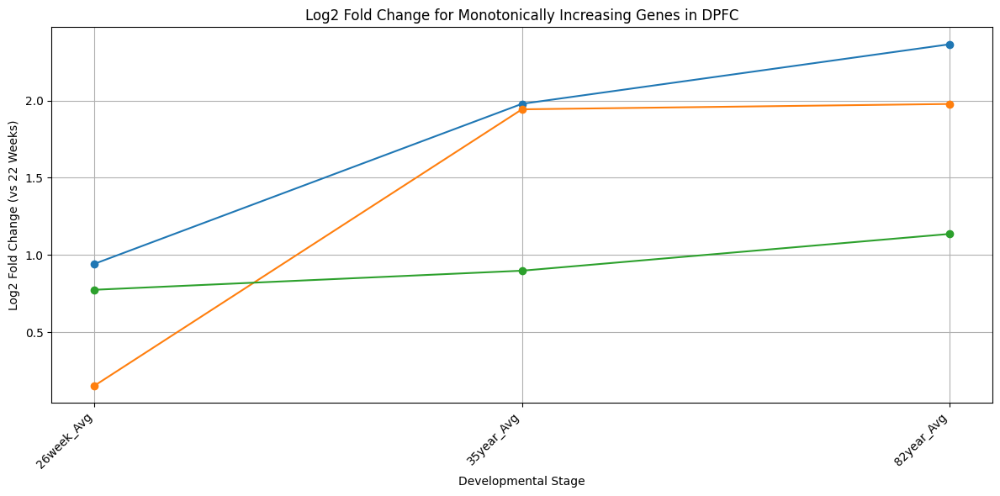

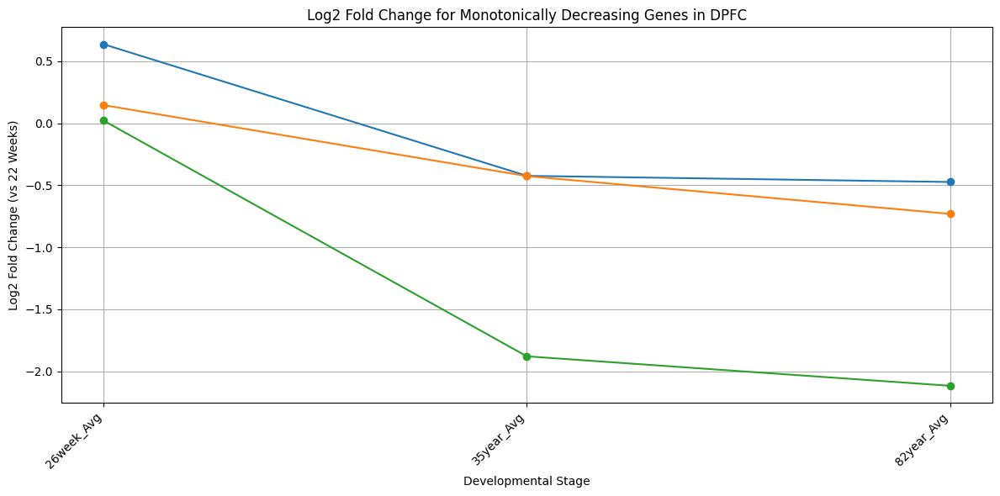

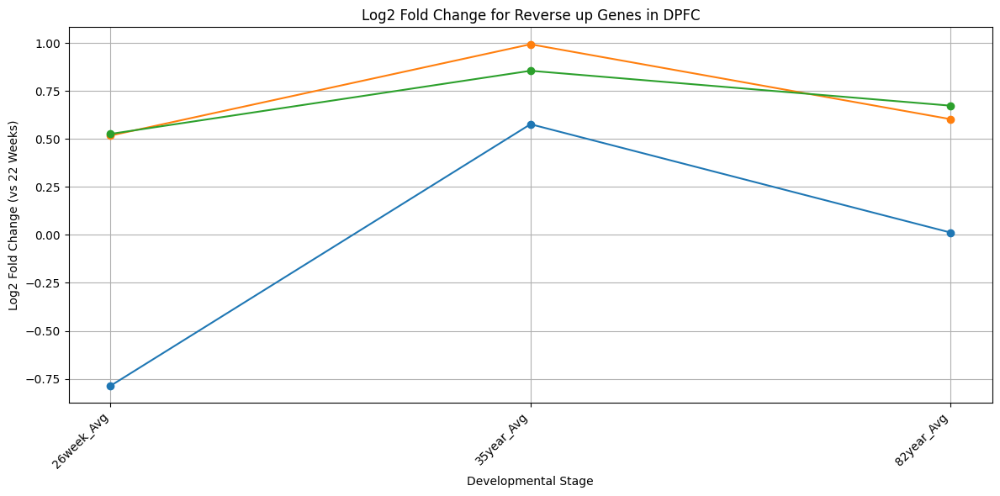

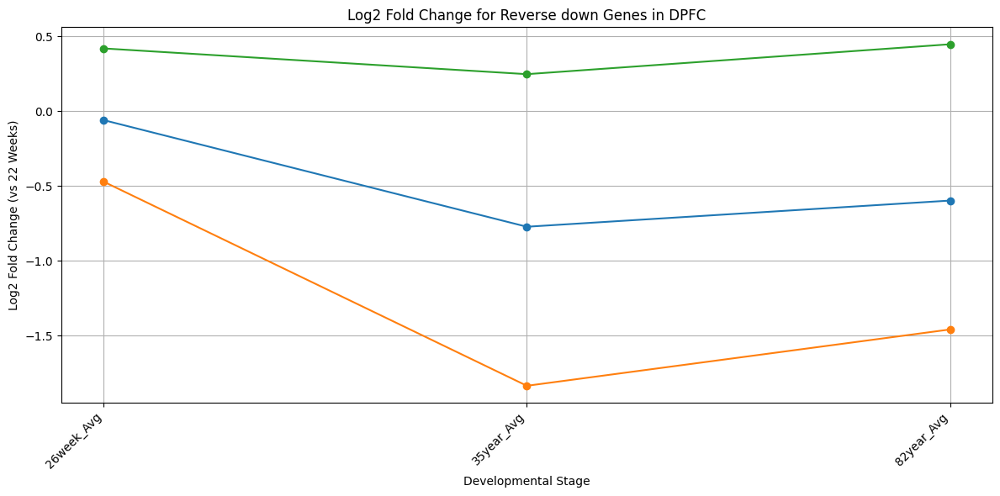

No genes found for trend: Plateau in DPFC
No genes found for trend: Other in DPFC


In [ ]:
import pandas as pd
import numpy as np

# Assuming these are your 9 developmental stage columns in order
stage_columns = ['22week_Avg', '26week_Avg', '1year_Avg', '2year_Avg', '4year_Avg', '22year_Avg', '35year_Avg', '47year_Avg', '82year_Avg']
brain_regions = {'Cerebellum': cerebellum_df,
                    'Hippocampus': hippocampus_df,
                    'Thalamus': thalamus_df,
                    'DPFC': dpfc_df}

def calculate_log2_fold_changes(df, stage_columns):
    """
    Calculates log2 fold changes for specified stages relative to the first stage.

    Args:
        df (pd.DataFrame): The input DataFrame.
        stage_columns (list): List of columns representing developmental stages in order.

    Returns:
        pd.DataFrame: The DataFrame with added log2 fold change columns.
    """
    for stage in stage_columns:
        if stage != stage_columns[0]:
            stage1 = stage_columns[0]  # Always compare to the first stage
            log2_fc_col_name = f'{stage}_Log2FC_vs_{stage1}'
            df[log2_fc_col_name] = np.where(
                df[stage1] != 0,
                np.log2(df[stage] / df[stage1]),
                np.nan
            )
    return df

def analyze_protein_trends(df, stage_columns):
    """
    Analyzes protein abundance trends based on log2 fold changes between 26W, 35Y, and 82Y, relative to 22W, using slope analysis.

    Args:
        df (pd.DataFrame): The input DataFrame with expression data.
        stage_columns (list): List of columns representing developmental stages in order.

    Returns:
        pd.DataFrame: DataFrame with added 'Trend' column indicating the trend category.
    """
    df = calculate_log2_fold_changes(df, stage_columns)

    # Define the relevant log2 fold change columns
    log2_fc_26W = f'{stage_columns[1]}_Log2FC_vs_{stage_columns[0]}' # 26week
    log2_fc_35Y = f'{stage_columns[6]}_Log2FC_vs_{stage_columns[0]}' # 35year
    log2_fc_82Y = f'{stage_columns[8]}_Log2FC_vs_{stage_columns[0]}' # 82year

    # Create a function to handle comparisons
    def get_trend(row):
        fc_26 = row[log2_fc_26W]
        fc_35 = row[log2_fc_35Y]
        fc_82 = row[log2_fc_82Y]

        if pd.isna(fc_26) or pd.isna(fc_35) or pd.isna(fc_82):
            return "Insufficient Data"  # Handle cases with missing data

        # Calculate slopes between the three time points
        slope_26_35 = fc_35 - fc_26
        slope_35_82 = fc_82 - fc_35
        slope_26_82 = fc_82 - fc_26

        # Classify trends based on slopes
        if slope_26_35 > 0 and slope_35_82 > 0 and slope_26_82 > 0:
            return "Monotonically Increasing"
        elif slope_26_35 < 0 and slope_35_82 < 0 and slope_26_82 < 0:
            return "Monotonically Decreasing"
        elif (slope_26_35 > 0 and slope_35_82 < 0):
            return "Reverse up"  # More strict definition of complete reverse
        elif (slope_26_35 < 0 and slope_35_82 > 0):
            return "Reverse down"
        elif slope_26_35 == 0 and slope_35_82 == 0:
            return "Plateau"
        else:
            return "Other"

    df['Trend'] = df.apply(get_trend, axis=1)
    return df

for region_name, df in brain_regions.items():
    if all(stage in df.columns for stage in stage_columns):
        df_analyzed = analyze_protein_trends(df.copy(), stage_columns)
        print(f"\nProtein Abundance Trends in {region_name}:")
        print(df_analyzed['Trend'].value_counts().to_markdown(numalign="left", stralign="left"))

        # Visualize the log2 fold change of a few genes from each category
        trend_categories = ['Monotonically Increasing', 'Monotonically Decreasing', 'Reverse up', 'Reverse down', 'Plateau', 'Other']
        num_genes_to_plot = 3
        stages_to_plot = [stage_columns[1], stage_columns[6], stage_columns[8]]  # 26W, 35Y, 82Y

        for trend in trend_categories:
            genes_of_trend = df_analyzed[df_analyzed['Trend'] == trend]
            if not genes_of_trend.empty:
                plt.figure(figsize=(12, 6))
                plt.title(f"Log2 Fold Change for {trend} Genes in {region_name}")
                for i, gene_name in enumerate(genes_of_trend.index[:num_genes_to_plot]):
                    gene_values = [
                        df_analyzed.loc[gene_name, f'{stage}_Log2FC_vs_{stage_columns[0]}']
                        if f'{stage}_Log2FC_vs_{stage_columns[0]}' in df_analyzed.columns else np.nan
                        for stage in stages_to_plot
                    ]
                    plt.plot(stages_to_plot, gene_values, marker='o', label=gene_name)
                plt.xlabel("Developmental Stage")
                plt.ylabel("Log2 Fold Change (vs 22 Weeks)")
                plt.xticks(rotation=45, ha='right')
                #plt.legend()
                plt.grid(True)
                plt.tight_layout()
                plt.show()
            else:
                print(f"No genes found for trend: {trend} in {region_name}")
    else:
        print(f"\nError: Required developmental stage columns not found in the {region_name} DataFrame.")


In [ ]:
!pip install gseapy

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 590.8/590.8 kB 7.6 MB/s eta 0:00:00



Analyzing Cerebellum

Pathway Enrichment Analysis for Monotonically Increasing:
|    | Gene_set        | Term                                                      | Overlap   | P-value     | Adjusted P-value   | Old P-value   | Old Adjusted P-value   | Odds Ratio   | Combined Score   | Genes                                                                                                                                                                                                                                                                                                                                                                                        |
|:---|:----------------|:----------------------------------------------------------|:----------|:------------|:-------------------|:--------------|:-----------------------|:-------------|:-----------------|:--------------------------------------------------------------------------------------------------------------------------

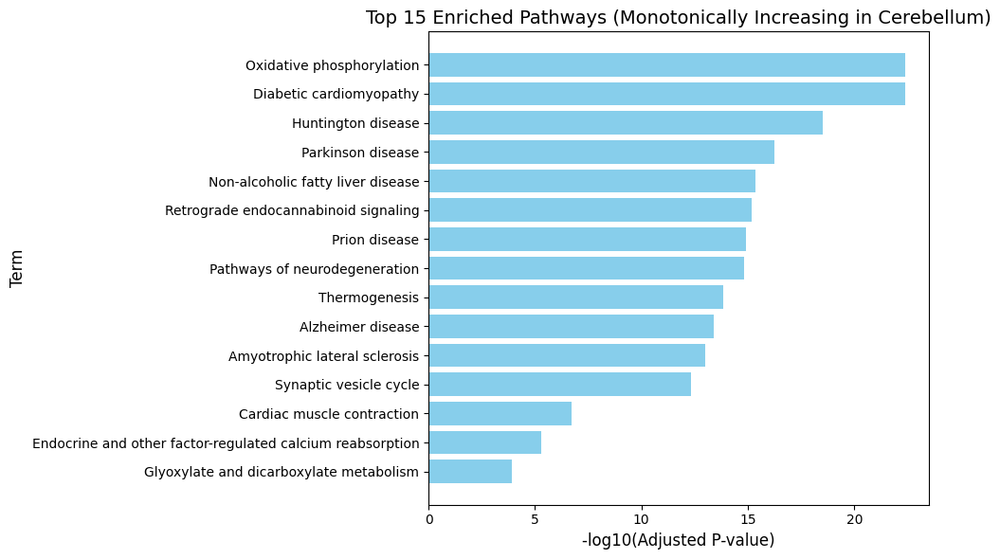


Pathway Enrichment Analysis for Monotonically Decreasing:
|    | Gene_set        | Term                                        | Overlap   | P-value     | Adjusted P-value   | Old P-value   | Old Adjusted P-value   | Odds Ratio   | Combined Score   | Genes                                                                                                                                                                                                                                                                                                                    |
|:---|:----------------|:--------------------------------------------|:----------|:------------|:-------------------|:--------------|:-----------------------|:-------------|:-----------------|:------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

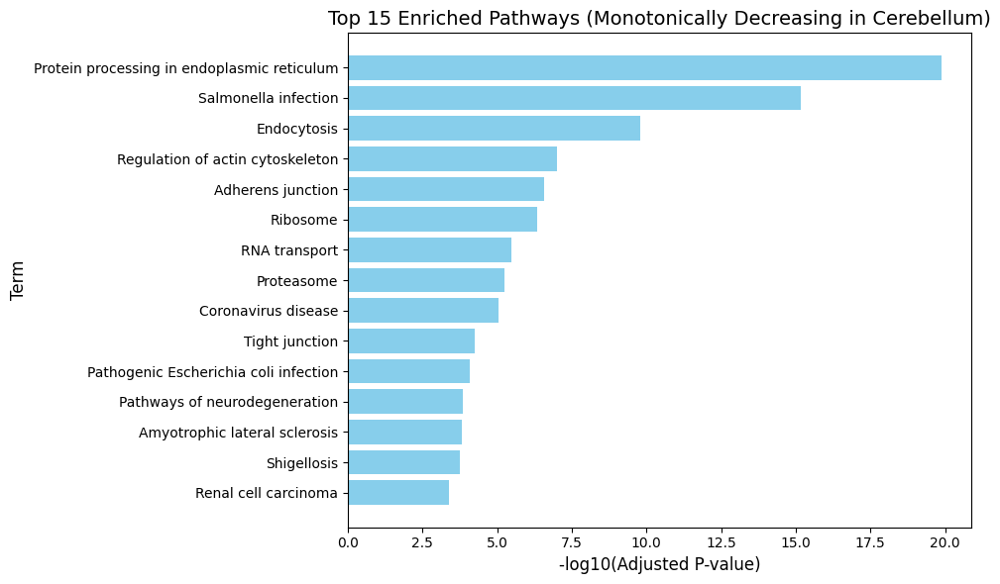


Pathway Enrichment Analysis for Reverse up:
|    | Gene_set        | Term                                       | Overlap   | P-value     | Adjusted P-value   | Old P-value   | Old Adjusted P-value   | Odds Ratio   | Combined Score   | Genes                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                         |
|:---|:----------------|:-------------------------------------------|:----------|:------------|:-------------------|:--------------|:-----------------------|:-------------|:--------------

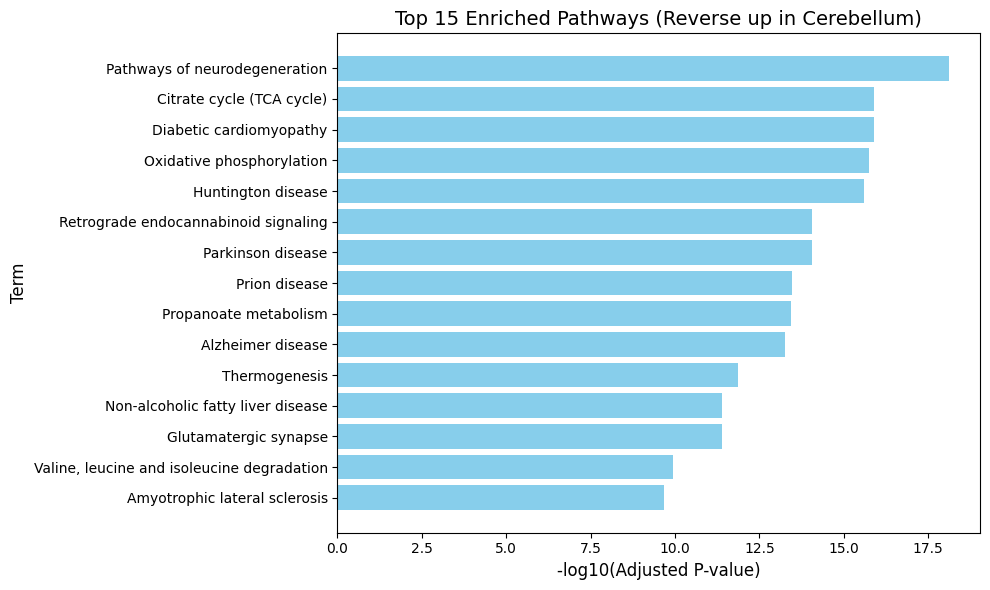


Pathway Enrichment Analysis for Reverse down:
|    | Gene_set        | Term                                   | Overlap   | P-value     | Adjusted P-value   | Old P-value   | Old Adjusted P-value   | Odds Ratio   | Combined Score   | Genes                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               |
|:---|:----------------|:---------------------------------------|:----------|:------------|:-------------------|:--------------|:-----------------------|:-------------|:-----------------|:---------------------------

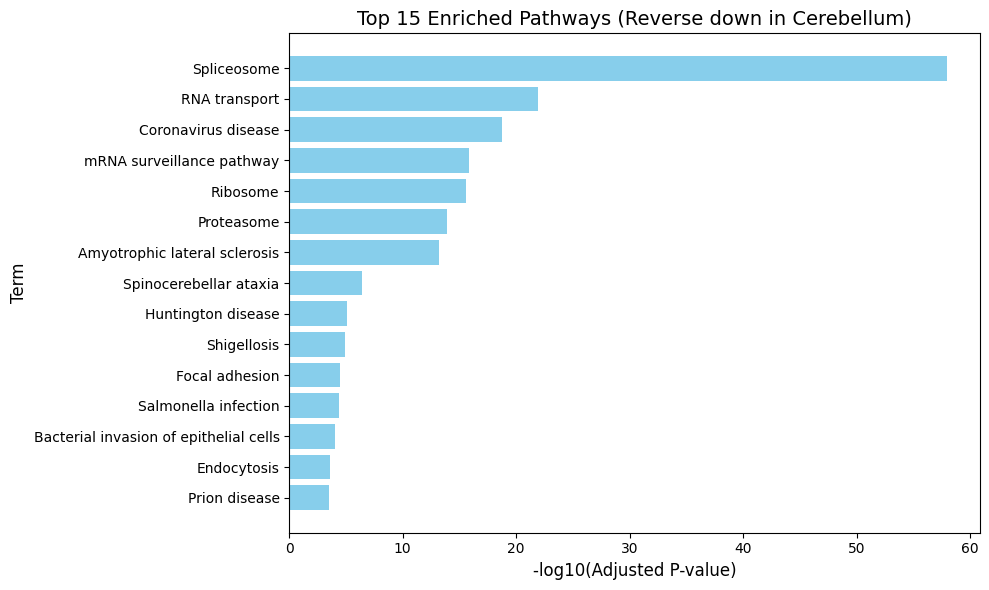


Analyzing Hippocampus

Pathway Enrichment Analysis for Monotonically Increasing:
|    | Gene_set        | Term                                                       | Overlap   | P-value     | Adjusted P-value   | Old P-value   | Old Adjusted P-value   | Odds Ratio   | Combined Score   | Genes                                                                                                                                                                                                                                                                               |
|:---|:----------------|:-----------------------------------------------------------|:----------|:------------|:-------------------|:--------------|:-----------------------|:-------------|:-----------------|:--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

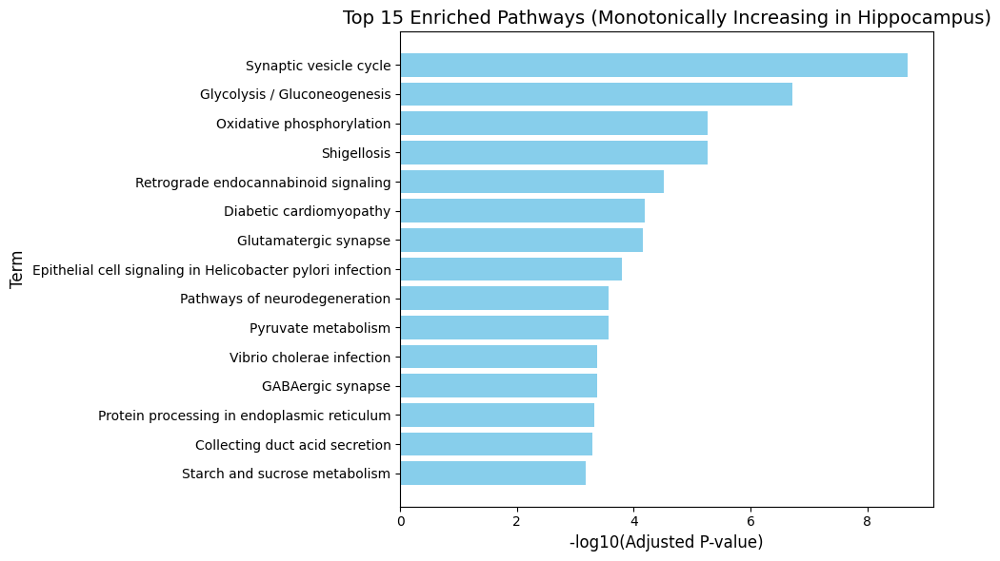


Pathway Enrichment Analysis for Monotonically Decreasing:
|    | Gene_set        | Term                                        | Overlap   | P-value     | Adjusted P-value   | Old P-value   | Old Adjusted P-value   | Odds Ratio   | Combined Score   | Genes                                                                                                                                                                                                                                                                                                                         |
|:---|:----------------|:--------------------------------------------|:----------|:------------|:-------------------|:--------------|:-----------------------|:-------------|:-----------------|:-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

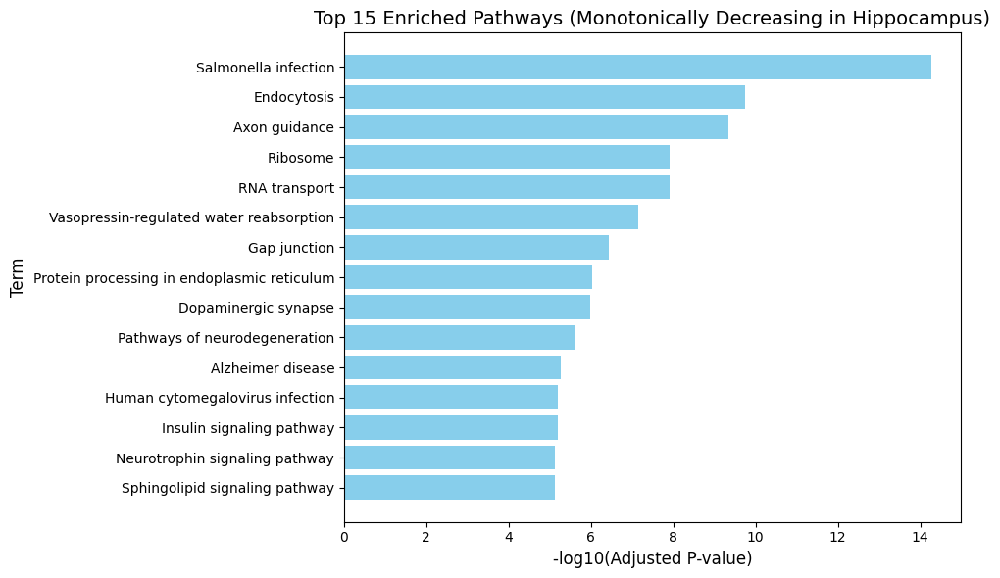


Pathway Enrichment Analysis for Reverse up:
|    | Gene_set        | Term                                                      | Overlap   | P-value     | Adjusted P-value   | Old P-value   | Old Adjusted P-value   | Odds Ratio   | Combined Score   | Genes                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                     |
|:---|:----------------|:---------------------------------------

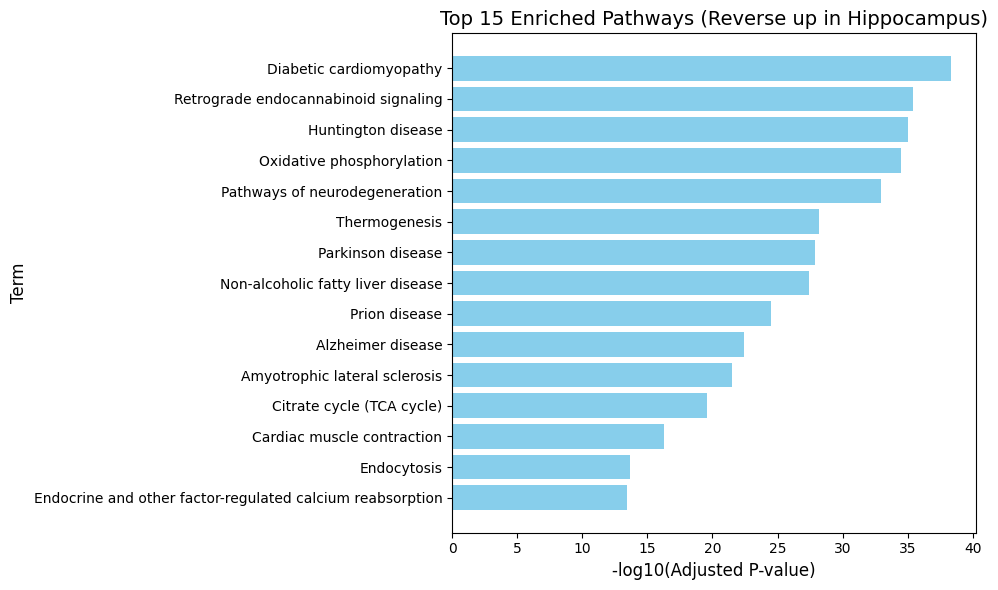


Pathway Enrichment Analysis for Reverse down:
|    | Gene_set        | Term                                        | Overlap   | P-value     | Adjusted P-value   | Old P-value   | Old Adjusted P-value   | Odds Ratio   | Combined Score   | Genes                                                                                                                                                                                                                                                                                                                                                                                                                                       |
|:---|:----------------|:--------------------------------------------|:----------|:------------|:-------------------|:--------------|:-----------------------|:-------------|:-----------------|:-----------------------------------------------------------------------------------------------------------------------------------------

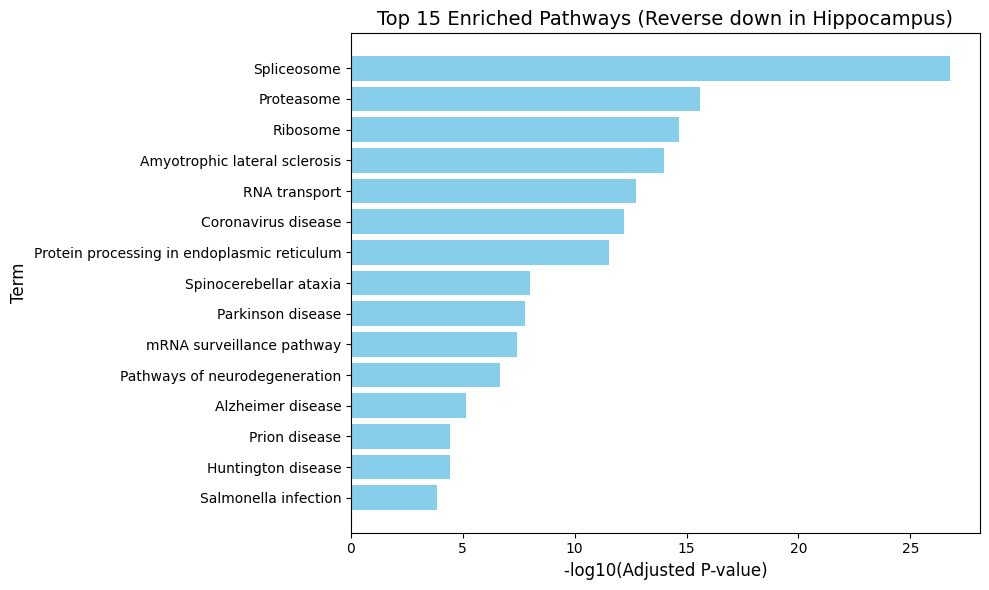


Analyzing Thalamus

Pathway Enrichment Analysis for Monotonically Increasing:
|    | Gene_set        | Term                                                       | Overlap   | P-value     | Adjusted P-value   | Old P-value   | Old Adjusted P-value   | Odds Ratio   | Combined Score   | Genes                                                                                                                                                    |
|:---|:----------------|:-----------------------------------------------------------|:----------|:------------|:-------------------|:--------------|:-----------------------|:-------------|:-----------------|:---------------------------------------------------------------------------------------------------------------------------------------------------------|
| 0  | KEGG_2021_Human | Synaptic vesicle cycle                                     | 21/78     | 1.522e-15   | 4.30727e-13        | 0             | 0                      | 13.48        | 459.92

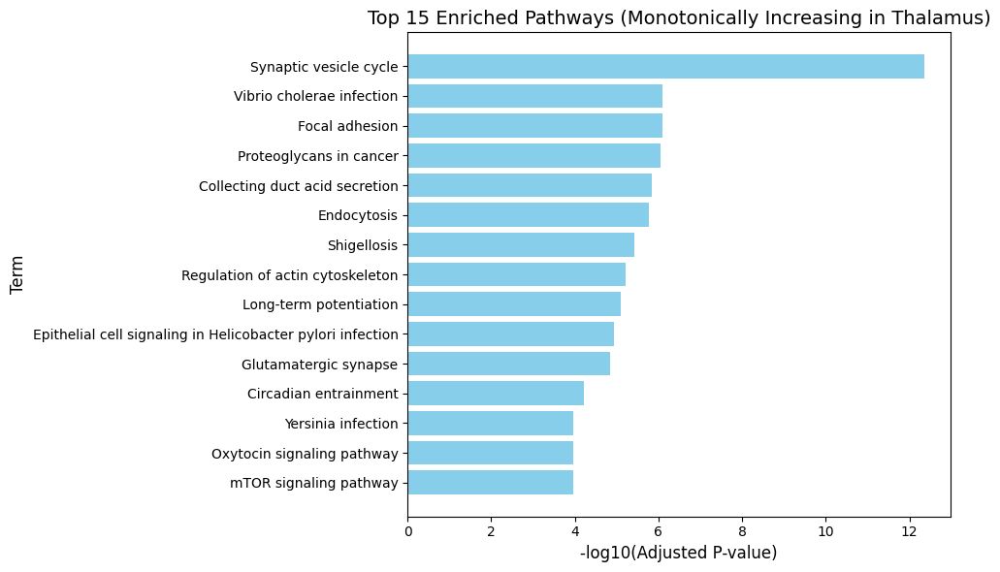


Pathway Enrichment Analysis for Monotonically Decreasing:
|    | Gene_set        | Term                                        | Overlap   | P-value     | Adjusted P-value   | Old P-value   | Old Adjusted P-value   | Odds Ratio   | Combined Score   | Genes                                                                                                                                                                                                                                                                                       |
|:---|:----------------|:--------------------------------------------|:----------|:------------|:-------------------|:--------------|:-----------------------|:-------------|:-----------------|:-----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

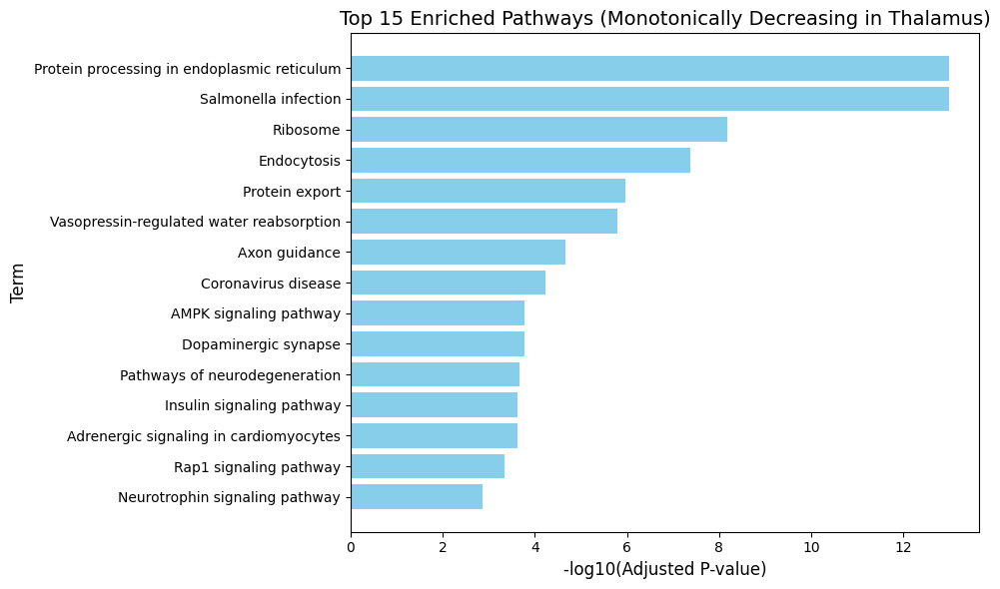


Pathway Enrichment Analysis for Reverse up:
|    | Gene_set        | Term                                        | Overlap   | P-value     | Adjusted P-value   | Old P-value   | Old Adjusted P-value   | Odds Ratio   | Combined Score   | Genes                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    |
|:---|:----------------|:--------------------------------------------|:--------

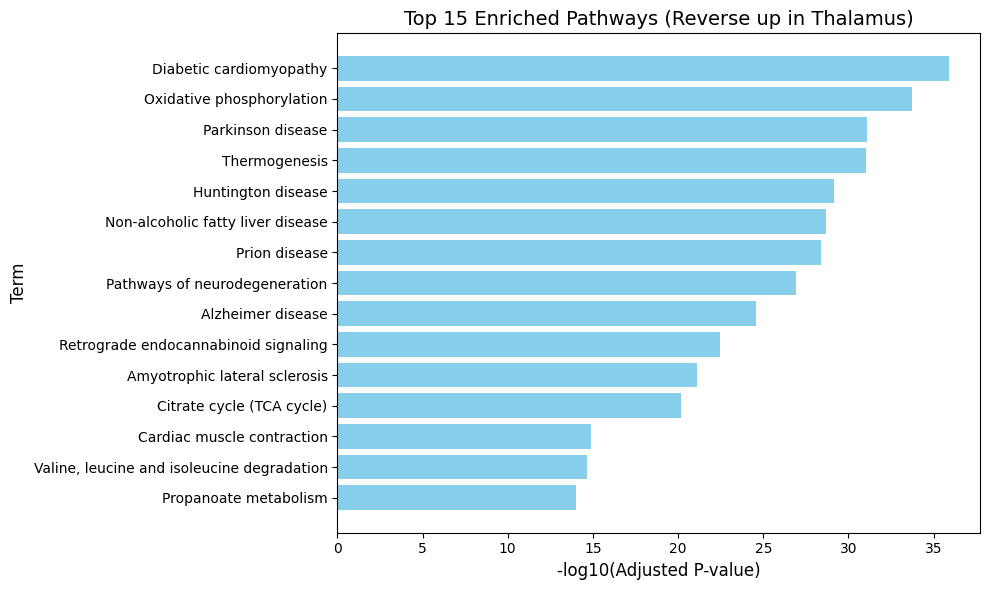


Pathway Enrichment Analysis for Reverse down:
|    | Gene_set        | Term                                        | Overlap   | P-value     | Adjusted P-value   | Old P-value   | Old Adjusted P-value   | Odds Ratio   | Combined Score   | Genes                                                                                                                                                                                                                                                                                                                                                                                                           |
|:---|:----------------|:--------------------------------------------|:----------|:------------|:-------------------|:--------------|:-----------------------|:-------------|:-----------------|:---------------------------------------------------------------------------------------------------------------------------------------------------------------------

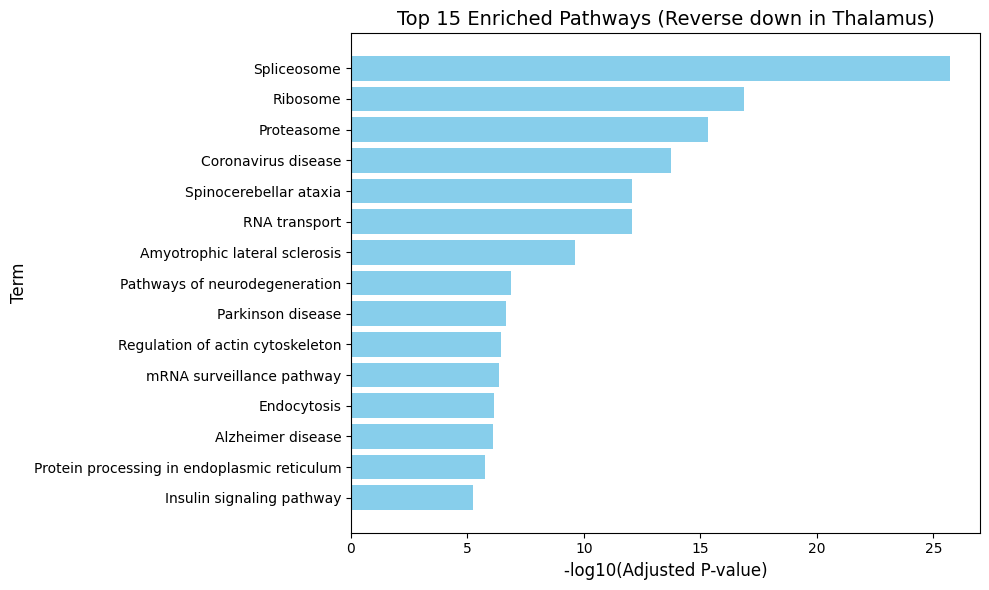


Analyzing DPFC

Pathway Enrichment Analysis for Monotonically Increasing:
|    | Gene_set        | Term                                       | Overlap   | P-value     | Adjusted P-value   | Old P-value   | Old Adjusted P-value   | Odds Ratio   | Combined Score   | Genes                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    |
|:---|:----------------|:-------------------------------------------|:----------|:------------|:-------------------|:--------------|:-----------------------|:-------------|:-----------------|:----------------------------------

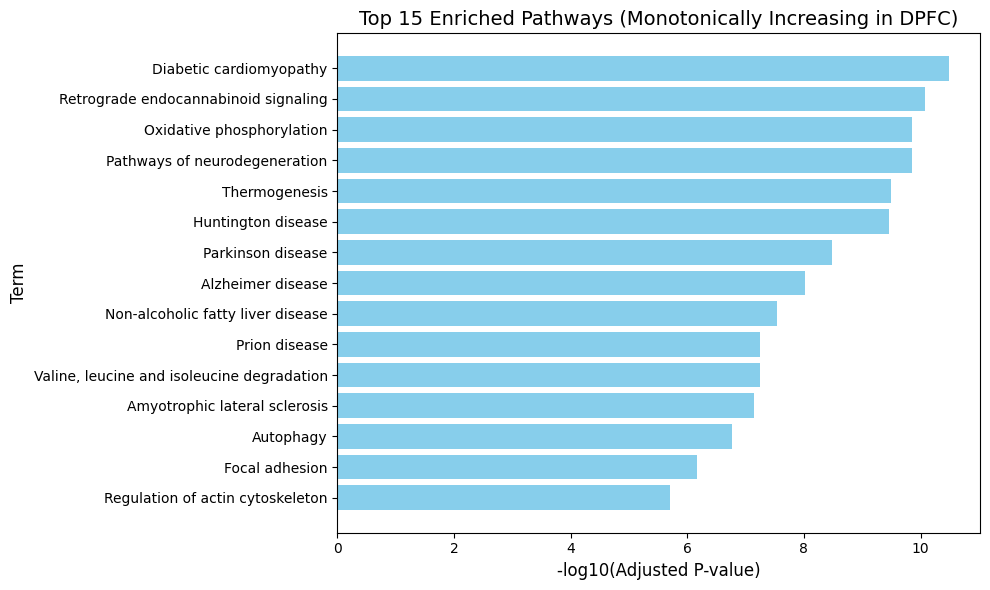


Pathway Enrichment Analysis for Monotonically Decreasing:
|    | Gene_set        | Term                                        | Overlap   | P-value     | Adjusted P-value   | Old P-value   | Old Adjusted P-value   | Odds Ratio   | Combined Score   | Genes                                                                                                                                                                                                                                                                                                                                                                                 |
|:---|:----------------|:--------------------------------------------|:----------|:------------|:-------------------|:--------------|:-----------------------|:-------------|:-----------------|:-----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

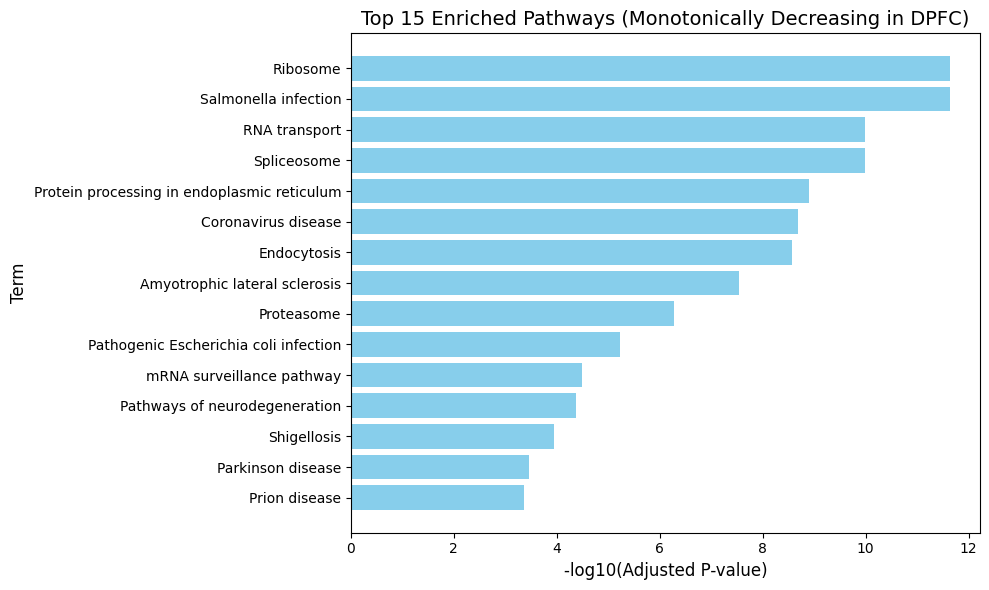


Pathway Enrichment Analysis for Reverse up:
|    | Gene_set        | Term                                                      | Overlap   | P-value     | Adjusted P-value   | Old P-value   | Old Adjusted P-value   | Odds Ratio   | Combined Score   | Genes                                                                                                                                                                                                                                                                                                                                                                                                                                                                                           |
|:---|:----------------|:----------------------------------------------------------|:----------|:------------|:-------------------|:--------------|:-----------------------|:-------------|:-----------------|:-----------------------------------------------------------

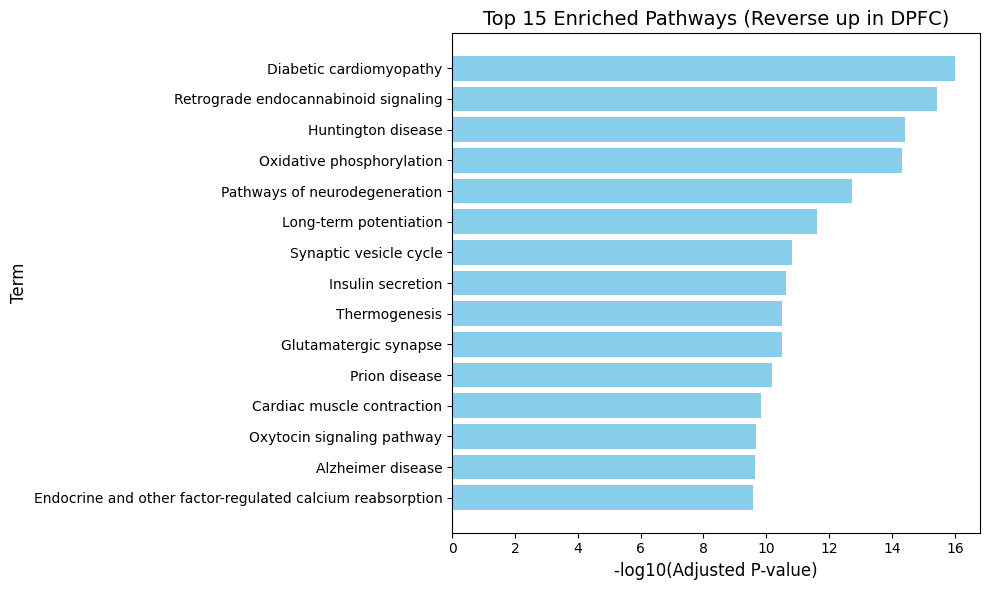


Pathway Enrichment Analysis for Reverse down:
|    | Gene_set        | Term                              | Overlap   | P-value     | Adjusted P-value   | Old P-value   | Old Adjusted P-value   | Odds Ratio   | Combined Score   | Genes                                                                                                                                                                                                                                                                                                                                                                                                                               |
|:---|:----------------|:----------------------------------|:----------|:------------|:-------------------|:--------------|:-----------------------|:-------------|:-----------------|:---------------------------------------------------------------------------------------------------------------------------------------------------------------------

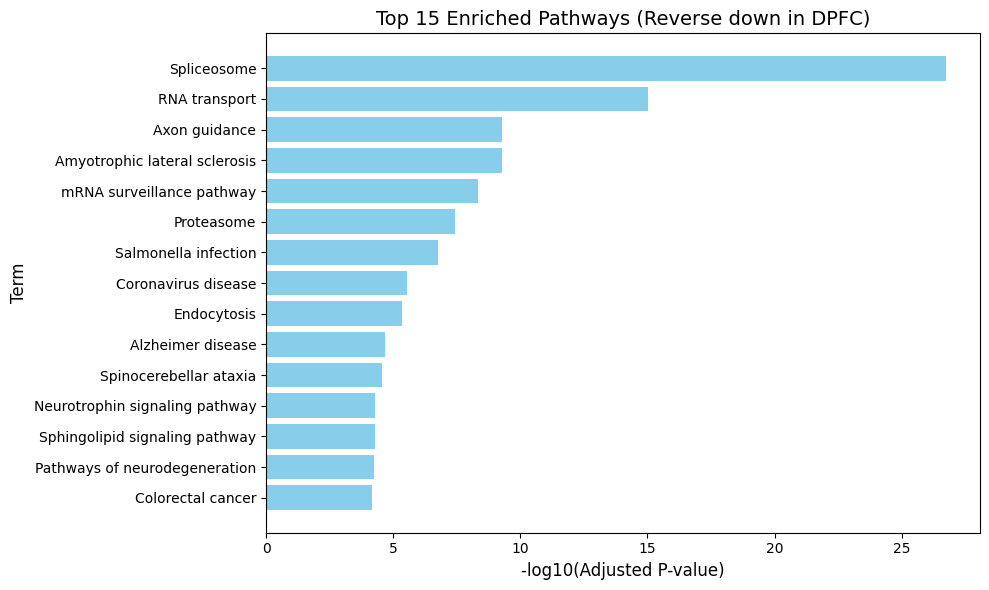

In [ ]:
import pandas as pd
import numpy as np
import gseapy as gp
import matplotlib.pyplot as plt

# Assuming these are your 9 developmental stage columns in order
stage_columns = ['22week_Avg', '26week_Avg', '1year_Avg', '2year_Avg', '4year_Avg', '22year_Avg', '35year_Avg', '47year_Avg', '82year_Avg']
brain_regions = {'Cerebellum': cerebellum_df,
                    'Hippocampus': hippocampus_df,
                    'Thalamus': thalamus_df,
                    'DPFC': dpfc_df}

# Define the gene sets database. You can change this to 'GO_BP', 'KEGG', etc.
gene_sets_library = 'KEGG_2021_Human'

def calculate_log2_fold_changes(df, stage_columns):
    """
    Calculates log2 fold changes for specified stages relative to the first stage.

    Args:
        df (pd.DataFrame): The input DataFrame.
        stage_columns (list): List of columns representing developmental stages in order.

    Returns:
        pd.DataFrame: The DataFrame with added log2 fold change columns.
    """
    for stage in stage_columns:
        if stage != stage_columns[0]:
            stage1 = stage_columns[0]  # Always compare to the first stage
            log2_fc_col_name = f'{stage}_Log2FC_vs_{stage1}'
            df[log2_fc_col_name] = np.where(
                df[stage1] != 0,
                np.log2(df[stage] / df[stage1]),
                np.nan
            )
    return df

def analyze_protein_trends(df, stage_columns):
    """
    Analyzes protein abundance trends based on log2 fold changes between 26W, 35Y, and 82Y, relative to 22W, using slope analysis.

    Args:
        df (pd.DataFrame): The input DataFrame with expression data.
        stage_columns (list): List of columns representing developmental stages in order.

    Returns:
        pd.DataFrame: DataFrame with added 'Trend' column indicating the trend category.
    """
    df = calculate_log2_fold_changes(df, stage_columns)

    # Define the relevant log2 fold change columns
    log2_fc_26W = f'{stage_columns[1]}_Log2FC_vs_{stage_columns[0]}' # 26week
    log2_fc_35Y = f'{stage_columns[6]}_Log2FC_vs_{stage_columns[0]}' # 35year
    log2_fc_82Y = f'{stage_columns[8]}_Log2FC_vs_{stage_columns[0]}' # 82year

    # Create a function to handle comparisons
    def get_trend(row):
        fc_26 = row[log2_fc_26W]
        fc_35 = row[log2_fc_35Y]
        fc_82 = row[log2_fc_82Y]

        if pd.isna(fc_26) or pd.isna(fc_35) or pd.isna(fc_82):
            return "Insufficient Data"  # Handle cases with missing data

        # Calculate slopes between the three time points
        slope_26_35 = fc_35 - fc_26
        slope_35_82 = fc_82 - fc_35
        slope_26_82 = fc_82 - fc_26

        # Classify trends based on slopes
        if slope_26_35 > 0 and slope_35_82 > 0 and slope_26_82 > 0:
            return "Monotonically Increasing"
        elif slope_26_35 < 0 and slope_35_82 < 0 and slope_26_82 < 0:
            return "Monotonically Decreasing"
        elif (slope_26_35 > 0 and slope_35_82 < 0):
            return "Reverse up"
        elif (slope_26_35 < 0 and slope_35_82 > 0):
            return "Reverse down"
        elif slope_26_35 == 0 and slope_35_82 == 0:
            return "Plateau"
        else:
            return "Other"

    df['Trend'] = df.apply(get_trend, axis=1)
    return df

def run_gsea(gene_list, description):
    """
    Runs Gene Set Enrichment Analysis (GSEA) on a list of genes.

    Args:
        gene_list (list): A list of gene names (e.g., Entrez IDs).
        description (str): Description for the enrichment analysis.

    Returns:
        gseapy.EnrichmentResult: The result of the GSEA analysis.
    """
    if not gene_list:
        print(f"No genes to run GSEA for: {description}")
        return None

    try:
        enr = gp.enrichr(gene_list=gene_list,
                        gene_sets=gene_sets_library,
                        organism='Human',  # You can change this if needed
                        outdir=None,  # Suppress output to directory
                        )
        return enr
    except Exception as e:
        print(f"Error running GSEA for {description}: {e}")
        return None

def analyze_pathways(df, stage_columns, region_name):
    """
    Analyzes protein abundance trends and performs pathway enrichment analysis for each trend.

    Args:
        df (pd.DataFrame): The input DataFrame with expression data.
        stage_columns (list): List of columns representing developmental stages in order.
    """
    df_analyzed = analyze_protein_trends(df.copy(), stage_columns) # Make a copy to not overwrite

    # Map your protein identifiers to Entrez IDs.  This is crucial for GSEA.
    #  You'll need to replace this with your actual mapping code.
    #  For example, if your DataFrame has a column 'Gene_Symbol', and
    #  you have a mapping dictionary, you'd use that here.
    #  Here's a placeholder:
    gene_id_mapping = {
        gene_name: gene_name  # Placeholder:  Change this!
        for gene_name in df_analyzed.index
    }

    df_analyzed['ID'] = df_analyzed.index.map(gene_id_mapping)

    # Filter out any rows where the Entrez Gene ID is missing
    df_analyzed = df_analyzed[df_analyzed['Gene'].notna()]

    trend_categories = ['Monotonically Increasing', 'Monotonically Decreasing', 'Reverse up', 'Reverse down']

    for trend in trend_categories:
        genes_of_trend = df_analyzed[df_analyzed['Trend'] == trend]
        # print(genes_of_trend.head())
        gene_list = genes_of_trend['Gene'].tolist()  # Get the gene IDs for this trend
        enr = run_gsea(gene_list, trend)  # Run GSEA

        if enr is not None and enr.results is not None and not enr.results.empty:
            print(f"\nPathway Enrichment Analysis for {trend}:")
            print(enr.results.head(20).to_markdown(numalign="left", stralign="left"))

            # --- Modified Plotting Code ---
            enrichment_df = enr.results
            if not enrichment_df.empty:
                # Sort by adjusted p-value
                top_n = 15  # Number of top terms to plot
                sorted_df = enrichment_df.sort_values(by='Adjusted P-value').head(top_n)

                # Calculate -log10(adjusted p-value) for better visualization
                sorted_df['-log10(Adjusted P-value)'] = -np.log10(sorted_df['Adjusted P-value'])

                # Create the bar plot
                plt.figure(figsize=(10, 6))
                plt.barh(sorted_df['Term'], sorted_df['-log10(Adjusted P-value)'], color='skyblue')
                plt.xlabel('-log10(Adjusted P-value)', fontsize=12)
                plt.ylabel('Term', fontsize=12)  # Changed from 'GO Term' to 'Term'
                plt.title(f'Top {top_n} Enriched Pathways ({trend} in {region_name})', fontsize=14) # Added trend to title
                plt.gca().invert_yaxis()  # To display the most significant terms at the top
                plt.tight_layout()
                plt.show()
            else:
                print(f"No enriched pathways to plot for trend: {trend}")
            # --- End Modified Plotting Code ---

        elif enr is not None:
            print(f"\nNo significant pathways found for trend: {trend}")
        else:
            print(f"\nGSEA analysis was not performed for trend: {trend}")

for region_name, df in brain_regions.items():
    if all(stage in df.columns for stage in stage_columns):
        print(f"\nAnalyzing {region_name}")
        analyze_pathways(df.copy(), stage_columns, region_name)  # Run the pathway analysis.
    else:
        print(f"\nError: Required developmental stage columns not found in the {region_name} DataFrame.")



Analyzing Cerebellum

Pathway Enrichment Analysis for Monotonically Increasing in Cerebellum:
|    | Gene_set        | Term                                                      | Overlap   | P-value     | Adjusted P-value   | Old P-value   | Old Adjusted P-value   | Odds Ratio   | Combined Score   | Genes                                                                                                                                                                                                                                                                                                                                                                                        |
|:---|:----------------|:----------------------------------------------------------|:----------|:------------|:-------------------|:--------------|:-----------------------|:-------------|:-----------------|:------------------------------------------------------------------------------------------------------------

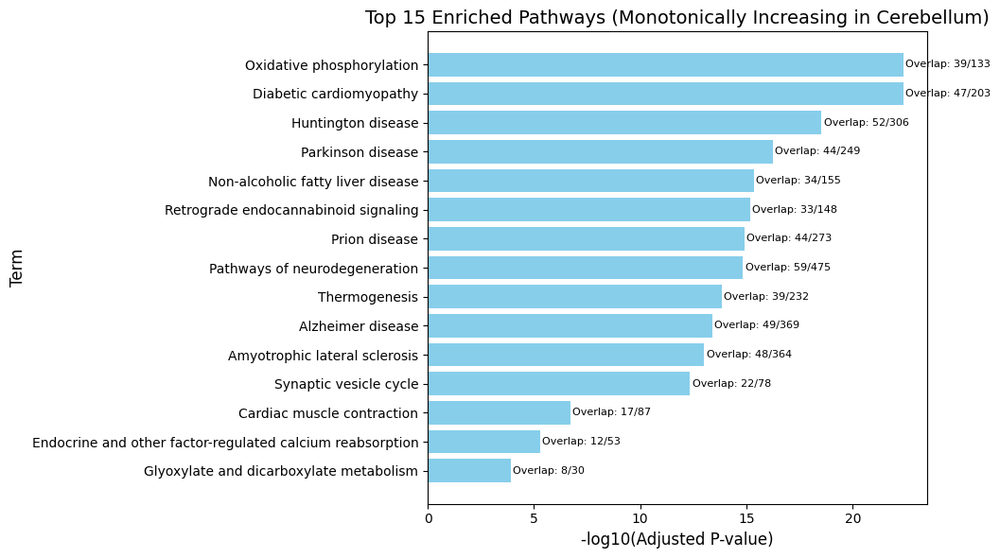


Pathway Enrichment Analysis for Monotonically Decreasing in Cerebellum:
|    | Gene_set        | Term                                        | Overlap   | P-value     | Adjusted P-value   | Old P-value   | Old Adjusted P-value   | Odds Ratio   | Combined Score   | Genes                                                                                                                                                                                                                                                                                                                    |
|:---|:----------------|:--------------------------------------------|:----------|:------------|:-------------------|:--------------|:-----------------------|:-------------|:-----------------|:----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

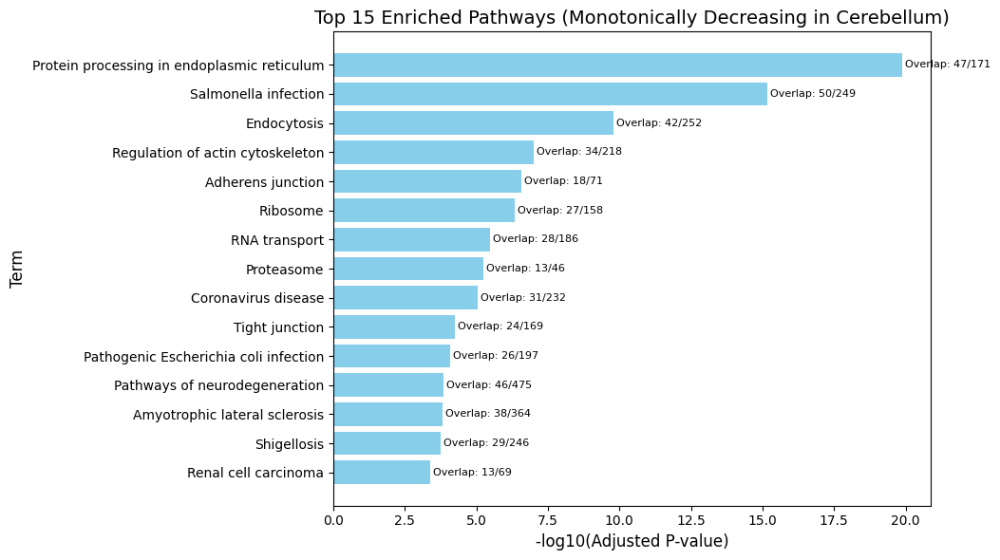


Pathway Enrichment Analysis for Reverse up in Cerebellum:
|    | Gene_set        | Term                                       | Overlap   | P-value     | Adjusted P-value   | Old P-value   | Old Adjusted P-value   | Odds Ratio   | Combined Score   | Genes                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                         |
|:---|:----------------|:-------------------------------------------|:----------|:------------|:-------------------|:--------------|:-----------------------|:-------------|:

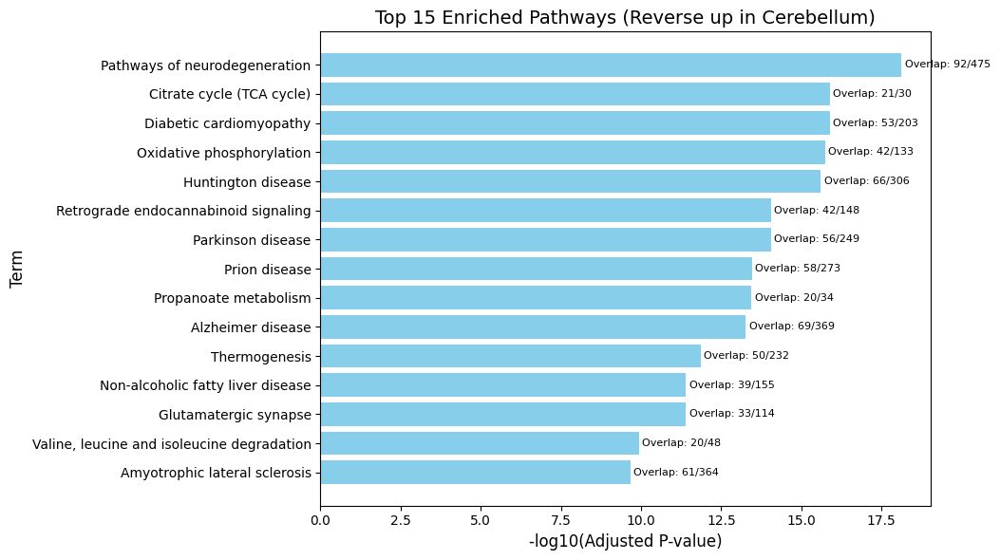


Pathway Enrichment Analysis for Reverse down in Cerebellum:
|    | Gene_set        | Term                                   | Overlap   | P-value     | Adjusted P-value   | Old P-value   | Old Adjusted P-value   | Odds Ratio   | Combined Score   | Genes                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               |
|:---|:----------------|:---------------------------------------|:----------|:------------|:-------------------|:--------------|:-----------------------|:-------------|:-----------------|:-------------

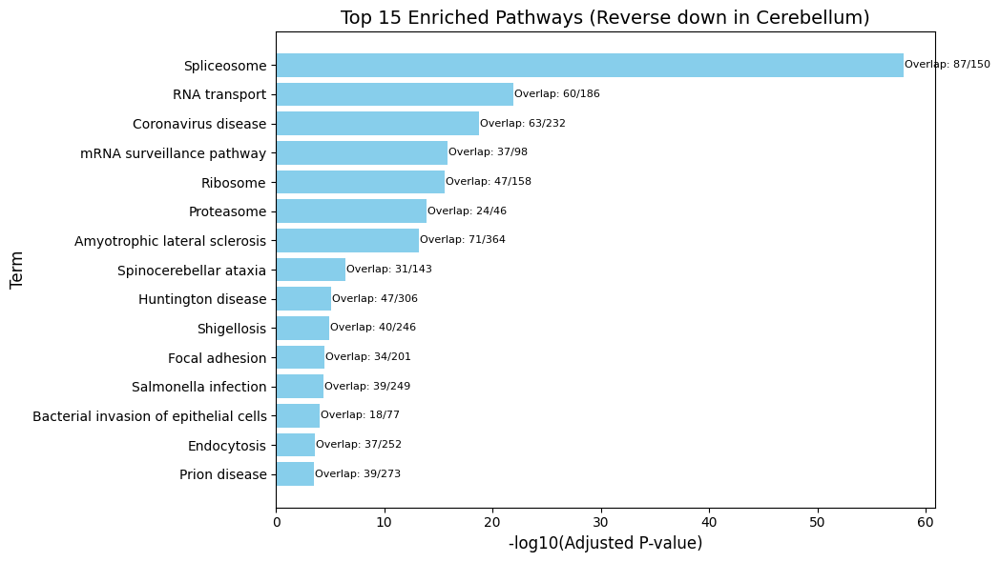


Analyzing Hippocampus

Pathway Enrichment Analysis for Monotonically Increasing in Hippocampus:
|    | Gene_set        | Term                                                       | Overlap   | P-value     | Adjusted P-value   | Old P-value   | Old Adjusted P-value   | Odds Ratio   | Combined Score   | Genes                                                                                                                                                                                                                                                                               |
|:---|:----------------|:-----------------------------------------------------------|:----------|:------------|:-------------------|:--------------|:-----------------------|:-------------|:-----------------|:-----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

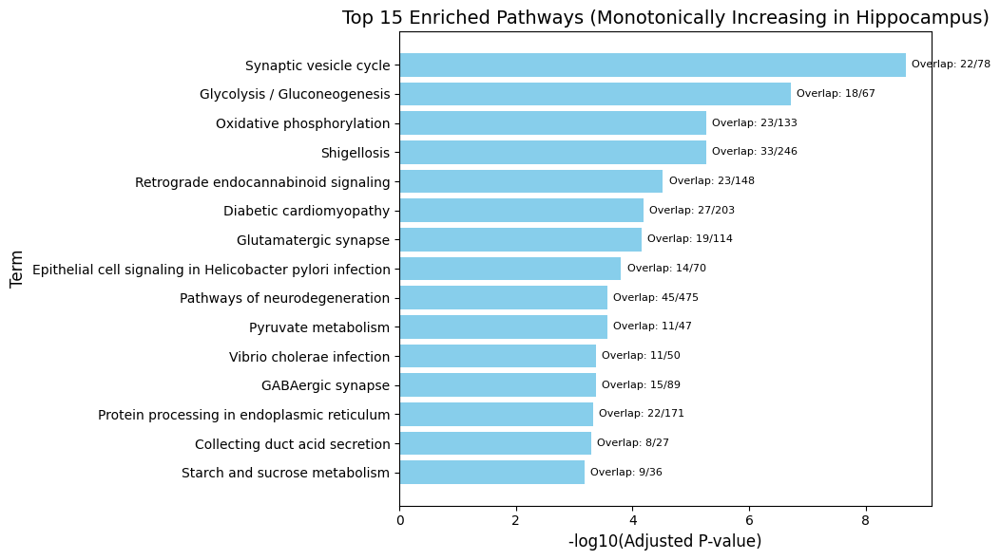


Pathway Enrichment Analysis for Monotonically Decreasing in Hippocampus:
|    | Gene_set        | Term                                        | Overlap   | P-value     | Adjusted P-value   | Old P-value   | Old Adjusted P-value   | Odds Ratio   | Combined Score   | Genes                                                                                                                                                                                                                                                                                                                         |
|:---|:----------------|:--------------------------------------------|:----------|:------------|:-------------------|:--------------|:-----------------------|:-------------|:-----------------|:----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

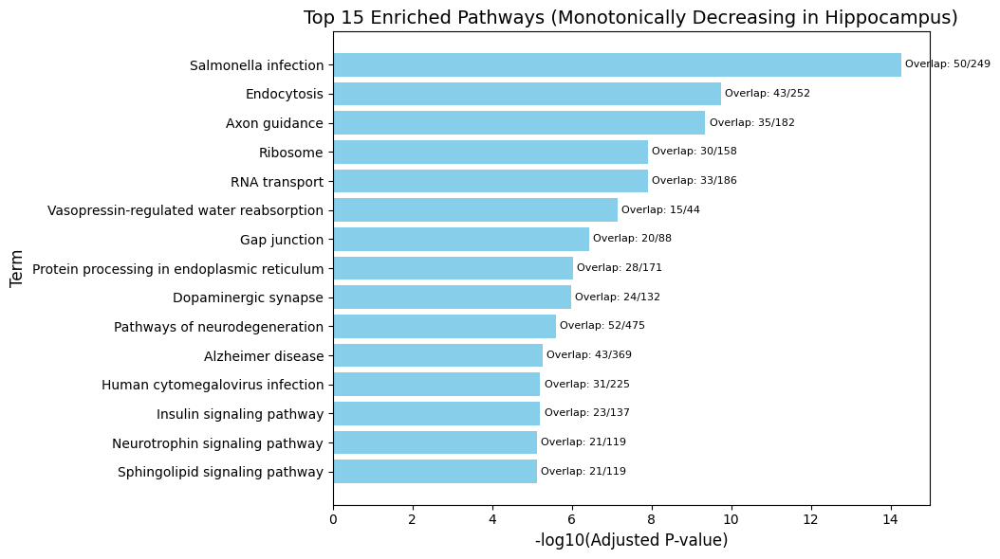


Pathway Enrichment Analysis for Reverse up in Hippocampus:
|    | Gene_set        | Term                                                      | Overlap   | P-value     | Adjusted P-value   | Old P-value   | Old Adjusted P-value   | Odds Ratio   | Combined Score   | Genes                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                     |
|:---|:----------------|:------------------------

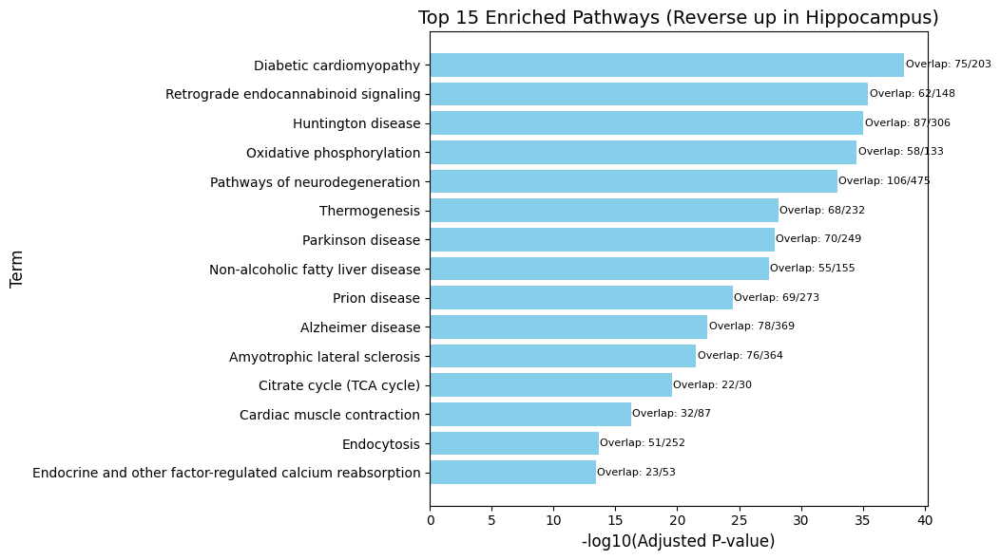


Pathway Enrichment Analysis for Reverse down in Hippocampus:
|    | Gene_set        | Term                                        | Overlap   | P-value     | Adjusted P-value   | Old P-value   | Old Adjusted P-value   | Odds Ratio   | Combined Score   | Genes                                                                                                                                                                                                                                                                                                                                                                                                                                       |
|:---|:----------------|:--------------------------------------------|:----------|:------------|:-------------------|:--------------|:-----------------------|:-------------|:-----------------|:--------------------------------------------------------------------------------------------------------------------------

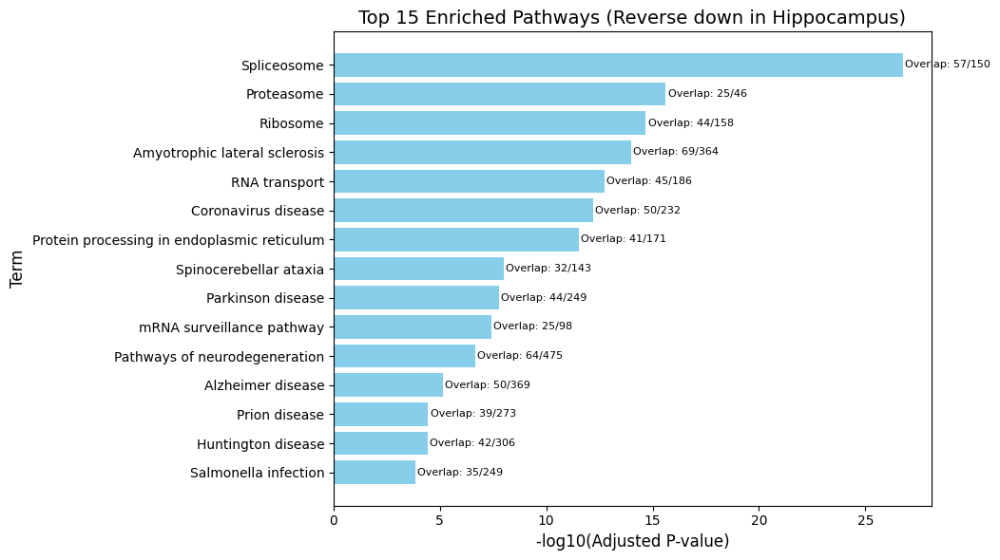


Analyzing Thalamus

Pathway Enrichment Analysis for Monotonically Increasing in Thalamus:
|    | Gene_set        | Term                                                       | Overlap   | P-value     | Adjusted P-value   | Old P-value   | Old Adjusted P-value   | Odds Ratio   | Combined Score   | Genes                                                                                                                                                    |
|:---|:----------------|:-----------------------------------------------------------|:----------|:------------|:-------------------|:--------------|:-----------------------|:-------------|:-----------------|:---------------------------------------------------------------------------------------------------------------------------------------------------------|
| 0  | KEGG_2021_Human | Synaptic vesicle cycle                                     | 21/78     | 1.522e-15   | 4.30727e-13        | 0             | 0                      | 13.48    

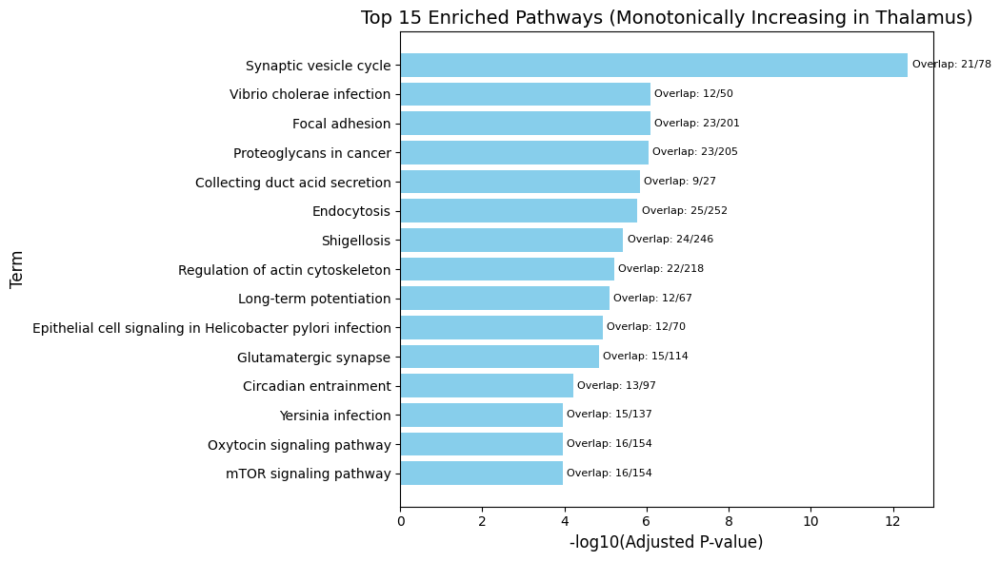


Pathway Enrichment Analysis for Monotonically Decreasing in Thalamus:
|    | Gene_set        | Term                                        | Overlap   | P-value     | Adjusted P-value   | Old P-value   | Old Adjusted P-value   | Odds Ratio   | Combined Score   | Genes                                                                                                                                                                                                                                                                                       |
|:---|:----------------|:--------------------------------------------|:----------|:------------|:-------------------|:--------------|:-----------------------|:-------------|:-----------------|:-----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

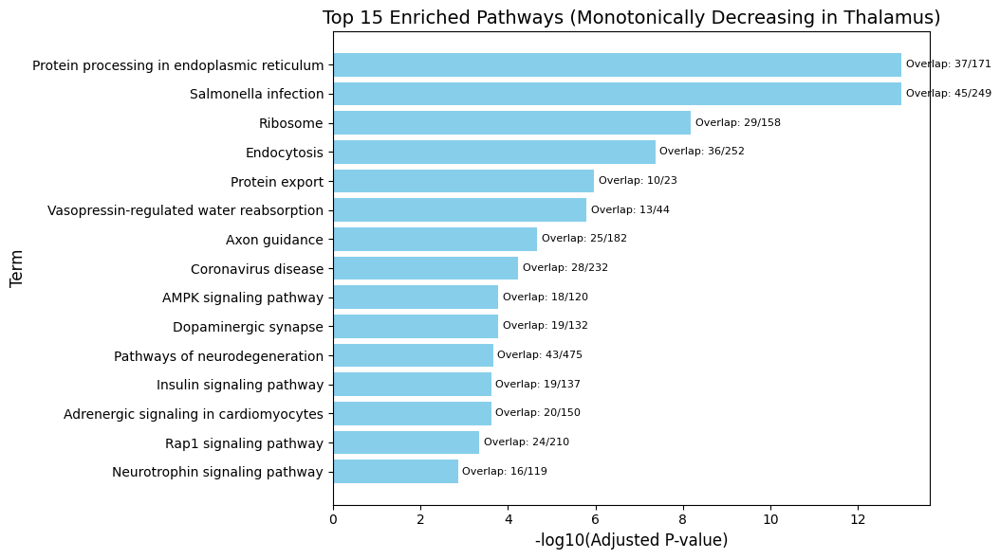


Pathway Enrichment Analysis for Reverse up in Thalamus:
|    | Gene_set        | Term                                        | Overlap   | P-value     | Adjusted P-value   | Old P-value   | Old Adjusted P-value   | Odds Ratio   | Combined Score   | Genes                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    |
|:---|:----------------|:------------------------------------------

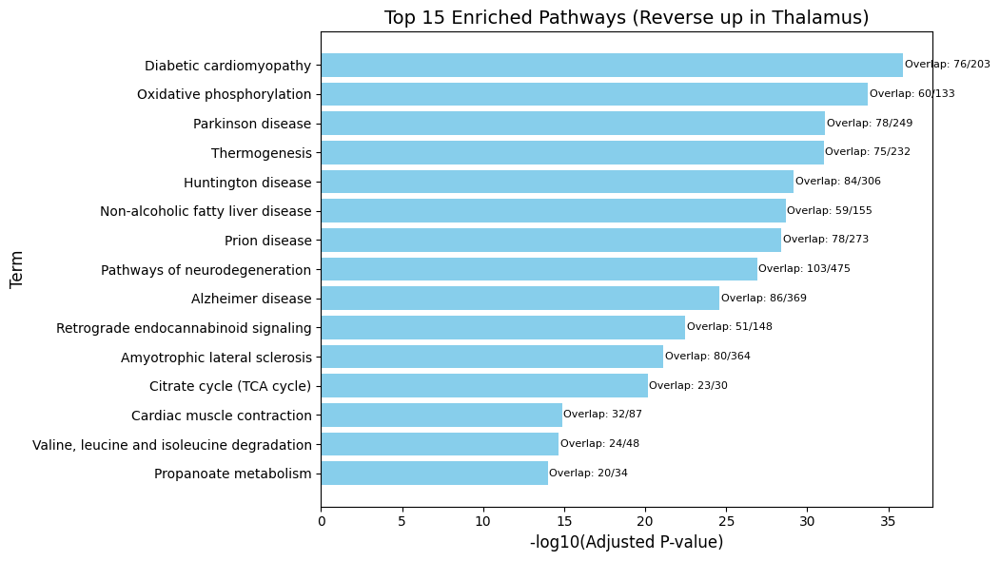


Pathway Enrichment Analysis for Reverse down in Thalamus:
|    | Gene_set        | Term                                        | Overlap   | P-value     | Adjusted P-value   | Old P-value   | Old Adjusted P-value   | Odds Ratio   | Combined Score   | Genes                                                                                                                                                                                                                                                                                                                                                                                                           |
|:---|:----------------|:--------------------------------------------|:----------|:------------|:-------------------|:--------------|:-----------------------|:-------------|:-----------------|:---------------------------------------------------------------------------------------------------------------------------------------------------------

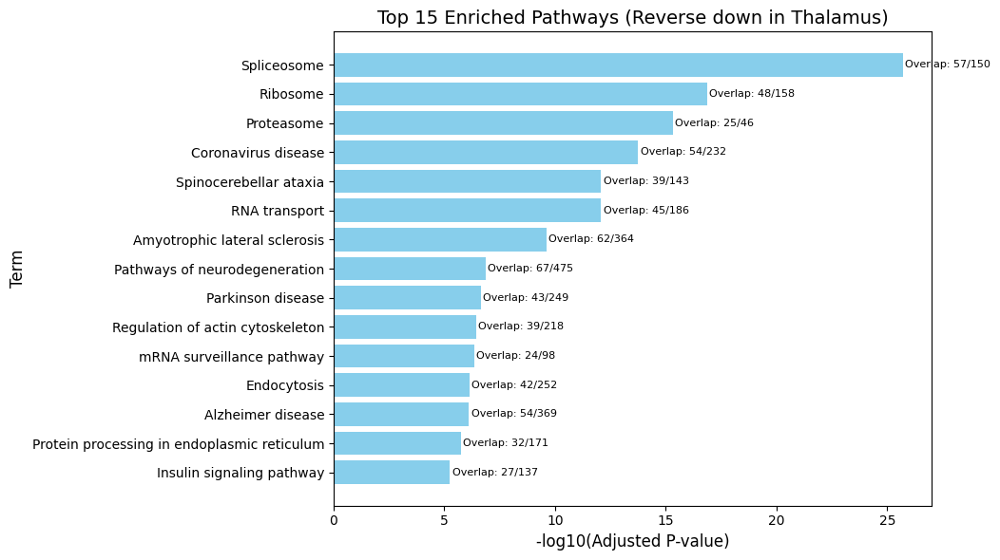


Analyzing DPFC

Pathway Enrichment Analysis for Monotonically Increasing in DPFC:
|    | Gene_set        | Term                                       | Overlap   | P-value     | Adjusted P-value   | Old P-value   | Old Adjusted P-value   | Odds Ratio   | Combined Score   | Genes                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    |
|:---|:----------------|:-------------------------------------------|:----------|:------------|:-------------------|:--------------|:-----------------------|:-------------|:-----------------|:--------------------------

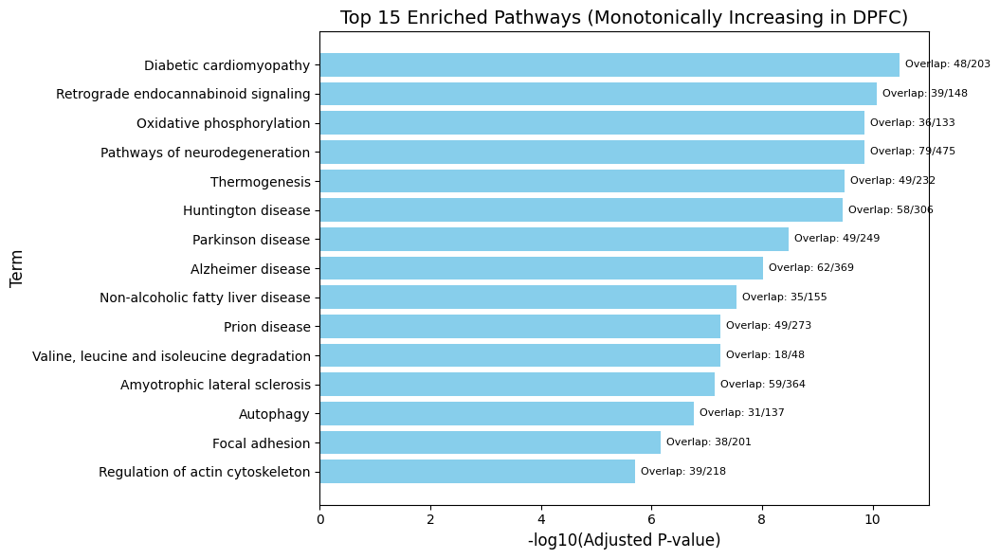


Pathway Enrichment Analysis for Monotonically Decreasing in DPFC:
|    | Gene_set        | Term                                        | Overlap   | P-value     | Adjusted P-value   | Old P-value   | Old Adjusted P-value   | Odds Ratio   | Combined Score   | Genes                                                                                                                                                                                                                                                                                                                                                                                 |
|:---|:----------------|:--------------------------------------------|:----------|:------------|:-------------------|:--------------|:-----------------------|:-------------|:-----------------|:---------------------------------------------------------------------------------------------------------------------------------------------------------------------------

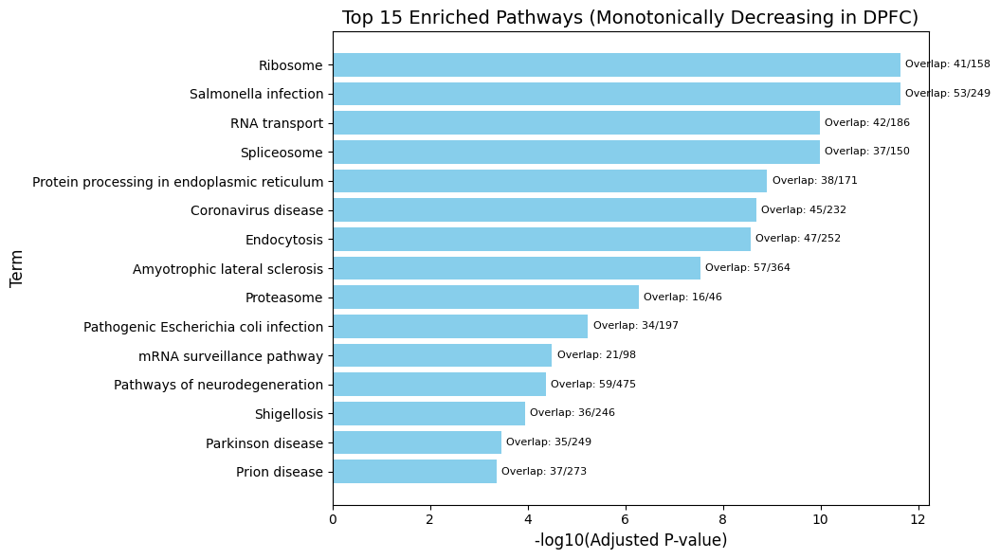


Pathway Enrichment Analysis for Reverse up in DPFC:
|    | Gene_set        | Term                                                      | Overlap   | P-value     | Adjusted P-value   | Old P-value   | Old Adjusted P-value   | Odds Ratio   | Combined Score   | Genes                                                                                                                                                                                                                                                                                                                                                                                                                                                                                           |
|:---|:----------------|:----------------------------------------------------------|:----------|:------------|:-------------------|:--------------|:-----------------------|:-------------|:-----------------|:---------------------------------------------------

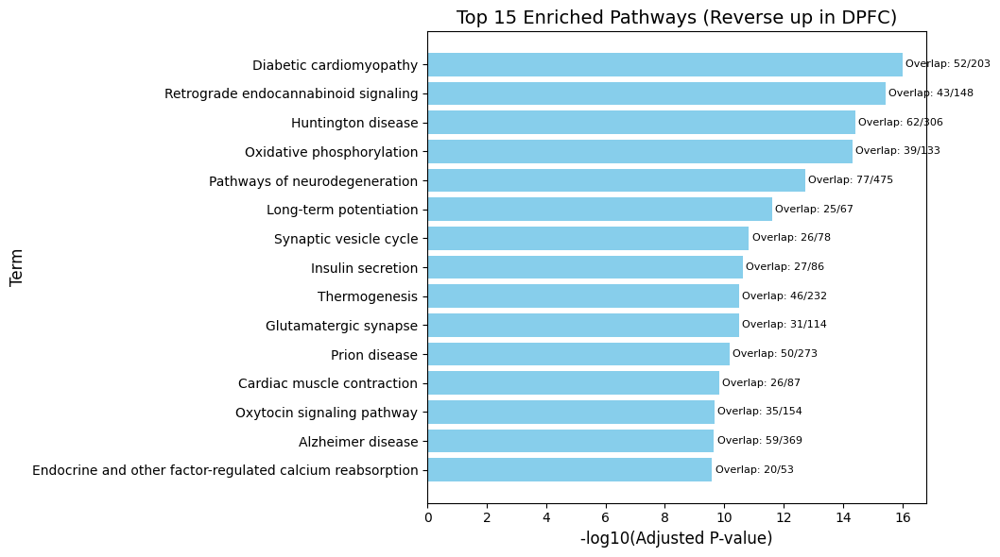


Pathway Enrichment Analysis for Reverse down in DPFC:
|    | Gene_set        | Term                              | Overlap   | P-value     | Adjusted P-value   | Old P-value   | Old Adjusted P-value   | Odds Ratio   | Combined Score   | Genes                                                                                                                                                                                                                                                                                                                                                                                                                               |
|:---|:----------------|:----------------------------------|:----------|:------------|:-------------------|:--------------|:-----------------------|:-------------|:-----------------|:-------------------------------------------------------------------------------------------------------------------------------------------------------------

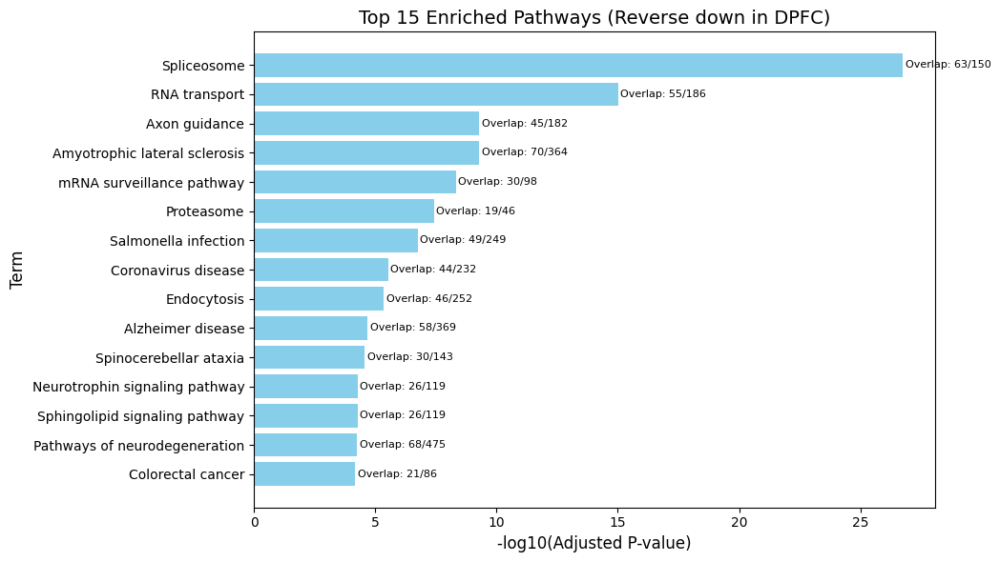

In [ ]:
import pandas as pd
import numpy as np
import gseapy as gp
import matplotlib.pyplot as plt

# Assuming these are your 9 developmental stage columns in order
stage_columns = ['22week_Avg', '26week_Avg', '1year_Avg', '2year_Avg', '4year_Avg', '22year_Avg', '35year_Avg', '47year_Avg', '82year_Avg']
brain_regions = {
    'Cerebellum': None,  # Replace with your actual DataFrames
    'Hippocampus': None,
    'Thalamus': None,
    'DPFC': None
}

# Define the gene sets database. You can change this to 'GO_BP', 'KEGG', etc.
gene_sets_library = 'KEGG_2021_Human'

def calculate_log2_fold_changes(df, stage_columns):
    """
    Calculates log2 fold changes for specified stages relative to the first stage.

    Args:
        df (pd.DataFrame): The input DataFrame.
        stage_columns (list): List of columns representing developmental stages in order.

    Returns:
        pd.DataFrame: The DataFrame with added log2 fold change columns.
    """
    for stage in stage_columns:
        if stage != stage_columns[0]:
            stage1 = stage_columns[0]  # Always compare to the first stage
            log2_fc_col_name = f'{stage}_Log2FC_vs_{stage1}'
            df[log2_fc_col_name] = np.where(
                df[stage1] != 0,
                np.log2(df[stage] / df[stage1]),
                np.nan
            )
    return df

def analyze_protein_trends(df, stage_columns):
    """
    Analyzes protein abundance trends based on log2 fold changes between 26W, 35Y, and 82Y, relative to 22W, using slope analysis.

    Args:
        df (pd.DataFrame): The input DataFrame with expression data.
        stage_columns (list): List of columns representing developmental stages in order.

    Returns:
        pd.DataFrame: DataFrame with added 'Trend' column indicating the trend category.
    """
    df = calculate_log2_fold_changes(df, stage_columns)

    # Define the relevant log2 fold change columns
    log2_fc_26W = f'{stage_columns[1]}_Log2FC_vs_{stage_columns[0]}' # 26week
    log2_fc_35Y = f'{stage_columns[6]}_Log2FC_vs_{stage_columns[0]}' # 35year
    log2_fc_82Y = f'{stage_columns[8]}_Log2FC_vs_{stage_columns[0]}' # 82year

    # Create a function to handle comparisons
    def get_trend(row):
        fc_26 = row[log2_fc_26W]
        fc_35 = row[log2_fc_35Y]
        fc_82 = row[log2_fc_82Y]

        if pd.isna(fc_26) or pd.isna(fc_35) or pd.isna(fc_82):
            return "Insufficient Data"  # Handle cases with missing data

        # Calculate slopes between the three time points
        slope_26_35 = fc_35 - fc_26
        slope_35_82 = fc_82 - fc_35
        slope_26_82 = fc_82 - fc_26

        # Classify trends based on slopes
        if slope_26_35 > 0 and slope_35_82 > 0 and slope_26_82 > 0:
            return "Monotonically Increasing"
        elif slope_26_35 < 0 and slope_35_82 < 0 and slope_26_82 < 0:
            return "Monotonically Decreasing"
        elif (slope_26_35 > 0 and slope_35_82 < 0):
            return "Reverse up"
        elif (slope_26_35 < 0 and slope_35_82 > 0):
            return "Reverse down"
        elif slope_26_35 == 0 and slope_35_82 == 0:
            return "Plateau"
        else:
            return "Other"

    df['Trend'] = df.apply(get_trend, axis=1)
    return df

def run_gsea(gene_list, description):
    """
    Runs Gene Set Enrichment Analysis (GSEA) on a list of genes.

    Args:
        gene_list (list): A list of gene names (e.g., Entrez IDs).
        description (str): Description for the enrichment analysis.

    Returns:
        gseapy.EnrichmentResult: The result of the GSEA analysis.
    """
    if not gene_list:
        print(f"No genes to run GSEA for: {description}")
        return None

    try:
        enr = gp.enrichr(gene_list=gene_list,
                            gene_sets=gene_sets_library,
                            organism='Human',  # You can change this if needed
                            outdir=None,  # Suppress output to directory
                            )
        return enr
    except Exception as e:
        print(f"Error running GSEA for {description}: {e}")
        return None

def analyze_pathways(df, stage_columns, region_name):
    """
    Analyzes protein abundance trends and performs pathway enrichment analysis for each trend.

    Args:
        df (pd.DataFrame): The input DataFrame with expression data.
        stage_columns (list): List of columns representing developmental stages in order.
        region_name (str): Name of the brain region being analyzed.
    """
    df_analyzed = analyze_protein_trends(df.copy(), stage_columns) # Make a copy to not overwrite

    # Map your protein identifiers to Entrez IDs.  This is crucial for GSEA.
    #  You'll need to replace this with your actual mapping code.
    #  For example, if your DataFrame has a column 'Gene_Symbol', and
    #  you have a mapping dictionary, you'd use that here.
    #  Here's a placeholder:
    gene_id_mapping = {
        gene_name: gene_name  # Placeholder:  Change this!
        for gene_name in df_analyzed.index
    }

    df_analyzed['ID'] = df_analyzed.index.map(gene_id_mapping)

    # Filter out any rows where the Entrez Gene ID is missing
    df_analyzed = df_analyzed[df_analyzed['Gene'].notna()]

    trend_categories = ['Monotonically Increasing', 'Monotonically Decreasing', 'Reverse up', 'Reverse down']

    for trend in trend_categories:
        genes_of_trend = df_analyzed[df_analyzed['Trend'] == trend]
        gene_list = genes_of_trend['Gene'].tolist()  # Get the gene IDs for this trend
        enr = run_gsea(gene_list, trend)  # Run GSEA

        if enr is not None and enr.results is not None and not enr.results.empty:
            print(f"\nPathway Enrichment Analysis for {trend} in {region_name}:")
            print(enr.results.head(20).to_markdown(numalign="left", stralign="left"))

            # --- Modified Plotting Code ---
            enrichment_df = enr.results
            if not enrichment_df.empty:
                # Sort by adjusted p-value
                top_n = 15  # Number of top terms to plot
                sorted_df = enrichment_df.sort_values(by='Adjusted P-value').head(top_n)

                # Calculate -log10(adjusted p-value) for better visualization
                sorted_df['-log10(Adjusted P-value)'] = -np.log10(sorted_df['Adjusted P-value'])

                # Create the bar plot
                plt.figure(figsize=(10, 6))
                bars = plt.barh(sorted_df['Term'], sorted_df['-log10(Adjusted P-value)'], color='skyblue')
                plt.xlabel('-log10(Adjusted P-value)', fontsize=12)
                plt.ylabel('Term', fontsize=12)  # Changed from 'GO Term' to 'Term'
                plt.title(f'Top {top_n} Enriched Pathways ({trend} in {region_name})', fontsize=14)  # Added trend to title
                plt.gca().invert_yaxis()  # To display the most significant terms at the top
                plt.tight_layout()

                # Add the number of overlapping genes to the bars
                for bar, overlap in zip(bars, sorted_df['Overlap']):
                    plt.text(bar.get_width() + 0.1, bar.get_y() + bar.get_height()/2,
                             f"Overlap: {overlap}",
                             va='center', ha='left', fontsize=8)

                plt.show()
            else:
                print(f"No enriched pathways to plot for trend: {trend}")
            # --- End Modified Plotting Code ---

        elif enr is not None:
            print(f"\nNo significant pathways found for trend: {trend}")
        else:
            print(f"\nGSEA analysis was not performed for trend: {trend}")


brain_regions = {
    'Cerebellum': cerebellum_df,
    'Hippocampus': hippocampus_df,
    'Thalamus': thalamus_df,
    'DPFC': dpfc_df
}


for region_name, df in brain_regions.items():
    if df is not None and all(stage in df.columns for stage in stage_columns): # check if df is None
        print(f"\nAnalyzing {region_name}")
        analyze_pathways(df.copy(), stage_columns, region_name)  # Run the pathway analysis.
    else:
        print(f"\nError: Required developmental stage columns not found in the {region_name} DataFrame or DataFrame is None.")



We are using MSstatsTMT for the modelling approaches

In [2]:
from google.colab import files
uploaded = files.upload()
import pandas as pd

dbp_cluster = pd.read_excel('DBP_Supplementary_Table_S5.xlsx')


Saving DBP_Supplementary_Table_S5.xlsx to DBP_Supplementary_Table_S5.xlsx


In [3]:
excel_file = pd.ExcelFile('DBP_Supplementary_Table_S5.xlsx')
print(excel_file.sheet_names)


['Description', ' Cerebellum', 'DPFC', 'Hippocampus', 'Thalamus']


In [4]:
sheet_names = [' Cerebellum', 'DPFC', 'Hippocampus', 'Thalamus']

df_cerebellum_clusters = pd.read_excel('DBP_Supplementary_Table_S5.xlsx', sheet_name=' Cerebellum', header=1)
df_dpfc_clusters       = pd.read_excel('DBP_Supplementary_Table_S5.xlsx', sheet_name='DPFC', header=1)
df_hippocampus_clusters = pd.read_excel('DBP_Supplementary_Table_S5.xlsx', sheet_name='Hippocampus', header=1)
df_thalamus_clusters   = pd.read_excel('DBP_Supplementary_Table_S5.xlsx', sheet_name='Thalamus', header=1)

# Clean up column names for all DataFrames
for df in [df_cerebellum_clusters, df_dpfc_clusters, df_hippocampus_clusters, df_thalamus_clusters]:
    df.columns = df.columns.str.strip()

# Now you can use each DataFrame independently:
print(df_cerebellum_clusters.head())
print(df_dpfc_clusters.head())
print(df_hippocampus_clusters.head())
print(df_thalamus_clusters.head())

   GI acession     Cluster Protein
0    194595509  Cluster  1  SPTAN1
1     52426735  Cluster  1    ANK2
2      5902122  Cluster  1  SPTBN2
3    269954694  Cluster  1   ITPR1
4    269954692  Cluster  1   ITPR1
   GI acession     Cluster Protein
0     52426735  Cluster  1    ANK2
1    365192532  Cluster  1   MYH10
2      4503911  Cluster  1   GAP43
3    156766050  Cluster  1  AHNAK2
4    215982791  Cluster  1   MYO5A
   GI acession     Cluster Protein
0   1001624590  Cluster  1  NMNAT3
1   1002623478  Cluster  1   ANXA4
2     10092677  Cluster  1    PDXP
3     10863899  Cluster  1   NUMBL
4    109148539  Cluster  1    GGT7
   GI acession     Cluster Protein
0    194595509  Cluster  1  SPTAN1
1    112382250  Cluster  1  SPTBN1
2     91208420  Cluster  1     BSN
3     26051204  Cluster  1  CAMK2B
4    150378539  Cluster  1    PCLO


In [5]:
!pip install gseapy seaborn


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 590.8/590.8 kB 9.1 MB/s eta 0:00:00


In [6]:
import gseapy as gp
import pandas as pd
import numpy as np
import time

#print(df_cerebellum_clusters.head())
##print(df_dpfc_clusters.head())
##print(df_hippocampus_clusters.head())
#print(df_thalamus_clusters.head())

# Get unique clusters
clusters = df_thalamus_clusters['Cluster'].unique()
print(clusters)
enrichment_results = []
#gene_sets_library = 'KEGG_2021_Human'
#GO_Biological_Process_2025
gene_sets_library = 'GO_Biological_Process_2025'

for cluster in clusters:
    gene_lists = df_thalamus_clusters[df_thalamus_clusters['Cluster'] == cluster]['Protein']
    gene_lists = [g for g in gene_lists if isinstance(g, str)]
    print(cluster)
    print(len(gene_lists))
    print(gene_lists)
    enr = gp.enrichr(
        gene_list=gene_lists,
        gene_sets=gene_sets_library,
        organism='Human',
        outdir=None
    )
    df = enr.results.copy()
    df['Cluster'] = cluster
    enrichment_results.append(df)
    time.sleep(2)

# Combine all results
all_enrich = pd.concat(enrichment_results, ignore_index=True)


['Cluster  1' 'Cluster  10' 'Cluster  2' 'Cluster  3' 'Cluster  4'
 'Cluster  5' 'Cluster  6' 'Cluster  7' 'Cluster  8' 'Cluster  9']
Cluster  1
44
['SPTAN1', 'SPTBN1', 'BSN', 'CAMK2B', 'PCLO', 'ROCK2', 'DLG4', 'PPP3CA', 'NPTN', 'BAIAP2', 'TAGLN3', 'CKMT1A', 'FLOT1', 'SLC17A7', 'ABR', 'RASAL1', 'SYNGAP1', 'ERC2', 'DNAJC6', 'SCG3', 'SLK', 'PDXP', 'HPCA', 'SYP', 'CPE', 'PDE1A', 'PCDH1', 'HOMER1', 'CYB5R1', 'SH3GL3', 'NT5DC3', 'CYB5R3', 'SLC6A17', 'NPTX1', 'PLEKHA6', 'CADM1', 'PIN1', 'PEX11B', 'CALCOCO1', 'SCAMP5', 'LRRC7', 'MTPN', 'GNG5', 'POMT2']
Cluster  10
10
['TALDO1', 'FMNL2', 'GPD1', 'PSMD12', 'CSNK1E', 'SSBP1', 'APRT', 'CHMP1B', 'ECHDC1', 'ARF6']
Cluster  2
58
['PLEC', 'GFAP', 'MYH9', 'ENO1', 'ATP2B4', 'MSN', 'PALM', 'VCL', 'ACTN4', 'CAP1', 'ACTN1', 'SNCA', 'AHNAK', 'AHCY', 'GRIA2', 'WDR1', 'KBTBD11', 'MAPRE2', 'MAPK1', 'PRKCG', 'DLG2', 'AK1', 'PCSK1N', 'ANXA2', 'MAPK3', 'PSD3', 'GSTM1', 'ATP8A1', 'CPNE6', 'PFN2', 'ESD', 'AK5', 'ADH5', 'DMTN', 'SYN3', 'PSMD9', 'PEA15', 'SH3BGRL', 

In [ ]:
import numpy as np

top_n = 5  # Adjust as needed
plot_data = (
    all_enrich
    .sort_values(['Cluster', 'Adjusted P-value'])
    .groupby('Cluster')
    .head(top_n)
    .copy()
)
def get_gene_count(overlap_str):
    return int(str(overlap_str).split('/')[0])
plot_data['Gene Count'] = plot_data['Overlap'].apply(get_gene_count)
plot_data['-log10 (P)'] = -np.log10(plot_data['Adjusted P-value'])
plot_data['Cluster'] = plot_data['Cluster'].str.replace(r'\s+', ' ', regex=True).str.strip()
plot_data['Cluster_num'] = plot_data['Cluster'].str.extract(r'(\d+)$').astype(int)
plot_data = plot_data.sort_values('Cluster_num').drop('Cluster_num', axis=1)
plot_data = plot_data.reset_index(drop=True)
#print(plot_data.head(20))
print(plot_data['Cluster'].unique())  # Should be ['Cluster 1', ..., 'Cluster 10']
#plot_data['Cluster'] = pd.Categorical(plot_data['Cluster'], categories=cluster_order, ordered=True)
#plot_data.head()

['Cluster 1' 'Cluster 2' 'Cluster 3' 'Cluster 4' 'Cluster 5' 'Cluster 6'
 'Cluster 7' 'Cluster 8' 'Cluster 9' 'Cluster 10']


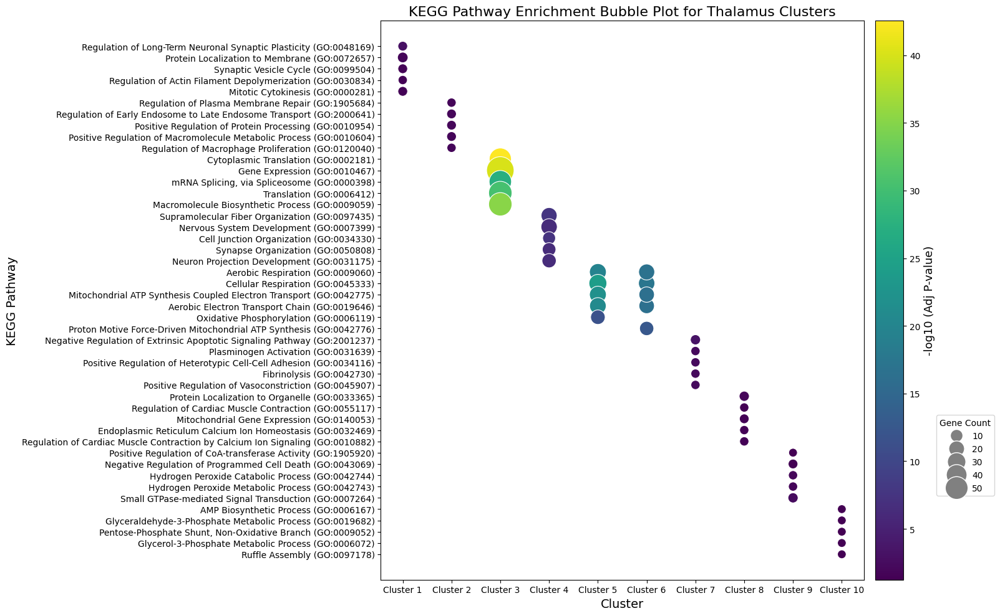

In [ ]:
# 5. Bubble plot with colorbar and custom size legend
plt.figure(figsize=(16, 10))
scatter = sns.scatterplot(
    data=plot_data,
    x='Cluster',
    y='Term',
    size='Gene Count',
    hue='-log10 (P)',
    palette='viridis',
    sizes=(100, 1000),
    legend=False
)

plt.xlabel('Cluster', fontsize=14)
plt.ylabel('KEGG Pathway', fontsize=14)
plt.title('KEGG Pathway Enrichment Bubble Plot for Thalamus Clusters', fontsize=16)

# Colorbar for -log10(P)
norm = plt.Normalize(plot_data['-log10 (P)'].min(), plot_data['-log10 (P)'].max())
sm = plt.cm.ScalarMappable(cmap="viridis", norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ax=scatter, pad=0.02)
cbar.set_label('-log10 (Adj P-value)', fontsize=13)

# Custom legend for bubble size (gene count: 10, 20, 30, 40, 50)
gene_counts = [10, 20, 30, 40, 50]
size_min, size_max = 100, 1000
gene_count_min, gene_count_max = plot_data['Gene Count'].min(), plot_data['Gene Count'].max()
def scale_size(count):
    # Clamp count to data range to avoid negative/too large markers
    count = max(min(count, gene_count_max), gene_count_min)
    if gene_count_max == gene_count_min:
        return size_min
    return size_min + (count - gene_count_min) * (size_max - size_min) / (gene_count_max - gene_count_min)

handles = [Line2D([0], [0], marker='o', color='w',
                  markerfacecolor='gray', markersize=np.sqrt(scale_size(count)),
                  label=str(count)) for count in gene_counts]

plt.legend(
    handles=handles,
    title='Gene Count',
    bbox_to_anchor=(1.15, 0.15),  # Lower right, away from colorbar
    loc='lower left',
    borderaxespad=0.,
    fontsize=10,
    title_fontsize=10
)

plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd
from google.colab import files

In [ ]:
uploaded = files.upload()
filename = list(uploaded.keys())[0]

with open(filename, 'r') as f:
    lines = [line.strip() for line in f if line.strip()]

if len(lines) == 1:
    gene_list = lines[0].split('\t')
else:
    gene_list = lines

print(f"Number of genes: {len(gene_list)}")
print(gene_list[:10])  # Show first 10 genes as a sample

# If you want to skip the first two entries (e.g., headers)
gene_list = gene_list[2:]
print(f"Number of genes after removing first two: {len(gene_list)}")
print(gene_list[:10])


Saving GOCC_SYNAPSE.v2024.1.Hs.gmt to GOCC_SYNAPSE.v2024.1.Hs.gmt
Number of genes: 1494
['GOCC_SYNAPSE', 'https://www.gsea-msigdb.org/gsea/msigdb/human/geneset/GOCC_SYNAPSE', 'AAK1', 'ABCC8', 'ABHD17A', 'ABHD17B', 'ABHD17C', 'ABHD6', 'ABI1', 'ABI2']
Number of genes after removing first two: 1492
['AAK1', 'ABCC8', 'ABHD17A', 'ABHD17B', 'ABHD17C', 'ABHD6', 'ABI1', 'ABI2', 'ABI3', 'ABL1']


In [ ]:
notch_genes_dataset = []
for region, df in brain_regions.items():
    notch_genes_dataset += df[df['Gene'].isin(gene_list)]['Gene'].tolist()
notch_genes_dataset = list(set(notch_genes_dataset))  # Unique accessions for PD genes
print(notch_genes_dataset)
print(len(notch_genes_dataset))
no_of_genes = len(gene_list)

['ACHE', 'PALMD', 'CDH10', 'PSMA7', 'RGS12', 'CYFIP2', 'ERBB4', 'TMED9', 'SV2C', 'GRID2', 'RPL21', 'SLC30A10', 'PLCG1', 'SNPH', 'LPAR1', 'NAPB', 'ARC', 'CNTNAP4', 'MFF', 'USP14', 'GRID2IP', 'SNTA1', 'ELAVL1', 'PSEN1', 'GDI2', 'ATP2B3', 'PLXNA4', 'KALRN', 'ADAM10', 'DGKQ', 'STX4', 'FGB', 'PTPRN', 'RPL19', 'ACTN2', 'RPS11', 'ADARB1', 'P2RX7', 'ASCC1', 'CPEB3', 'NEFH', 'EEF2', 'HCN1', 'CPEB4', 'SYNPR', 'CAPN5', 'CLTB', 'SLC6A7', 'GPHN', 'CNTN2', 'ABLIM3', 'AAK1', 'PTPRT', 'MPP2', 'RABAC1', 'DLGAP4', 'MAPK1', 'ATP2B1', 'GRM7', 'AP3D1', 'PTPRN2', 'EIF3A', 'GRIN1', 'KIRREL3', 'KCNC1', 'ARPC2', 'RPL7', 'RPS14', 'GRM2', 'EXOC4', 'PLXND1', 'SYT4', 'BMPR2', 'DNAJC5', 'RPS3', 'CAMK2N2', 'DPYSL3', 'SPOCK1', 'NPTN', 'PRKACA', 'CTNND2', 'PRKCB', 'PLPPR4', 'RPH3A', 'NPTX2', 'OLFM3', 'APBB1', 'NCDN', 'CAMKV', 'ACTN4', 'GNB1', 'HOMER3', 'ATP1A3', 'C9orf72', 'RAC1', 'NLGN2', 'SDK2', 'FCHO2', 'CYFIP1', 'SHANK1', 'DNM1L', 'EXOC3', 'BAIAP2', 'CNR1', 'PDLIM4', 'ALDH1A1', 'SLC12A4', 'SHANK3', 'SYNGR3', 'MYH1


Analyzing Cerebellum


<ipython-input-111-6de7d84fbfa5>:85: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(


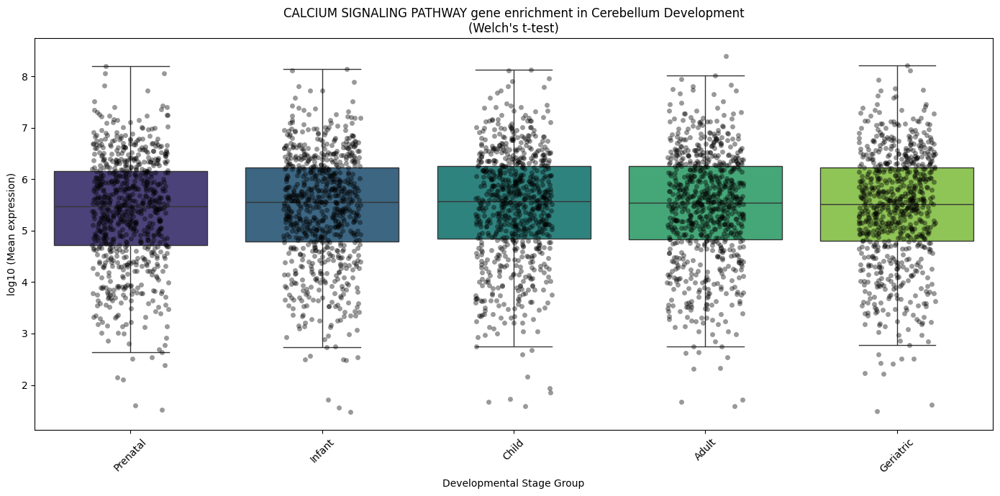


Analyzing Hippocampus


<ipython-input-111-6de7d84fbfa5>:85: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(


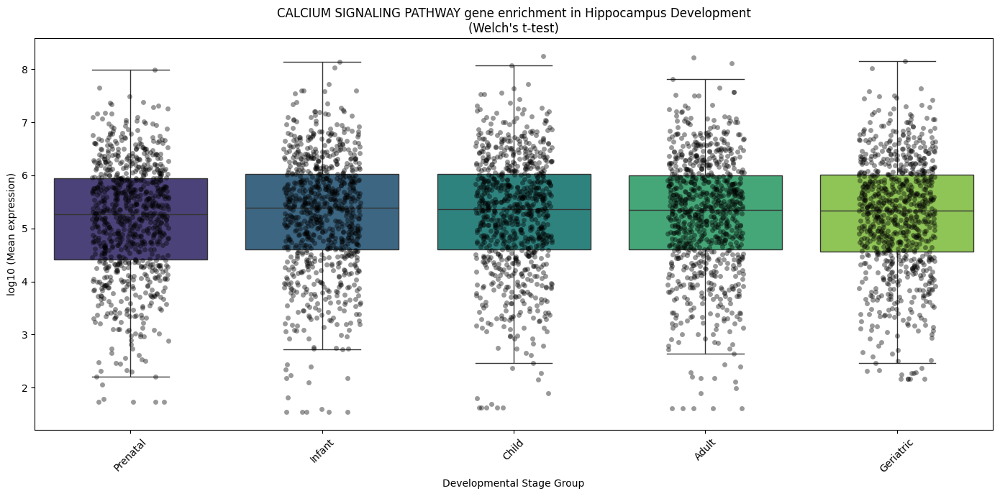


Analyzing DPFC


<ipython-input-111-6de7d84fbfa5>:85: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(


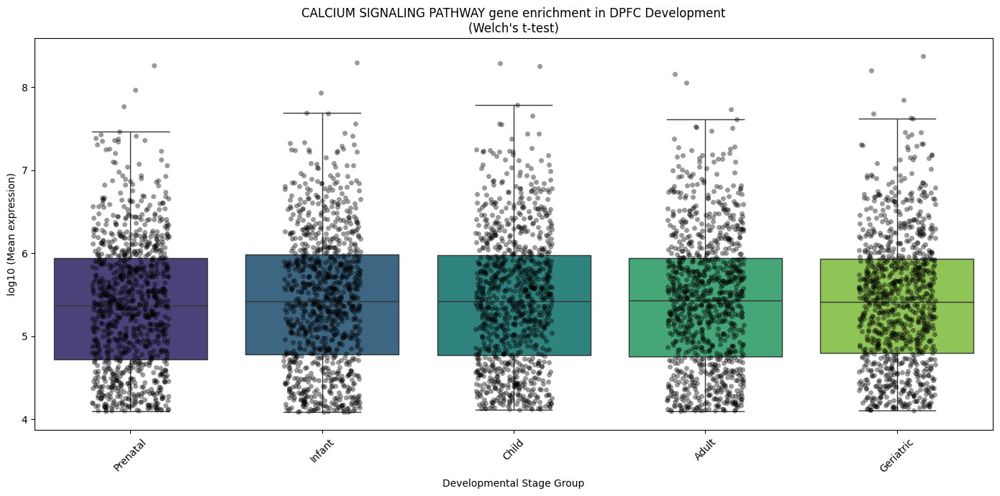


Analyzing Thalamus


<ipython-input-111-6de7d84fbfa5>:85: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(


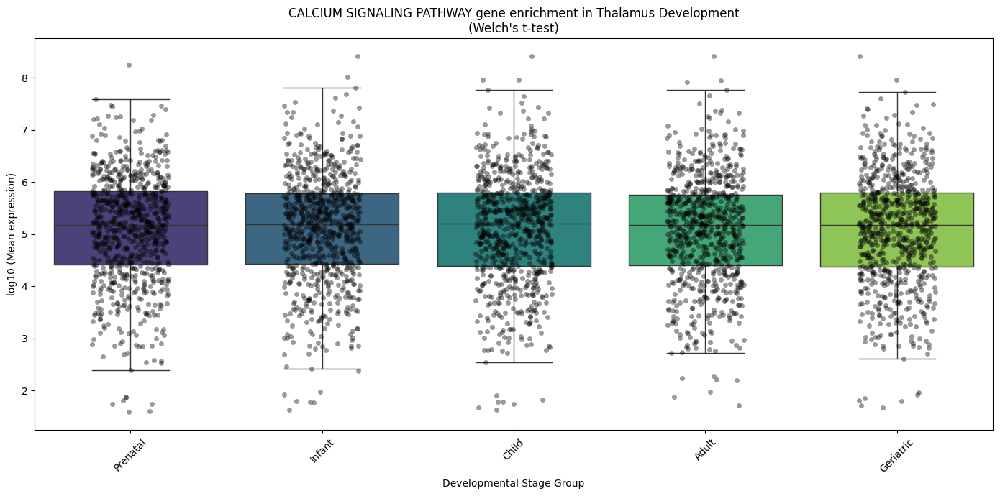



📊 FINAL RESULTS

Region: Cerebellum
Genes found: ['SPTBN1', 'MAP1B', 'ANK2', 'SPTBN2', 'ITPR1', 'ATP1A1', 'ATP1A3', 'HSPA8', 'ATP1A2', 'MAP1A', 'NEFM', 'FLNA', 'ACTG1', 'MYH10', 'ATP2B2', 'TUBB2B', 'MYH9', 'CNTN1', 'TUBA1A', 'STXBP1', 'SYN1', 'AKAP12', 'NSF', 'SPTB', 'DPYSL3', 'GDI1', 'ATP2B1', 'CNP', 'DNM1', 'KIF5C', 'ANK3', 'NEFL', 'STX1B', 'ALDH1A1', 'ATP2B4', 'BSN', 'MAPT', 'ACTN4', 'VCP', 'NEFH', 'ATP6V1A', 'GAP43', 'RTN4', 'CANX', 'INA', 'YWHAZ', 'VDAC1', 'ATP6V0A1', 'MECP2', 'ANK1', 'ATP2B3', 'TUFM', 'TNR', 'SNAP25', 'SRCIN1', 'PSD3', 'EEF1A2', 'EEF2', 'SYT1', 'GDI2', 'NAPB', 'PTPRZ1', 'PCLO', 'HNRNPUL2', 'ATP2A2', 'YWHAQ', 'SH3GL2', 'ADD1', 'SLC8A2', 'CAMK2B', 'AMPH', 'CYFIP2', 'CTTN', 'PARK7', 'AP2B1', 'SLC12A5', 'DNM3', 'CADM3', 'CALB1', 'TLN2', 'SYNJ1', 'HNRNPM', 'SYT2', 'DBN1', 'SNCA', 'GNB1', 'ADD2', 'YWHAG', 'NRCAM', 'FGB', 'YWHAH', 'PACSIN1', 'SYNE1', 'DMXL2', 'AP2A1', 'VDAC3', 'CLASP2', 'AP2A2', 'HNRNPD', 'VCAN', 'NAPA', 'SRGAP2', 'DLG2', 'DCLK1', 'AP2M1', 'CTNNB1', '

In [ ]:
import pandas as pd
import numpy as np
from scipy import stats
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Configuration - MUST SET THESE VALUES
# -------------------------------------------------
stage_groups = {
    'Prenatal': ['22week', '26week'],
    'Infant': ['1year', '2year'],
    'Child': ['4year'],
    'Adult': ['22year', '35year', '47year'],
    'Geriatric': ['82year']
}

PATHWAY = "CALCIUM SIGNALING PATHWAY"
regions = ['Cerebellum', 'Hippocampus', 'DPFC', 'Thalamus']
stage_columns = ['22week_Avg', '26week_Avg', '1year_Avg', '2year_Avg',
                '4year_Avg', '22year_Avg', '35year_Avg', '47year_Avg', '82year_Avg']

# YOU MUST DEFINE THESE IN YOUR ENVIRONMENT:
# brain_regions = {...}  # Dictionary of DataFrames for each region
# gene_list = [...]      # List of genes in the spliceosome pathway
# no_of_genes = ...      # Total genes in the pathway

# 2. Analysis Function
# -------------------------------------------------
def analyze_region(region, brain_regions, gene_list, no_of_genes):
    try:
        # Load data
        df = brain_regions[region].copy()
        notch_df = df[df['Gene'].isin(gene_list)].copy()

        if notch_df.empty:
            print(f"\n⚠️ No genes found in {region} - skipping")
            return None

        # Melt to long format
        melted = notch_df.melt(
            id_vars=['Gene', 'Accession'],
            value_vars=stage_columns,
            var_name='Stage',
            value_name='Expression'
        )

        # Clean and process
        melted['Stage'] = melted['Stage'].str.replace('_Avg', '')
        melted['Stage_Group'] = melted['Stage'].apply(
            lambda x: next((k for k, v in stage_groups.items() if x in v), 'Unknown')
        )

        # Average and transform
        mean_per_gene_group = (
            melted.groupby(['Gene', 'Accession', 'Stage_Group'])['Expression']
            .mean()
            .reset_index()
        )
        mean_per_gene_group['Log10_Expression'] = np.log10(mean_per_gene_group['Expression'])

        # Analysis parameters
        groups_order = ['Prenatal', 'Infant', 'Child', 'Adult', 'Geriatric']
        comparisons = (
            [(groups_order[i], groups_order[i+1]) for i in range(len(groups_order)-1)]
            + [('Prenatal', 'Geriatric')]
        )

        # Welch's t-tests
        significant_comparisons = []
        for g1, g2 in comparisons:
            data1 = mean_per_gene_group[mean_per_gene_group['Stage_Group'] == g1]['Log10_Expression']
            data2 = mean_per_gene_group[mean_per_gene_group['Stage_Group'] == g2]['Log10_Expression']

            if len(data1) > 1 and len(data2) > 1:
                _, p_val = stats.ttest_ind(data1, data2, equal_var=False)
                if p_val < 0.05:
                    significant_comparisons.append({
                        'groups': (g1, g2),
                        'p_val': p_val,
                        'symbol': get_significance(p_val)
                    })

        # Visualization
        plt.figure(figsize=(14, 7))
        ax = sns.boxplot(
            x='Stage_Group',
            y='Log10_Expression',
            data=mean_per_gene_group,
            order=groups_order,
            palette='viridis',
            showfliers=False
        )
        sns.stripplot(
            x='Stage_Group',
            y='Log10_Expression',
            data=mean_per_gene_group,
            order=groups_order,
            color='black',
            alpha=0.4,
            jitter=0.2,
            size=5,
            ax=ax
        )

        # Annotations
        y_max = mean_per_gene_group['Log10_Expression'].max() + 0.5
        for comp in significant_comparisons:
            g1, g2 = comp['groups']
            x1 = groups_order.index(g1)
            x2 = groups_order.index(g2)
            ax.plot([x1, x2], [y_max, y_max], color='k', lw=1)
            ax.text((x1+x2)/2, y_max + 0.1, comp['symbol'], ha='center', va='bottom')
            y_max += 0.5

        plt.title(f'{PATHWAY} gene enrichment in {region} Development\n(Welch\'s t-test)')
        plt.xlabel('Developmental Stage Group')
        plt.ylabel('log10 (Mean expression)')
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()

        # Prepare results
        unique_genes = notch_df['Gene'].unique().tolist()
        duplicate_genes = notch_df[notch_df.duplicated('Gene', keep=False)]['Gene'].unique().tolist()
        count_per_group = mean_per_gene_group['Stage_Group'].value_counts().reindex(groups_order).fillna(0).astype(int)

        return {
            'region': region,
            'genes': unique_genes,
            'duplicates': duplicate_genes,
            'significant_comps': significant_comparisons,
            'counts': count_per_group,
            'total_genes': f"{len(unique_genes)}/{no_of_genes}"
        }

    except KeyError as e:
        print(f"⚠️ Missing data for {region}: {str(e)}")
        return None
    except Exception as e:
        print(f"⚠️ Error in {region}: {str(e)}")
        return None

# 3. Main Execution
# -------------------------------------------------
def get_significance(p_val):
    if p_val < 0.0001: return '****'
    elif p_val < 0.001: return '***'
    elif p_val < 0.01: return '**'
    elif p_val < 0.05: return '*'
    else: return 'ns'

if __name__ == "__main__":
    # Validate inputs
    if 'brain_regions' not in globals():
        raise NameError("❌ brain_regions not defined - load your data first")
    if 'gene_list' not in globals():
        raise NameError("❌ gene_list not defined - specify pathway genes")
    if 'no_of_genes' not in globals():
        raise NameError("❌ no_of_genes not defined - set pathway gene count")

    # Process all regions
    results = []
    for region in regions:
        print(f"\n{'='*40}\nAnalyzing {region}\n{'='*40}")
        result = analyze_region(region, brain_regions, gene_list, no_of_genes)
        if result:
            results.append(result)

    # Print consolidated results
    print("\n\n📊 FINAL RESULTS")
    for res in results:
        print(f"\n{'='*40}\nRegion: {res['region']}")
        print(f"Genes found: {res['genes']}")
        print(f"Duplicates (isoforms): {res['duplicates']}")
        print(f"Unique genes: {res['total_genes']}")
        print("Significant comparisons:")
        for comp in res['significant_comps']:
            print(f"  {comp['groups'][0]} vs {comp['groups'][1]}: "
                  f"p={comp['p_val']:.4f} ({comp['symbol']})")
        print("Data points per group:")
        print(res['counts'])


In [ ]:
import pandas as pd
import numpy as np
from scipy import stats
import matplotlib.pyplot as plt
import seaborn as sns

# ========================
# CONFIGURATION
# ========================
stage_groups = {
    'Prenatal': ['22week', '26week'],
    'Infant': ['1year', '2year'],
    'Child': ['4year'],
    'Adult': ['22year', '35year', '47year'],
    'Geriatric': ['82year']
}

PATHWAY = "KEGG_SPLICEOSOME"
regions = ['Cerebellum', 'Hippocampus', 'DPFC', 'Thalamus']
stage_columns = ['22week_Avg', '26week_Avg', '1year_Avg', '2year_Avg',
                '4year_Avg', '22year_Avg', '35year_Avg', '47year_Avg', '82year_Avg']

# YOU MUST DEFINE THESE IN YOUR ENVIRONMENT:
# brain_regions = {...}  # Dictionary of DataFrames for each region
# gene_list = [...]      # List of genes in the pathway
# no_of_genes = ...      # Total genes in the pathway

# ========================
# ANALYSIS FUNCTIONS
# ========================
def analyze_region(region, brain_regions, gene_list):
    """Full analysis pipeline for a single brain region"""
    try:
        # 1. Load and prepare data
        df = brain_regions[region].copy()
        notch_df = df[df['Gene'].isin(gene_list)].copy()

        if notch_df.empty:
            print(f"⚠️ No genes found in {region}")
            return None

        # 2. Melt to long format
        melted = notch_df.melt(
            id_vars=['Gene', 'Accession'],
            value_vars=stage_columns,
            var_name='Stage',
            value_name='Expression'
        )

        # 3. Clean and transform
        melted['Stage'] = melted['Stage'].str.replace('_Avg', '')
        melted['Expression'] = melted['Expression'] + 1e-9
        melted['Log10_Expression'] = np.log10(melted['Expression'])

        # 4. Assign ordered groups
        group_order = ['Prenatal', 'Infant', 'Child', 'Adult', 'Geriatric']
        melted['Stage_Group'] = melted['Stage'].apply(
            lambda x: next((k for k, v in stage_groups.items() if x in v), 'Unknown')
        )
        melted = melted[melted['Stage_Group'].isin(group_order)]

        # 5. Trend analysis
        # Prepare numeric ordering
        melted['Group_Order'] = melted['Stage_Group'].map(
            {g:i+1 for i,g in enumerate(group_order)}
        )

        # Jonckheere-Terpstra test (ordered trend)
        groups = [melted[melted['Stage_Group'] == g]['Log10_Expression']
                for g in group_order]
        jt_stat, jt_p = stats.jonckheere(groups, alternative='decreasing')

        # Kendall's tau (monotonic correlation)
        tau, tau_p = stats.kendalltau(
            x=melted['Group_Order'],
            y=melted['Log10_Expression']
        )

        # 6. Visualization
        plt.figure(figsize=(12, 6))
        sns.lineplot(
            data=melted,
            x='Stage_Group',
            y='Log10_Expression',
            estimator=np.median,
            ci=95,
            order=group_order,
            color='darkred',
            marker='o',
            markersize=10,
            err_style='bars',
            err_kws={'capsize': 5}
        )

        plt.title(f'{PATHWAY} Expression in {region} Development\n'
                f'Jonckheere-Terpstra p={jt_p:.4f}, Kendall τ={tau:.2f}')
        plt.xlabel('Developmental Stage Group')
        plt.ylabel('Log10 Expression')
        plt.xticks(rotation=45)
        plt.grid(alpha=0.2)
        plt.tight_layout()
        plt.show()

        # 7. Effect size calculation
        prenatal = melted[melted['Stage_Group'] == 'Prenatal']['Log10_Expression']
        geriatric = melted[melted['Stage_Group'] == 'Geriatric']['Log10_Expression']
        cohen_d = (np.median(prenatal) - np.median(geriatric)) / np.sqrt(
            (np.var(prenatal) + np.var(geriatric)) / 2
        )

        # 8. Compile results
        return {
            'region': region,
            'jt_stat': jt_stat,
            'jt_p': jt_p,
            'tau': tau,
            'tau_p': tau_p,
            'cohen_d': cohen_d,
            'genes_found': len(notch_df['Gene'].unique()),
            'total_genes': len(gene_list)
        }

    except Exception as e:
        print(f"⚠️ Error processing {region}: {str(e)}")
        return None

# ========================
# MAIN EXECUTION
# ========================
if __name__ == "__main__":
    # Validate inputs
    required_vars = ['brain_regions', 'gene_list', 'no_of_genes']
    missing = [var for var in required_vars if var not in globals()]
    if missing:
        raise NameError(f"Missing required variables: {missing}")

    print(f"\n{'='*40}\nAnalyzing {PATHWAY} across {len(regions)} regions\n{'='*40}")

    # Process all regions
    results = []
    for region in regions:
        print(f"\nAnalyzing {region}...")
        region_result = analyze_region(region, brain_regions, gene_list)
        if region_result:
            results.append(region_result)

    # Print final report
    print(f"\n\n{'='*40}\nFINAL RESULTS\n{'='*40}")
    for res in results:
        print(f"\nRegion: {res['region']}")
        print(f"Genes found: {res['genes_found']}/{res['total_genes']}")
        print(f"Jonckheere-Terpstra: J = {res['jt_stat']:.1f}, p = {res['jt_p']:.4f}")
        print(f"Kendall's Tau: τ = {res['tau']:.2f}, p = {res['tau_p']:.4f}")
        print(f"Effect size (Cohen's d): {res['cohen_d']:.2f}")
        print("-"*40)

    print("\nAnalysis complete!")



Analyzing KEGG_SPLICEOSOME across 4 regions

Analyzing Cerebellum...
⚠️ Error processing Cerebellum: module 'scipy.stats' has no attribute 'jonckheere'

Analyzing Hippocampus...
⚠️ Error processing Hippocampus: module 'scipy.stats' has no attribute 'jonckheere'

Analyzing DPFC...
⚠️ Error processing DPFC: module 'scipy.stats' has no attribute 'jonckheere'

Analyzing Thalamus...
⚠️ Error processing Thalamus: module 'scipy.stats' has no attribute 'jonckheere'


FINAL RESULTS

Analysis complete!


2025-05-06 23:26:53,676 [WARNING] Input library not found: WikiPathways_2021_Human. Skip
2025-05-06 23:26:53,677 [WARNING] Input library not found: Brain_GMT. Skip


['SPTAN1', 'PLEC', 'SPTBN1', 'MAP1B', 'DYNC1H1', 'ANK2', 'MAP1A', 'MAP2', 'ATP1A3', 'NEFM', 'BASP1', 'ATP1A1', 'ATP1A2', 'GFAP', 'DPYSL2', 'TUBA4A', 'GAP43', 'HSPA8', 'TUBA3C', 'HSP90AA1', 'MYH10', 'NEFL', 'TUBB2A', 'CNP', 'ALB', 'HSP90AB1', 'TUBB2B', 'ACTG1', 'DPYSL2', 'TUBB4B', 'TUBA1C', 'CLTC', 'STXBP1', 'STXBP1', 'TUBB4A', 'MYO5A', 'SPTBN2', 'CNTN1', 'TUBB', 'AKAP12', 'DPYSL3', 'TUBB3', 'MACF1', 'ANK2', 'NCAM1', 'ATP2B2', 'EPB41L3', 'NCAM1', 'MAPT', 'HK1', 'MAPT', 'MYH9', 'MAP6', 'TLN2', 'ATP5B', 'INA', 'SYN1', 'ATP2B1', 'MAPT', 'YWHAE', 'CKB', 'ALDOA', 'PKM', 'CRMP1', 'VIM', 'TUBA8', 'ATP5A1', 'ENO1', 'NSF', 'NEFH', 'CRMP1', 'KRT2', 'DNM1', 'GAPDH', 'KRT1', 'DNM1', 'ATP2B4', 'YWHAZ', 'ALDOC', 'GPRIN1', 'HSPA4', 'ACTA1', 'ANXA6', 'AP2A1', 'IMMT', 'BSN', 'SNAP25', 'HSPA9', 'NFASC', 'ATP2B3', 'HSPD1', 'MARCKS', 'HSPA12A', 'HSPA1B', 'ACO2', 'YWHAB', 'MAP4', 'YWHAG', 'HSPA2', 'PGK1', 'CAMKV', 'DCTN1', 'SYNJ1', 'GNAO1', 'EPB41L1', 'EPB41L2', 'PGAM1', 'YWHAQ', 'FASN', 'NFASC', 'SNAP25', 

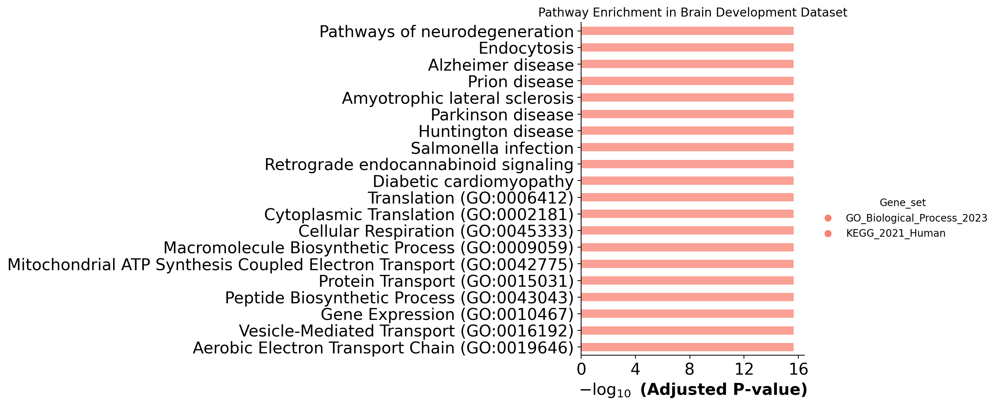

In [ ]:
import pandas as pd
import gseapy as gp
from gseapy.plot import barplot

cerebellum_df = brain_regions[region]
gene_list1 = cerebellum_df['Gene'].copy().tolist()

print(gene_list1)
print(len(gene_list1))
gene_list1 = [str(g).strip() for g in gene_list1 if pd.notnull(g)]
gene_list1 = [g for g in gene_list1 if g]  # Remove empty strings
print(gene_list1)
print(len(gene_list1))
# 2. Set up pathway databases (combining recommendations from search results)
databases = [
    'KEGG_2021_Human',       # General pathways
    'WikiPathways_2021_Human', # Community-curated
    'GO_Biological_Process_2023', # Broad functional categories
    'Brain_GMT'              # From search result 5 (if available)
]

# 3. Perform enrichment analysis using Enrichr
enr = gp.enrichr(gene_list=gene_list1,
                 gene_sets=databases,
                 organism='Human',
                 outdir=None)  # Set to directory path if saving results

# 4. Process results
results = enr.results.sort_values('Adjusted P-value')

# 5. Visualize top pathways
ax = barplot(enr.results,
             column='Adjusted P-value',
             group='Gene_set',  # Group by pathway database
             size=5,
             top_term=10)  # Show top 10 from each database

plt.title('Pathway Enrichment in Brain Development Dataset')
plt.show()

# 6. Save significant results (p < 0.05)
significant_pathways = results[results['Adjusted P-value'] < 0.05]
significant_pathways.to_csv('significant_pathways.csv', index=False)


In [ ]:
# Step 1: Upload the TSV file
from google.colab import files
import pandas as pd
import io
import re

uploaded = files.upload()

filename = list(uploaded.keys())[0]
with open(filename, 'r') as f:
    lines = f.readlines()

split_lines = [re.split(r'\t+', line.strip()) for line in lines]
max_len = max(len(row) for row in split_lines)
padded_lines = [row + [''] * (max_len - len(row)) for row in split_lines]

df = pd.DataFrame(padded_lines)
kegg_human_df = df.T

kegg_human_df.head()
kegg_human_df.columns = kegg_human_df.iloc[0]
kegg_human_df = kegg_human_df.drop(kegg_human_df.index[0])


Saving gene sets for parkinson.gmt to gene sets for parkinson.gmt


In [ ]:
stage_groups = {
    'Prenatal': ['22week', '26week'],
    'Infant': ['1year', '2year'],
    'Child': ['4year'],
    'Adult': ['22year', '35year', '47year'],
    'Geriatric': ['82year']
}

region = 'Thalamus'
df = brain_regions[region]
melted = df.melt(
    id_vars=['Gene', 'Accession'],
    value_vars=stage_columns,
    var_name='Stage',
    value_name='Expression'
)
melted['Stage'] = melted['Stage'].str.replace('_Avg', '')
melted['Stage_Group'] = melted['Stage'].apply(
    lambda x: next((k for k, v in stage_groups.items() if x in v), 'Unknown')
)
mean_per_gene_group = (
    melted.groupby(['Gene', 'Accession', 'Stage_Group'])['Expression']
    .mean()
    .reset_index()
)
pivot = mean_per_gene_group.pivot(index=['Accession', 'Gene'], columns='Stage_Group', values='Expression')
fold_change = pivot.divide(pivot['Prenatal'], axis=0)

print(pivot.head())
print(fold_change.head())

Stage_Group                      Adult          Child      Geriatric  \
Accession  Gene                                                        
1001019337 BCAS3          13271.084765   15759.152960   12939.193390   
1002095800 DDX5           65593.884153   80115.422140   87998.036163   
1002095820 CHCHD6        136950.324144  155472.488400  130509.328833   
1002095835 BOLA2-SMG1P6  138990.470033  142862.682033  118703.635500   
1002341757 ADD3          295064.736600  283916.664300  439602.825533   

Stage_Group                     Infant       Prenatal  
Accession  Gene                                        
1001019337 BCAS3          13350.236125    7811.463037  
1002095800 DDX5           75320.154762  231623.468980  
1002095820 CHCHD6        147437.394833  115480.728288  
1002095835 BOLA2-SMG1P6  118302.017258  251428.654600  
1002341757 ADD3          257978.764100  142277.853572  
Stage_Group                 Adult     Child  Geriatric    Infant  Prenatal
Accession  Gene             

In [ ]:


'''
plt.figure(figsize=(10, 6))
for gene in fold_change.index:
    plt.plot(groups_order, fold_change.loc[gene, groups_order], marker='o', alpha=0.4, linewidth=1)

plt.axhline(1, color='gray', linestyle='--', linewidth=1)
plt.xlabel('Developmental Stage Group')
plt.ylabel('Fold Change vs Prenatal (mean expression)')
plt.title(f'Expression Fold Change Trends (vs Prenatal) in {region}')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()
'''

groups_order = ['Prenatal', 'Infant', 'Child', 'Adult', 'Geriatric']

def classify_trend(values, window=3):
    def smooth(arr, w):
        if len(arr) < w:
            return arr
        return np.convolve(arr, np.ones(w)/w, mode='valid')
    smoothed = smooth(values, window)
    if all(smoothed[i] <= smoothed[i+1] for i in range(len(smoothed)-1)):
        return 'increasing'
    elif all(smoothed[i] >= smoothed[i+1] for i in range(len(smoothed)-1)):
        return 'decreasing'
    else:
        return 'other'

trend_results = fold_change[groups_order].apply(lambda row: classify_trend(row.values), axis=1)

trend_dict = trend_results.to_dict()
print(trend_dict)


In [ ]:
print(kegg_human_df.columns)
kegg_human_df.to_csv('kegg_human.csv', index=False)

Index(['Parkinson Disease Markers In Human Substantia Nigra GSE26927',
       'Genes Up-Regulated In Parkinson Disease Markers In Human Substantia Nigra GSE26927',
       'Genes Down-Regulated In Parkinson Disease Markers In Human Substantia Nigra GSE26927'],
      dtype='object', name=0)


In [ ]:
parkinson_kegg_down = kegg_human_df['Genes Down-Regulated In Parkinson Disease Markers In Human Substantia Nigra GSE26927'].dropna().unique().tolist()
parkinson_kegg_up = kegg_human_df['Genes Up-Regulated In Parkinson Disease Markers In Human Substantia Nigra GSE26927'].dropna().unique().tolist()

if 'HDSigDB_Human_2021' in parkinson_kegg_down:
    parkinson_kegg_down.remove('HDSigDB_Human_2021')
if 'HDSigDB_Human_2021' in parkinson_kegg_up:
    parkinson_kegg_up.remove('HDSigDB_Human_2021')

print(parkinson_kegg_up)
print(len(parkinson_kegg_up))

print(parkinson_kegg_down)
print(len(parkinson_kegg_down))



['LRRC1', 'MGAT1', 'FBXL6', 'AFAP1L1', 'SF1', 'PCSK7', 'WDR24', 'TLN1', 'HPN', 'CDAN1', 'LIG1', 'PTBP1', 'NPC1', 'ZC3H18', 'TAF1C', 'ELF4', 'HYAL2', 'CNPY3', 'DFFB', 'TFEB', 'ISYNA1', 'RNF166', 'FGD3', 'P2RX7', 'CLDN9', 'MBP', 'PKN3', 'SH2D3C', 'CREB3L2', 'PARP10', 'CD37', 'PRAM1', 'TMEM170A', 'MFNG', 'RHBDF2', 'CIDEB', 'TPD52L2', 'NCOR2', 'FOXS1', 'SEMA4D', 'TPCN1', 'PGBD2', 'PLIN3', 'ACSS2', 'SLC22A23', 'MAP7D1', 'PACS2', 'TMEM63A', 'CSF1R', 'TBC1D10C', 'CARD9', 'SPTBN5', 'KCTD5', 'TRIM56', 'CBFA2T2', 'ARHGAP22', 'IRF5', 'LTBP3', 'WDR81', 'SYK', 'NCF4', 'ASPRV1', 'PUS1', 'GNAI2', 'PHB', 'CMKLR1', 'GMEB2', 'PLEKHG3', 'DGKD', 'NADK', 'REPIN1', 'TRABD', 'TNFAIP1', 'FGR', 'TRAF4', 'CTCF', 'ZFYVE26', 'SH2B3', 'GUCA1B', 'GGA2', 'MBTPS1', 'ADORA3', 'NKX6-2', 'FAM53B', 'POLG', 'ENPP6', 'TAGLN2', 'CREBBP', 'LAMA5', 'ACTR5', 'BCAT2', 'SLC15A4', 'CBX4', 'GSN', 'RASGRP2', 'INF2', 'ABHD15', 'DOCK10', 'CNNM3', 'LYG1', 'SATB2', 'ATG16L1', 'PHLPP1', 'NFASC', 'FMO3', 'LBR', 'SOX17', 'MCM3', 'TRAM2', 

In [ ]:
# this is for the venn diagram::::

dataset_down_interection = parkinson_kegg_down
dataset_down_interection_genes = []
for region, df in brain_regions.items():
    dataset_down_interection_genes += df[df['Gene'].isin(dataset_down_interection)]['Gene'].tolist()
dataset_down_interection_genes = list(set(dataset_down_interection_genes))  # Unique accessions for PD genes

dataset_up_interection = parkinson_kegg_up
dataset_up_interection_genes = []
for region, df in brain_regions.items():
    dataset_up_interection_genes += df[df['Gene'].isin(dataset_up_interection)]['Gene'].tolist()
dataset_up_interection_genes = list(set(dataset_up_interection_genes))  # Unique accessions for PD genes

print(dataset_down_interection_genes)
print(len(dataset_down_interection_genes))

print(dataset_up_interection_genes)
print(len(dataset_up_interection_genes))

with open('Genes Down-Regulated In Parkinson Disease Markers In Human Substantia Nigra GSE26927_1048genes_and_551_genes_matches_with_our_dataset_filtered_accessions.txt', 'w') as f:
    for accession in dataset_down_interection_genes:
        f.write(f"{accession}\n")

with open('Genes Up-Regulated In Parkinson Disease Markers In Human Substantia Nigra GSE26927_1275genes_and_429_genes_matches_with_our_dataset_filtered_accessions.txt', 'w') as f:
    for accession in dataset_up_interection_genes:
        f.write(f"{accession}\n")


['NDUFAF2', 'AKAP12', 'DDX42', 'GLO1', 'GALNT11', 'PNPLA8', 'CMAS', 'CDC42BPA', 'RAB3C', 'OSBPL6', 'CADM2', 'HMGCLL1', 'CACNB2', 'PCDH7', 'ME1', 'GGCT', 'EPHA5', 'HSPA4L', 'DHX36', 'NIPSNAP1', 'TMEM263', 'SUMO3', 'UPRT', 'GBE1', 'SCP2', 'CSNK2A1', 'KRAS', 'TMEM132B', 'LRPPRC', 'PSMD1', 'GABRA2', 'MAP3K9', 'FARP1', 'LRFN5', 'ARC', 'KCNJ6', 'PPAT', 'SNCG', 'RAB6B', 'XK', 'PDCD10', 'SARNP', 'SLC35F1', 'ACADM', 'SOD1', 'KCND3', 'ARHGAP44', 'PDCD5', 'CISD1', 'RBFOX2', 'SACM1L', 'SYAP1', 'RIMBP2', 'PRMT8', 'GAP43', 'GRIA1', 'NRXN1', 'ELAVL4', 'NDUFAF7', 'SVOP', 'COX7B', 'FUNDC1', 'UQCC1', 'TCEAL2', 'B4GAT1', 'ADGRB3', 'HK1', 'BLVRA', 'TRIM9', 'FABP7', 'DGKI', 'DENR', 'SNAP91', 'JMY', 'SNX25', 'SLC30A9', 'HOOK1', 'GNAL', 'CLTC', 'ALKBH8', 'TTC39C', 'REEP2', 'GPR162', 'PPP4R4', 'SNX10', 'RGS7', 'PLEKHA5', 'FAM210A', 'POLR2E', 'PRKAG2', 'LINGO2', 'CNRIP1', 'SYT4', 'CAMK2D', 'PLD3', 'DPCD', 'PDHX', 'FAM110B', 'MARK1', 'HPCAL4', 'CAMK2B', 'INPP5A', 'SGIP1', 'RRM1', 'MAPK1', 'NUDCD1', 'OCRL', 'NOS

In [ ]:
!pip install venny4py

from venny4py.venny4py import venny4py
from matplotlib_venn import venn3
# Downregulated in Parkinson (87 genes)
genes_down_parkinson_up = [
    'ABAT','ACOT13','ADAM23','ALDH1A1','ALDH5A1','ANK2','AP2A1','APOO','APOOL','ARHGAP44',
    'ATP2B2','ATP6V1C1','ATP6V1F','BSN','CACNB4','CACNG2','CADM2','CADM3','CADPS','CADPS2',
    'CEND1','CISD1','CLTB','CLTC','COX7B','CPLX2','CYB5R1','DDAH1','DLAT','DLD','DNM1L',
    'DPP10','EHD3','FAM162A','FH','GABBR1','GABBR2','GFM1','GNAO1','GNB5','GNG3','GPI',
    'HK1','HSPA4L','IMPA1','INPP5A','LDHB','LSAMP','MAPK1','MAPRE3','ME1','ME3','MRPS36',
    'NCEH1','NDUFA5','NDUFA10','NDUFS1','NEFL','NNT','OGDHL','OXCT1','PDHX','PFKM','PRRT3',
    'PSD3','RAP1GAP','RAPGEF4','RGS7','SCAMP5','SCN2A','SFXN1','SGIP1','SH3GL2','SIAE',
    'SLC2A3','SLC8A2','SLC25A11','SLC25A25','SLC30A9','SNCG','SOD1','SPTBN2','SV2A','SYNE1',
    'SYNE1','SYT1','TMEM30A','TOMM70','UBXN6','VPS13A'
]

# Downregulated in Parkinson (63 genes)
genes_down_parkinson_down = [
    'ADGRL3','ATXN10','BLVRA','CAPRIN1','CEP170','CETN2','CRMP1','CSNK2A1','CTNNA2','DCX',
    'DENR', 'EIF2S1','EXOC1','FKBP3','GAP43','GLOD4','GSK3B','HEBP2','HOOK3','IGSF3','KIAA1143',
    'KIF3A','KPNB1','MACROD2','MAP2','MARK1','MCTS1','NCAM1','NELL2','NRXN1','NRXN2','NUCB2',
    'NUDCD1','PAK3','PDCD5','PPAT','PPFIA2','PPP2R1A','PPP2R5E','PSIP1','PSMD1','PTN','RNMT',
    'RRM1','SARNP','SCFD1','SCRN3','SEC31A','SPAST','STAU2','STX12','SUB1','TAOK1','TBCA',
    'TCEAL5','TSN','TTR','TUBB2B','TUBB3','UBE2V2','UBE3A','VPS26B','XKR4','ZC2HC1A'
]

# Upregulated in Parkinson (43 genes)
genes_up_parkinson_up = [
    'ACADVL','ANLN','APOD','BIN1','CA2','CAV1','CD9','CDC42EP1','CLDN11','CNP','DOCK9','ENPP6',
    'GAS7','GIMAP4','GNG7','GSN','HAPLN2','HSPA2','IDH3B','IDH3G','LAMA5','LHPP','LIPE','MYADM',
    'MYLK','MYO1D','NFASC','PHB','PIP4K2A','PIP4K2C','PPP1R16B','PRUNE2','RAB12','RHOG','SCAMP4',
    'SCCPDH','SEMA4D','SIRT2','SLC6A9','SLC44A1','TECR','TMEM109'
]

# Upregulated in Parkinson (67 genes)
genes_up_parkinson_down = [
    'ACIN1','ACSS2','APLP1','BLMH','CHTOP','CNPY3','COPA','CPNE1','CPNE2','CSK','CSNK2A1','CSNK2A2',
    'CTBP2','CTTN','DDX17','FAM171A1','FLII','FSCN1','GGA1','HIP1','HIP1','HNRNPAB','HNRNPM','IST1',
    'ISYNA1','LBR','MAGED2','MAP7D1','MTA1','NAGK','NDRG1','NXF1','PABPC4','PCBP1','PCBP2','PFAS',
    'PHF5A','PLCG1','PRKCSH','PRPF3','PSME1','PTBP1','PTPN23','RAB8A','RASGRP2','RBM4','RBM22','RCC2',
    'RNPEP','SAMHD1','SF3A2','SMOC1','SNRNP70','SRRM2','SRRT','SRSF6','STT3A','SUN2','SURF4','TAGLN2',
    'TMEM43','TRA2A','TRIM28','U2AF2','UGGT1','YBX1','ZFYVE19'
]
dataset_same_trend = genes_up_parkinson_up + genes_down_parkinson_down
dataset_opposite_trend = genes_up_parkinson_down + genes_down_parkinson_up


In [ ]:
diseases_kegg_1 = parkinson_kegg_down
filtered_accessions = []
for region, df in brain_regions.items():
    filtered_accessions += df[df['Gene'].isin(diseases_kegg_1)]['Accession'].tolist()
filtered_accessions = list(set(filtered_accessions))  # Unique accessions for PD genes

print(filtered_accessions)
print(len(filtered_accessions))
with open('Genes Down-Regulated In Parkinson Disease Markers In Human Substantia Nigra GSE26927_1276genes_and_448_matches_with_our_dataset_filtered_accessions.txt', 'w') as f:
    for accession in filtered_accessions:
        f.write(f"{accession}\n")

['40317626', '57163987', '40806223', '260763876', '38504671', '19923167', '32171205', '609878250', '4507149', '45439370', '52421790', '33695153', '31542723', '13899317', '16950633', '20127551', '25777721', '94536803', '6005995', '556695502', '24307971', '4759212', '85861250', '969536248', '112821690', '29171755', '50345881', '4826673', '111154074', '237757310', '514961956', '24497501', '981220806', '115511032', '18496983', '4501913', '267844824', '22218339', '665505989', '4757798', '7657069', '157412263', '109150427', '19923142', '7662034', '215982791', '11497612', '154354962', '149193321', '48255953', '17933774', '45387951', '217330646', '959092920', '493798972', '22027618', '221307578', '13129148', '19743875', '10567816', '156627563', '33468965', '14249718', '22749183', '193083197', '62821776', '151108509', '117606353', '54607064', '312032453', '147898681', '15718761', '21361399', '93141210', '75677351', '4505143', '12083581', '5453884', '295842359', '116256483', '9966793', '4503051'

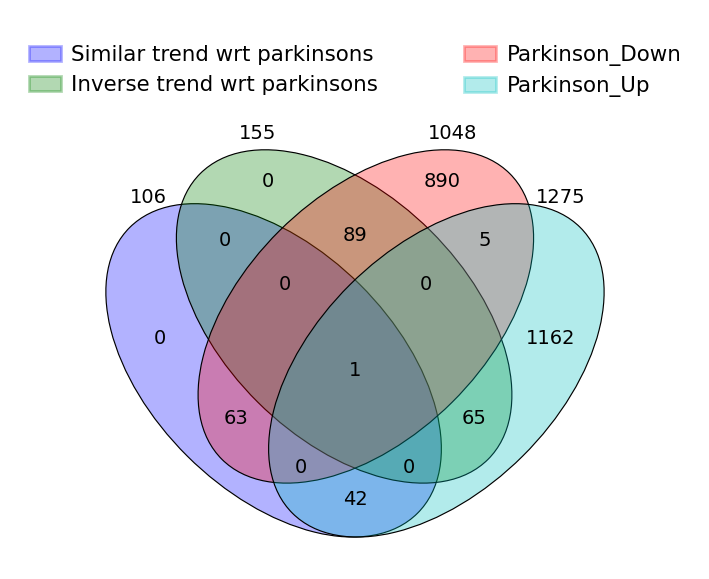

In [ ]:
sets = {
    'Similar trend wrt parkinsons': set(dataset_same_trend),
    'Inverse trend wrt parkinsons': set(dataset_opposite_trend),
    'Parkinson_Down': set(parkinson_kegg_down),
    'Parkinson_Up': set(parkinson_kegg_up)
}

venny4py(sets=sets)
#venn3([set(list1), set(list2), set(list3)], ('List1', 'List2', 'List3'))
#plt.show()

In [ ]:
##pathways associated genes
notch_genes = [
    'TLE7', 'DLL3', 'RBPJL', 'DTX2', 'CREBBP', 'CTBP1', 'CTBP2', 'DTX3L', 'PTCRA', 'JAG1',
    'DTX1', 'DVL1', 'DVL2', 'DVL3', 'DTX3', 'EP300', 'SNW1', 'SPEN', 'DTX4', 'NCSTN',
    'HEY1', 'HEY2', 'KAT2A', 'HEYL', 'DLL1', 'HDAC1', 'HDAC2', 'HES1', 'ATXN1L', 'RBPJ',
    'JAG2', 'HES5', 'LFNG', 'MFNG', 'NRARP', 'NOTCH1', 'NOTCH2', 'NOTCH3', 'NOTCH4', 'APH1A',
    'DLL4', 'MAML3', 'PSENEN', 'PSEN1', 'PSEN2', 'RFNG', 'ATXN1', 'ADAM17', 'TLE1', 'TLE2',
    'TLE3', 'TLE4', 'TLE6', 'APH1B', 'ITCH', 'MAML2', 'NUMB', 'KAT2B', 'NUMBL', 'CIR1',
    'NCOR2', 'MAML1'
]
notch_genes_dataset = []
for region, df in brain_regions.items():
    notch_genes_dataset += df[df['Gene'].isin(notch_genes)]['Gene'].tolist()
notch_genes_dataset = list(set(notch_genes_dataset))  # Unique accessions for PD genes
print(notch_genes_dataset)
print(len(notch_genes_dataset))



['NCOR2', 'CTBP2', 'APH1A', 'SPEN', 'CTBP1', 'TLE4', 'DVL2', 'DVL1', 'ITCH', 'SNW1', 'NUMB', 'PSEN1', 'PSEN2', 'NUMBL', 'HDAC2', 'DTX3', 'DLL1', 'HES1', 'NCSTN']
19


<function dict.items>

<ipython-input-46-7a83e216e816>:77: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(


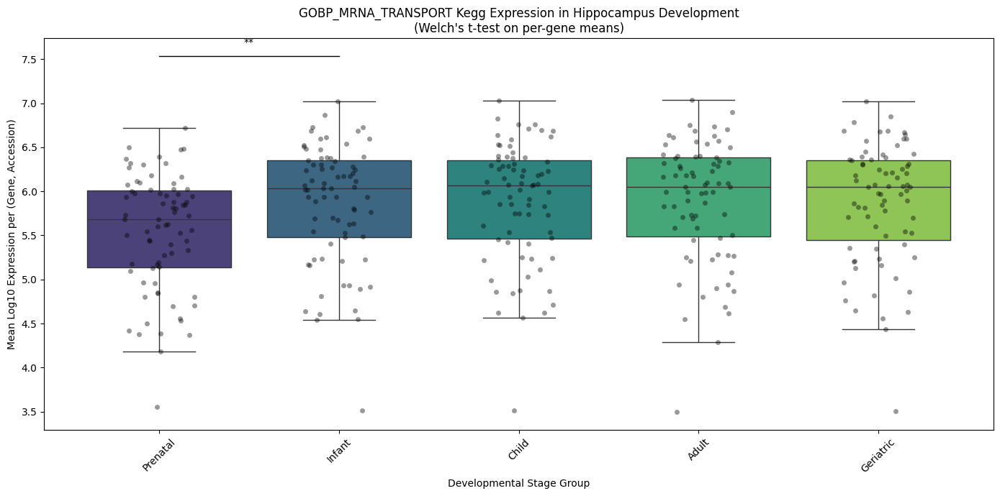

Hippocampus
Genes are: ['NDUFA7', 'NDUFB7', 'PPA1', 'SDHB', 'SDHA', 'UQCRFS1', 'COX5B', 'ATP6AP1', 'COX6A1', 'COX7A2L', 'ATP6V1G2', 'NDUFS7', 'COX5A', 'ATP6V0A1', 'ATP6V1A', 'ATP6V1B2', 'ATP6V0D1', 'NDUFV1', 'CYC1', 'NDUFV2', 'COX7A2', 'LHPP', 'NDUFA11', 'PPA2', 'NDUFC1', 'ATP12A', 'ATP6V0C', 'ATP6V1F', 'NDUFS1', 'NDUFB1', 'UQCR10', 'ATP6V1C1', 'ATP6V1E1', 'COX4I1', 'COX6B1', 'COX7B', 'COX7C', 'NDUFA2', 'NDUFA4', 'NDUFB3', 'NDUFB5', 'NDUFB6', 'NDUFS4', 'NDUFS8', 'SDHC', 'SDHD', 'UQCRC1', 'ATP6V1G1', 'COX6C', 'COX8A', 'NDUFA10', 'NDUFA3', 'NDUFB10', 'NDUFB2', 'NDUFC2', 'NDUFS2', 'NDUFS3', 'NDUFS5', 'NDUFS6', 'ATP6V1H', 'NDUFV3', 'NDUFV3', 'NDUFAB1', 'NDUFB8', 'UQCRC2', 'NDUFA6', 'UQCRB', 'NDUFB4', 'NDUFA5', 'NDUFB9', 'NDUFA9', 'NDUFA8', 'ATP6V1D', 'UQCRQ', 'UQCRH']

Number of genes used for the whole analysis = 75
But here the 'HNRNPU' is present as two isoform genes in our dataset
Unique genes wrt to the total genes in spliceosome pathway = 74/132
Significant pairwise comparisons:
Pren

In [ ]:
# first we use the log10, then avergae the groups then we use the test
import pandas as pd
import numpy as np
from scipy import stats
import matplotlib.pyplot as plt
import seaborn as sns

stage_groups = {
    'Prenatal': ['22week', '26week'],
    'Infant': ['1year', '2year'],
    'Child': ['4year'],
    'Adult': ['22year', '35year', '47year'],
    'Geriatric': ['82year']
}

#Cerebellum, #Hippocampus, #DPFC, #Thalamus
region = 'Hippocampus'
df = brain_regions[region]
notch_df = df[df['Gene'].isin(gene_list)].copy()

# 1. Melt the data to long format
melted = notch_df.melt(
    id_vars=['Gene', 'Accession'],
    value_vars=stage_columns,
    var_name='Stage',
    value_name='Expression'
)
melted['Stage'] = melted['Stage'].str.replace('_Avg', '')

# Convert expression to log10 normalized expression
melted['Expression'] = melted['Expression'] + 1e-9  # avoid log(0)
melted['Log10_Expression'] = np.log10(melted['Expression'])

# 2. Assign stage groups
melted['Stage_Group'] = melted['Stage'].apply(
    lambda x: next((k for k, v in stage_groups.items() if x in v), 'Unknown')
)

groups_order = ['Prenatal', 'Infant', 'Child', 'Adult', 'Geriatric']
comparisons = [(groups_order[i], groups_order[i+1]) for i in range(len(groups_order)-1)]

# 3. Calculate mean log10 expression per (Gene, Accession) per group
mean_per_gene_group = (
    melted.groupby(['Gene', 'Accession', 'Stage_Group'])['Log10_Expression']
    .mean()
    .reset_index()
)

# 4. Perform t-tests on per-gene means between groups
def get_significance(p_val):
    if p_val < 0.0001:
        return '****'
    elif p_val < 0.001:
        return '***'
    elif p_val < 0.01:
        return '**'
    elif p_val < 0.05:
        return '*'
    else:
        return 'ns'

significant_comparisons = []
for g1, g2 in comparisons:
    data1 = mean_per_gene_group[mean_per_gene_group['Stage_Group'] == g1]['Log10_Expression']
    data2 = mean_per_gene_group[mean_per_gene_group['Stage_Group'] == g2]['Log10_Expression']
    if len(data1) > 1 and len(data2) > 1:
        stat, p_val = stats.ttest_ind(data1, data2, equal_var=False)
        symbol = get_significance(p_val)
        if symbol != 'ns':
            significant_comparisons.append({
                'groups': (g1, g2),
                'p_val': p_val,
                'symbol': symbol
            })

# 5. Visualization
plt.figure(figsize=(14, 7))
ax = sns.boxplot(
    x='Stage_Group',
    y='Log10_Expression',
    data=mean_per_gene_group,
    order=groups_order,
    palette='viridis',
    showfliers=False
)
sns.stripplot(
    x='Stage_Group',
    y='Log10_Expression',
    data=mean_per_gene_group,
    order=groups_order,
    color='black',
    alpha=0.4,
    jitter=0.2,
    size=5,
    ax=ax
)

# Annotate significance
y_max = mean_per_gene_group['Log10_Expression'].max() + 0.5
for comp in significant_comparisons:
    g1, g2 = comp['groups']
    x1 = groups_order.index(g1)
    x2 = groups_order.index(g2)
    ax.plot([x1, x2], [y_max, y_max], color='k', lw=1)
    ax.text((x1+x2)/2, y_max + 0.1, comp['symbol'],
            ha='center', va='bottom', color='k')
    y_max += 0.5

plt.title(f'GOBP_MRNA_TRANSPORT Kegg Expression in {region} Development\n(Welch\'s t-test on per-gene means)')
plt.xlabel('Developmental Stage Group')
plt.ylabel('Mean Log10 Expression per (Gene, Accession)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Print results
print(region)
print("Genes are:", notch_df['Gene'].tolist())
print(f"\nNumber of genes used for the whole analysis = {len(notch_df['Gene'])}")

unique_genes = list(set(notch_df['Gene']))
print(f"But here the 'HNRNPU' is present as two isoform genes in our dataset")
print(f"Unique genes wrt to the total genes in spliceosome pathway = {len(set(notch_df['Gene']))}/{no_of_genes}")

print("Significant pairwise comparisons:")
for comp in significant_comparisons:
    print(f"{comp['groups'][0]} vs {comp['groups'][1]}:")
    print(f"  p-value = {comp['p_val']:.5f} ({comp['symbol']})")

print("All pairwise comparisons:")
for g1, g2 in comparisons:
    data1 = mean_per_gene_group[mean_per_gene_group['Stage_Group'] == g1]['Log10_Expression']
    data2 = mean_per_gene_group[mean_per_gene_group['Stage_Group'] == g2]['Log10_Expression']
    if len(data1) > 1 and len(data2) > 1:
        _, p_val = stats.ttest_ind(data1, data2, equal_var=False)
        symbol = get_significance(p_val)
        print(f"{g1} vs {g2}: p = {p_val:.5f} ({symbol})")
    else:

        print(f"{g1} vs {g2}: Insufficient data")

# Count data points per group
count_per_group = mean_per_gene_group['Stage_Group'].value_counts().reindex(groups_order).fillna(0).astype(int)
print("Number of data points per Stage_Group:")
print(count_per_group)



/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:586: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  res = hypotest_fun_out(*samples, **kwds)
<ipython-input-39-c55a6a51fa0b>:95: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(


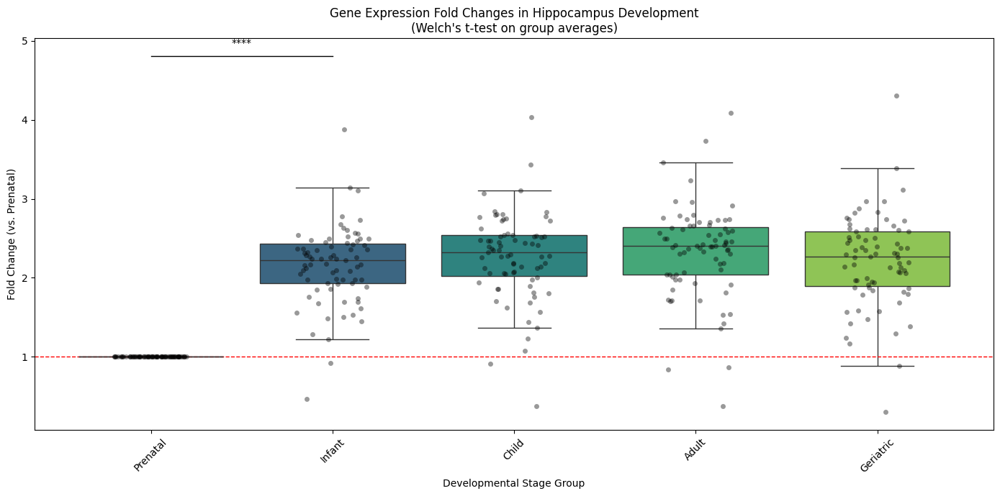

Hippocampus
Genes are: ['NDUFA7', 'NDUFB7', 'PPA1', 'SDHB', 'SDHA', 'UQCRFS1', 'COX5B', 'ATP6AP1', 'COX6A1', 'COX7A2L', 'ATP6V1G2', 'NDUFS7', 'COX5A', 'ATP6V0A1', 'ATP6V1A', 'ATP6V1B2', 'ATP6V0D1', 'NDUFV1', 'CYC1', 'NDUFV2', 'COX7A2', 'LHPP', 'NDUFA11', 'PPA2', 'NDUFC1', 'ATP12A', 'ATP6V0C', 'ATP6V1F', 'NDUFS1', 'NDUFB1', 'UQCR10', 'ATP6V1C1', 'ATP6V1E1', 'COX4I1', 'COX6B1', 'COX7B', 'COX7C', 'NDUFA2', 'NDUFA4', 'NDUFB3', 'NDUFB5', 'NDUFB6', 'NDUFS4', 'NDUFS8', 'SDHC', 'SDHD', 'UQCRC1', 'ATP6V1G1', 'COX6C', 'COX8A', 'NDUFA10', 'NDUFA3', 'NDUFB10', 'NDUFB2', 'NDUFC2', 'NDUFS2', 'NDUFS3', 'NDUFS5', 'NDUFS6', 'ATP6V1H', 'NDUFV3', 'NDUFV3', 'NDUFAB1', 'NDUFB8', 'UQCRC2', 'NDUFA6', 'UQCRB', 'NDUFB4', 'NDUFA5', 'NDUFB9', 'NDUFA9', 'NDUFA8', 'ATP6V1D', 'UQCRQ', 'UQCRH']

Number of genes used for the whole analysis = 75
But here the 'HNRNPU' is present as two isoform genes in our dataset
Unique genes wrt to the total genes in spliceosome pathway = 74/132

Significant pairwise comparisons:
Pre

In [ ]:
import pandas as pd
import numpy as np
from scipy import stats
import matplotlib.pyplot as plt
import seaborn as sns

stage_groups = {
    'Prenatal': ['22week', '26week'],
    'Infant': ['1year', '2year'],
    'Child': ['4year'],
    'Adult': ['22year', '35year', '47year'],
    'Geriatric': ['82year']
}

region = 'Hippocampus'
df = brain_regions[region]
notch_df = df[df['Gene'].isin(gene_list)].copy()

# 1. Preprocess data
melted = notch_df.melt(
    id_vars=['Gene', 'Accession'],
    value_vars=stage_columns,
    var_name='Stage',
    value_name='Expression'
)
melted['Stage'] = melted['Stage'].str.replace('_Avg', '')

# 2. Calculate group means FIRST (as requested)
# -------------------------------------------------
# Calculate prenatal mean for each (Gene, Accession)
prenatal_means = (
    melted[melted['Stage'].isin(stage_groups['Prenatal'])]
    .groupby(['Gene', 'Accession'])['Expression']
    .mean()
    .reset_index()
    .rename(columns={'Expression': 'Prenatal_Mean'})
)

# Calculate mean expression for each group
group_means = (
    melted.groupby(['Gene', 'Accession', 'Stage'])['Expression']
    .mean()
    .reset_index()
    .merge(prenatal_means, on=['Gene', 'Accession'])
)

# Add stage groups
group_means['Stage_Group'] = group_means['Stage'].apply(
    lambda x: next((k for k, v in stage_groups.items() if x in v), 'Unknown')
)

# Calculate fold change relative to prenatal
group_means['Fold_Change'] = (group_means['Expression']) / (group_means['Prenatal_Mean'])

# 3. Aggregate to group level (average across stages in same group)
final_group_means = (
    group_means.groupby(['Gene', 'Accession', 'Stage_Group'])['Fold_Change']
    .mean()
    .reset_index()
)

# 4. Welch's t-test between consecutive groups
groups_order = ['Prenatal', 'Infant', 'Child', 'Adult', 'Geriatric']
comparisons = [(groups_order[i], groups_order[i+1]) for i in range(len(groups_order)-1)]

def get_significance(p_val):
    if p_val < 0.0001:
        return '****'
    elif p_val < 0.001:
        return '***'
    elif p_val < 0.01:
        return '**'
    elif p_val < 0.05:
        return '*'
    else:
        return 'ns'

significant_comparisons = []
for g1, g2 in comparisons:
    data1 = final_group_means[final_group_means['Stage_Group'] == g1]['Fold_Change']
    data2 = final_group_means[final_group_means['Stage_Group'] == g2]['Fold_Change']

    if len(data1) > 1 and len(data2) > 1:
        stat, p_val = stats.ttest_ind(data1, data2, equal_var=False)
        symbol = get_significance(p_val)
        if symbol != 'ns':
            significant_comparisons.append({
                'groups': (g1, g2),
                'p_val': p_val,
                'symbol': symbol
            })

# 5. Visualization
plt.figure(figsize=(14, 7))
ax = sns.boxplot(
    x='Stage_Group',
    y='Fold_Change',
    data=final_group_means,
    order=groups_order,
    palette='viridis',
    showfliers=False
)
sns.stripplot(
    x='Stage_Group',
    y='Fold_Change',
    data=final_group_means,
    order=groups_order,
    color='black',
    alpha=0.4,
    jitter=0.2,
    size=5,
    ax=ax
)

# Add reference line at FC=1
plt.axhline(1, color='red', linestyle='--', linewidth=1)

# Annotate significance
y_max = final_group_means['Fold_Change'].max() + 0.5
for comp in significant_comparisons:
    g1, g2 = comp['groups']
    x1 = groups_order.index(g1)
    x2 = groups_order.index(g2)
    ax.plot([x1, x2], [y_max, y_max], color='k', lw=1)
    ax.text((x1+x2)/2, y_max + 0.1, comp['symbol'],
            ha='center', va='bottom', color='k')
    y_max += 0.5

plt.title(f'Gene Expression Fold Changes in {region} Development\n(Welch\'s t-test on group averages)')
plt.xlabel('Developmental Stage Group')
plt.ylabel('Fold Change (vs. Prenatal)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# ... [Previous code until visualization] ...

# Print results
print(region)
print("Genes are:", notch_df['Gene'].tolist())
print(f"\nNumber of genes used for the whole analysis = {len(notch_df['Gene'])}")

unique_genes = list(set(notch_df['Gene']))
print(f"But here the 'HNRNPU' is present as two isoform genes in our dataset")
print(f"Unique genes wrt to the total genes in spliceosome pathway = {len(set(notch_df['Gene']))}/{no_of_genes}")

print("\nSignificant pairwise comparisons:")
for comp in significant_comparisons:
    print(f"{comp['groups'][0]} vs {comp['groups'][1]}:")
    print(f"  p-value = {comp['p_val']:.5f} ({comp['symbol']})")

print("\nAll pairwise comparisons:")
for g1, g2 in comparisons:
    data1 = mean_per_gene_group[mean_per_gene_group['Stage_Group'] == g1]['Log10_Expression']
    data2 = mean_per_gene_group[mean_per_gene_group['Stage_Group'] == g2]['Log10_Expression']
    if len(data1) > 1 and len(data2) > 1:
        _, p_val = stats.ttest_ind(data1, data2, equal_var=False)
        symbol = get_significance(p_val)
        print(f"{g1} vs {g2}: p = {p_val:.5f} ({symbol})")
    else:
        print(f"{g1} vs {g2}: Insufficient data")

# Count data points per group
count_per_group = mean_per_gene_group['Stage_Group'].value_counts().reindex(groups_order).fillna(0).astype(int)
print("\nNumber of data points per Stage_Group:")
print(count_per_group)

